<a href="https://colab.research.google.com/github/zb15/SM_perceptions_51-Attacks/blob/main/SM_Perceptions_51__attacks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **User Perceptions of Cryptocurrency Attacks**

This notebook accompany our research on 51% attacks on Proof-of-Work (PoW) cryptocurrencies.

If you use it, please cite


---


...

url: https://github.com/zb15/SM_perceptions_51-Attacks

---




# **Datasets**

## **Input**

In [ ]:
import pandas as pd
MyData = pd.read_csv('bitcoin sv2021-08-02.csv')


In [ ]:
myName = "Bitcoin SV 2-9 August 2021"
myUrl = "bitcoin_sv_02_08_2021"

## ***Whole dataset***

### **Cleaning** and **joining** the datasets

In [ ]:
import re
# Operate the data cleaning process on dataframe directly

# Make sure the column 'content' is of string type
MyData['content'] = MyData['content'].apply(str)
#Remove url links
MyData['clean_content'] = MyData['content'].str.replace(r"https?:\/\/\S*", "")
#place hastags to a new column before removing them
MyData['hashtag'] = MyData['content'].apply(lambda x: re.findall(r'\B#\w*[a-zA-Z]+\w*', x))
#place $ cashtags to a new column before removing them
MyData['cashtag'] = MyData['content'].apply(lambda x: re.findall(r'(?i)\$\w+', x))
#place @ mentions to a new column before removing them
MyData['mentions'] = MyData['content'].apply(lambda x: re.findall(r'\B@\w*[a-zA-Z]+\w*', x))
#Remove cashtags and mentions from clean content
MyData['clean_content'] = MyData['clean_content'].str.replace(r"(?i)\$\w+","")
MyData['clean_content'] = MyData['clean_content'].str.replace(r"\B@\w*[a-zA-Z]+\w*","")
# Remove special characters
MyData['clean_content'] = MyData['clean_content'].str.replace("[^a-zA-Z']"," ",regex=True)
# Remove leading and trailing whitespaces
MyData['clean_content'] = MyData['clean_content'].str.strip()
#convert all characters to lower case
MyData['clean_content'] = MyData['clean_content'].str.lower()

MyData.head()

<ipython-input-3-d79fedbb7eec>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  MyData['clean_content'] = MyData['content'].str.replace(r"https?:\/\/\S*", "")
<ipython-input-3-d79fedbb7eec>:15: FutureWarning: The default value of regex will change from True to False in a future version.
  MyData['clean_content'] = MyData['clean_content'].str.replace(r"(?i)\$\w+","")
<ipython-input-3-d79fedbb7eec>:16: FutureWarning: The default value of regex will change from True to False in a future version.
  MyData['clean_content'] = MyData['clean_content'].str.replace(r"\B@\w*[a-zA-Z]+\w*","")


,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,retweetCount,...,media,retweetedTweet,quotedTweet,mentionedUsers,coordinates,place,clean_content,hashtag,cashtag,mentions
0,https://twitter.com/damxchange/status/14248755...,2021-08-09 23:29:27+00:00,The two shouldn’t even be connected. Typical U...,The two shouldn’t even be connected. Typical U...,1424875504503508992,"{'username': 'damxchange', 'displayname': '$Da...",['https://twitter.com/jack/status/142483178763...,['https://t.co/eXynR1Ja3n'],0,0,...,NaN,NaN,{'url': 'https://twitter.com/jack/status/14248...,NaN,NaN,NaN,the two shouldn t even be connected typical u...,"[#BTC, #BSV, #BCH, #ETH, #LTC, #Bitcoin, #Bitc...",[],[]
1,https://twitter.com/shift_observer/status/1424...,2021-08-09 23:25:02+00:00,"@twicrates bitcoin sv ,honeybee","@twicrates bitcoin sv ,honeybee",1424874392232894465,"{'username': 'shift_observer', 'displayname': ...",[],[],0,0,...,NaN,NaN,NaN,"[{'username': 'twicrates', 'displayname': 'MAN...",NaN,NaN,bitcoin sv honeybee,[],[],[@twicrates]
2,https://twitter.com/Tito28934107/status/142486...,2021-08-09 22:59:29+00:00,Ya de regreso después de ir a ganarme un par d...,Ya de regreso después de ir a ganarme un par d...,1424867962406719488,"{'username': 'Tito28934107', 'displayname': 'T...",[],[],0,0,...,[{'previewUrl': 'https://pbs.twimg.com/media/E...,NaN,NaN,NaN,NaN,NaN,ya de regreso despu s de ir a ganarme un par d...,[#BitcoinSV],[],[]
3,https://twitter.com/Mentix9/status/14248667732...,2021-08-09 22:54:46+00:00,@kurtwuckertjr At bitcoin sv you mean,@kurtwuckertjr At bitcoin sv you mean,1424866773216731136,"{'username': 'Mentix9', 'displayname': 'Mentix...",[],[],1,0,...,NaN,NaN,NaN,"[{'username': 'kurtwuckertjr', 'displayname': ...",NaN,NaN,at bitcoin sv you mean,[],[],[@kurtwuckertjr]
4,https://twitter.com/youiti2nz/status/142486148...,2021-08-09 22:33:45+00:00,@BitcoinSV_AUS @fabriik_market @hastearcade @s...,@BitcoinSV_AUS @fabriik_market @hastearcade @s...,1424861486854270981,"{'username': 'youiti2nz', 'displayname': '$you...",[],[],0,0,...,NaN,NaN,NaN,"[{'username': 'BitcoinSV_AUS', 'displayname': ...",NaN,NaN,,[],[],"[@BitcoinSV_AUS, @fabriik_market, @hastearcade..."


In [ ]:
# drop rows which have same clean_content
# and user and keep last (first appearance in time) entry
MyData = MyData.drop_duplicates(
  subset = ['clean_content', 'user'],
  keep = 'last').reset_index(drop = True)

MyData.describe()

,id,replyCount,retweetCount,likeCount,quoteCount,conversationId,retweetedTweet
count,1.823000e+03,1823.000000,1823.000000,1823.000000,1823.000000,1.823000e+03,0.0
mean,1.423413e+18,0.860669,2.779484,5.430060,0.190894,1.423203e+18,NaN
std,6.744127e+14,6.301979,72.850490,52.600126,2.207856,2.080110e+15,NaN
min,1.421990e+18,0.000000,0.000000,0.000000,0.000000,1.385643e+18,NaN
25%,1.422852e+18,0.000000,0.000000,0.000000,0.000000,1.422842e+18,NaN
50%,1.423280e+18,0.000000,0.000000,0.000000,0.000000,1.423238e+18,NaN
75%,1.423997e+18,0.000000,0.000000,1.000000,0.000000,1.423839e+18,NaN
max,1.424876e+18,158.000000,3100.000000,1905.000000,59.000000,1.424876e+18,NaN


In [ ]:
#removing all non english tweets
MyData_en = MyData.drop(MyData[MyData["lang"]!='en'].index)


### Get the **sentiments**

In [ ]:
# Get a bunch of tools from nltk
import re

import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords

# Get English stopwords
en_stopwords = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Import the library for sentiment analysis

nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
# Define some functions for convenience

def getSentScore(text):
  myScore = sia.polarity_scores(text)['compound']
  return(myScore)

In [ ]:
# Generate a new column to store the compound scores

MyData_en['sentiment_score'] = MyData_en.apply(lambda x: getSentScore(x['clean_content']), axis=1)

In [ ]:
# Define some functions for convenience

def getSentCat(text):
  myScore = sia.polarity_scores(text)['compound']
  if myScore >= 0.0005:
    myCat = 'positive'
  elif myScore <= 0.0005:
    myCat = 'negative'
  else:
    myCat = 'neutral'
  return(myCat)

In [ ]:
# Generate a new column to store the sentiment categories classified

MyData_en['sentiment_cat'] = MyData_en.apply(lambda x: getSentCat(x['clean_content']), axis=1)

In [ ]:
pip install text2emotion

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 kB 20.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234926 sha256=a24131fbeff5bdb6af27656607ad3760e375685d02684680af156236dafd6aa8
  Stored in directory: /root/.cache/pip/wheels/02/3d/88/51a592b9ad17e7899126563698b4e3961983ebe85747228ba6
Successfully built emoji


In [ ]:
!pip install emoji==1.7.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171048 sha256=e15f57d99edd73ef2f4e32eaa4dbd01a2ec91ade223a39171afbde3d5ed0e249
  Stored in directory: /root/.cache/pip/wheels/31/8a/8c/315c9e5d7773f74b33d5ed33f075b49c6eaeb7cedbb86e2cf8
Successfully built emoji
  Attempting uninstall: emoji
    Found existing installation: emoji 2.2.0
    Uninstalling emoji-2.2.0:
      Successfully uninstalled emoji-2.2.0


In [ ]:
import text2emotion as te
#import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
# Define some functions for convenience

def getSentEmotions(text):
  myScores1 = te.get_emotion(text)
  return(myScores1)

In [ ]:
# Generate a new column to store the compound scores
#generate a list to store the scores for the 5 emotions

MyData_en['sentiment_emotions'] = MyData_en.apply(lambda x: getSentEmotions(x['clean_content']), axis=1)

In [ ]:
MyData_en['sentiment_emotions'] = MyData_en['sentiment_emotions'].apply(str)
#put the emotion scores in separate columns
MyData_en[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']] = MyData_en['sentiment_emotions'].str.split(',', 5, expand=True)

<ipython-input-18-ad4dbf847064>:3: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  MyData_en[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']] = MyData_en['sentiment_emotions'].str.split(',', 5, expand=True)


In [ ]:
#keep only the scores for the emotions
MyData_en['Happy'] = MyData_en['Happy'].str[9:]
MyData_en['Happy'] = MyData_en['Happy'].astype(float, errors = 'raise')

MyData_en['Angry'] = MyData_en['Angry'].str[9:]
MyData_en['Angry'] = MyData_en['Angry'].astype(float, errors = 'raise')

MyData_en['Surprise'] = MyData_en['Surprise'].str[12:]
MyData_en['Surprise'] = MyData_en['Surprise'].astype(float, errors = 'raise')

MyData_en['Sad'] = MyData_en['Sad'].str[7:]
MyData_en['Sad'] = MyData_en['Sad'].astype(float, errors = 'raise')

MyData_en['Fear'] = MyData_en['Fear'].str[8:-1]
MyData_en['Fear'] = MyData_en['Fear'].astype(float, errors = 'raise')

MyData_en.head()

,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,retweetCount,...,cashtag,mentions,sentiment_score,sentiment_cat,sentiment_emotions,Happy,Angry,Surprise,Sad,Fear
0,https://twitter.com/damxchange/status/14248755...,2021-08-09 23:29:27+00:00,The two shouldn’t even be connected. Typical U...,The two shouldn’t even be connected. Typical U...,1424875504503508992,"{'username': 'damxchange', 'displayname': '$Da...",['https://twitter.com/jack/status/142483178763...,['https://t.co/eXynR1Ja3n'],0,0,...,[],[],0.0000,neutral,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.0,0.00,0.0,0.00
1,https://twitter.com/shift_observer/status/1424...,2021-08-09 23:25:02+00:00,"@twicrates bitcoin sv ,honeybee","@twicrates bitcoin sv ,honeybee",1424874392232894465,"{'username': 'shift_observer', 'displayname': ...",[],[],0,0,...,[],[@twicrates],0.0000,neutral,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.0,0.00,0.0,0.00
3,https://twitter.com/Mentix9/status/14248667732...,2021-08-09 22:54:46+00:00,@kurtwuckertjr At bitcoin sv you mean,@kurtwuckertjr At bitcoin sv you mean,1424866773216731136,"{'username': 'Mentix9', 'displayname': 'Mentix...",[],[],1,0,...,[],[@kurtwuckertjr],0.0000,neutral,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.0,0.00,0.0,0.00
5,https://twitter.com/Richard40029034/status/142...,2021-08-09 21:08:47+00:00,Check out #UnityFundHQ 🚀🚀\n\nMore interesting ...,Check out #UnityFundHQ 🚀🚀\n\nMore interesting ...,1424840102786834434,"{'username': 'Richard40029034', 'displayname':...",[],[],0,2,...,[],[],0.6901,positive,"{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, ...",0.50,0.0,0.00,0.5,0.00
6,https://twitter.com/mauricevachon12/status/142...,2021-08-09 20:53:41+00:00,@CryptoAmerican Next to the nChain Terranode d...,@CryptoAmerican Next to the nChain Terranode d...,1424836304962035717,"{'username': 'mauricevachon12', 'displayname':...",[],[],0,0,...,[],"[@CryptoAmerican, @sinoTrinity]",-0.2516,negative,"{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33...",0.33,0.0,0.33,0.0,0.33


In [ ]:
#MyData_en.to_csv('MyData_en_whole_'+myUrl+'.csv')

### Get the **statistics**

In [ ]:
MyData_en[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']].describe()

,Happy,Angry,Surprise,Sad,Fear
count,1159.000000,1159.000000,1159.000000,1159.000000,1159.000000
mean,0.074961,0.083184,0.103995,0.110923,0.285910
std,0.219482,0.236034,0.233707,0.244516,0.373791
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.500000
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
MyData_en[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']].value_counts()

Happy  Angry  Surprise  Sad   Fear
0.00   0.00   0.00      0.00  0.00    395
                              1.00    170
              0.50      0.00  0.50     80
       1.00   0.00      0.00  0.00     55
       0.00   0.00      0.50  0.50     50
                                     ... 
       0.17   0.17      0.00  0.67      1
0.25   0.00   0.00      0.50  0.25      1
0.00   0.14   0.14      0.57  0.14      1
0.25   0.00   0.25      0.25  0.25      1
0.00   0.00   0.00      0.38  0.62      1
Length: 108, dtype: int64

In [ ]:
#melt data frame into long format
df_melted = pd.melt(MyData_en[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']])

#view first 10 rows of melted data frame
#df_melted.head(10)

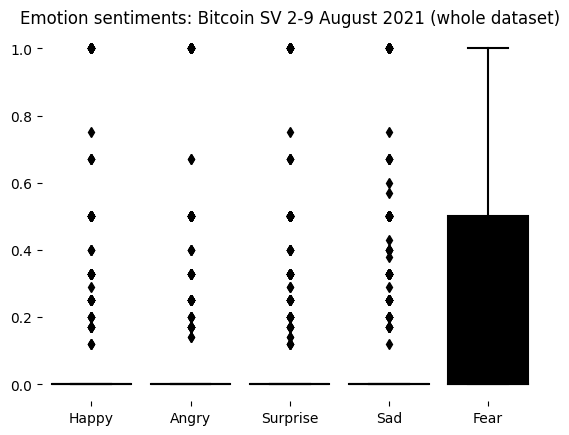

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#create seaborn boxplots by group
sns.boxplot(x='variable', y='value', data=df_melted, palette=["green", "red", "gold", "blue", "black"]).set(title='Emotion sentiments: %s (whole dataset)' % myName)

#modify axis labels
plt.xlabel('')
plt.ylabel('')

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("emotion_sentiments_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

In [ ]:
MyData_en[['sentiment_cat']].value_counts()

sentiment_cat
negative         640
positive         335
neutral          184
dtype: int64

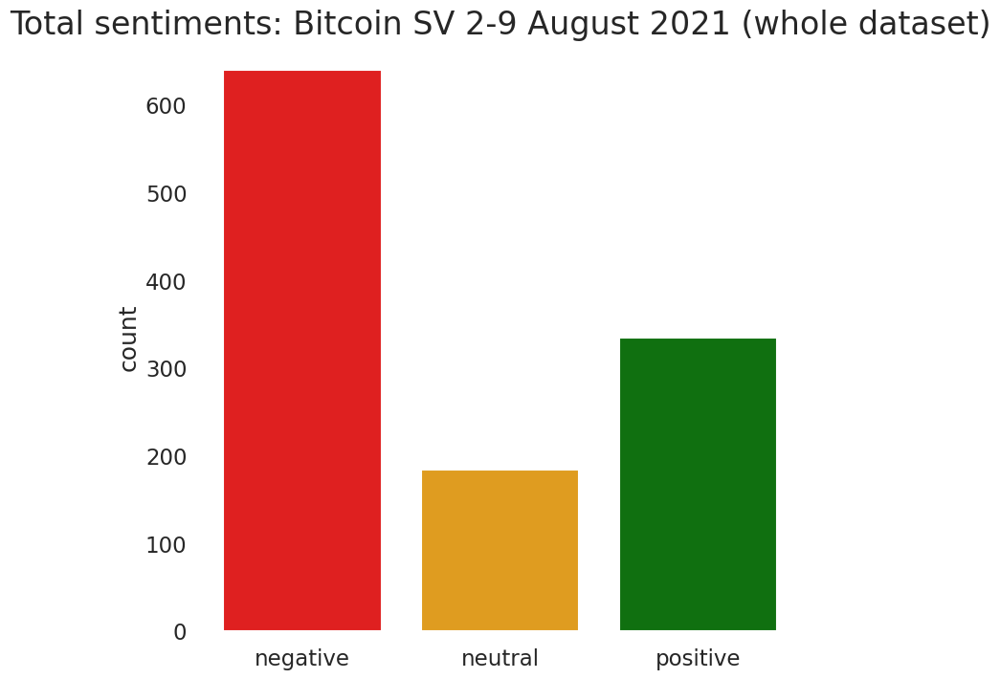

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8,8),
                     sharey=True
                     )

sns.countplot(x="sentiment_cat",
            data=MyData_en,
            order=['negative', 'neutral', 'positive'], # specify the ordering
            palette=["red", "orange", "green"]
            #palette="flare",
            )

ax.set_title('Total sentiments: %s (whole dataset)' % myName,size=24)
ax.set_xlabel('')

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("sentiments_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

### **Timeline** of tweets per day

In [ ]:
import datetime
MyData_en["date_time"] = MyData_en["date"].astype('datetime64[ns]')
MyData_en["date_time"] = MyData_en.date_time.dt.to_pydatetime()

#to have only dates without time
MyData_en["only_date"] = [d.date() for d in MyData_en["date_time"]]

In [ ]:
MyData_en.tail()

,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,retweetCount,...,sentiment_score,sentiment_cat,sentiment_emotions,Happy,Angry,Surprise,Sad,Fear,date_time,only_date
1814,https://twitter.com/freeradical_aus/status/142...,2021-08-02 05:27:03+00:00,"@EdBsv @BitcoinSV_AUS Just don't call this a ""...","@EdBsv @BitcoinSV_AUS Just don't call this a ""...",1422066394976325634,"{'username': 'freeradical_aus', 'displayname':...",[],[],1,0,...,0.7073,positive,"{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, ...",1.0,0.0,0.00,0.00,0.00,2021-08-02 05:27:03,2021-08-02
1815,https://twitter.com/freeradical_aus/status/142...,2021-08-02 04:40:21+00:00,@BitcoinSV_AUS I'd say a change of Government ...,@BitcoinSV_AUS I'd say a change of Government ...,1422054640229646339,"{'username': 'freeradical_aus', 'displayname':...",[],[],2,0,...,0.0000,neutral,"{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, ...",1.0,0.0,0.00,0.00,0.00,2021-08-02 04:40:21,2021-08-02
1816,https://twitter.com/MrTurnip_Head/status/14220...,2021-08-02 04:18:17+00:00,@ChahalV_ bitcoin will keep chainsplitting any...,@ChahalV_ bitcoin will keep chainsplitting any...,1422049087633952769,"{'username': 'MrTurnip_Head', 'displayname': '...",['https://youtu.be/GAMp5V_gG1E'],['https://t.co/uK0DOaWzhX'],0,0,...,0.6626,positive,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67,...",0.0,0.0,0.67,0.00,0.33,2021-08-02 04:18:17,2021-08-02
1818,https://twitter.com/damxchange/status/14220201...,2021-08-02 02:23:25+00:00,Governments Need to Stop Dismissing Crypto as ...,Governments Need to Stop Dismissing Crypto as ...,1422020181509951494,"{'username': 'damxchange', 'displayname': '$Da...",['https://news.bitcoin.com/governments-stop-di...,['https://t.co/CcgJcUcTlv'],1,0,...,0.0258,positive,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...",0.0,0.0,0.00,0.33,0.67,2021-08-02 02:23:25,2021-08-02
1819,https://twitter.com/Bitcoin_Swan/status/142200...,2021-08-02 01:42:08+00:00,Is it true? #BSV #BitcoinSV \n\nhttps://t.co/7...,Is it true? #BSV #BitcoinSV \n\nmylegacykit.me...,1422009789685506051,"{'username': 'Bitcoin_Swan', 'displayname': 'B...",['https://mylegacykit.medium.com/faketoshi-the...,['https://t.co/7CgLtZLvWN'],3,0,...,0.4215,positive,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.00,0.00,0.00,2021-08-02 01:42:08,2021-08-02


In [ ]:
MyData_en.to_csv("Dataset_"+myUrl+".csv")

In [ ]:
neg = MyData_en[MyData_en['sentiment_cat']=='negative']
neg = neg.groupby(['only_date'],as_index=False).count()

pos = MyData_en[MyData_en['sentiment_cat']=='positive']
pos = pos.groupby(['only_date'],as_index=False).count()

neu = MyData_en[MyData_en['sentiment_cat']=='neutral']
neu = neu.groupby(['only_date'],as_index=False).count()

pos = pos[['only_date','id']]
neg = neg[['only_date','id']]
neu = neu[['only_date','id']]

In [ ]:
import plotly.graph_objs as go
import matplotlib.pyplot as plt

fig = go.Figure()
for col in pos.columns:
    fig.add_trace(go.Scatter(x=pos['only_date'], y=pos['id'],
                             name = "positive tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='green'
                             )
                 )

for col in neg.columns:
    fig.add_trace(go.Scatter(x=neg['only_date'], y=neg['id'],
                             name = "negative tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='red'
                             )
                 )

for col in neu.columns:
    fig.add_trace(go.Scatter(x=neu['only_date'], y=neu['id'],
                             name = "neutral tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='orange'
                             )
                 )

fig.update_layout(
    title_font_family="Arial",
    title_font_color="black",
    #title_font_size=30,
    title="Timeline: sentiments in the %s tweets (whole dataset)" % myName
)

fig.write_html("Timeline_sentiments_whole_"+myUrl+".html")

fig.show()


In [ ]:
hap = MyData_en[MyData_en['Happy']!=0.0]
hap = hap.groupby(['only_date'],as_index=False).count()

ang = MyData_en[MyData_en['Angry']!=0.0]
ang = ang.groupby(['only_date'],as_index=False).count()

sur = MyData_en[MyData_en['Surprise']!=0.00]
sur = sur.groupby(['only_date'],as_index=False).count()

sad = MyData_en[MyData_en['Sad']!=0.0]
sad = sad.groupby(['only_date'],as_index=False).count()

fea = MyData_en[MyData_en['Fear']!=0.00]
fea = fea.groupby(['only_date'],as_index=False).count()

neut = MyData_en[(MyData_en['Happy']==0.0) & (MyData_en['Angry']==0.0) & (MyData_en['Surprise']==0.00) & (MyData_en['Sad']==0.0) & (MyData_en['Fear']==0.00)]
neut = neut.groupby(['only_date'],as_index=False).count()

hap = hap[['only_date','id']]
ang = ang[['only_date','id']]
sur = sur[['only_date','id']]
sad = sad[['only_date','id']]
fea = fea[['only_date','id']]
neut = neut[['only_date','id']]

In [ ]:
import plotly.graph_objs as go

fig = go.Figure()
for col in hap.columns:
    fig.add_trace(go.Scatter(x=hap['only_date'], y=hap['id'],
                             name = "tweets with non-zero Happy scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='green'
                             )
                 )

for col in ang.columns:
    fig.add_trace(go.Scatter(x=ang['only_date'], y=ang['id'],
                             name = "tweets with non-zero Angry scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='red'
                             )
                 )

for col in sur.columns:
    fig.add_trace(go.Scatter(x=sur['only_date'], y=sur['id'],
                             name = "tweets with non-zero Surprise scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='yellow'
                             )
                 )

for col in sad.columns:
    fig.add_trace(go.Scatter(x=sad['only_date'], y=sad['id'],
                             name = "tweets with non-zero Sad scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='blue'
                             )
                 )

for col in fea.columns:
    fig.add_trace(go.Scatter(x=fea['only_date'], y=fea['id'],
                             name = "tweets with non-zero Fear scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='black'
                             )
                 )

for col in neut.columns:
    fig.add_trace(go.Scatter(x=neut['only_date'], y=neut['id'],
                             name = "neutral tweets with all zero scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='orange'
                             )
                 )
fig.update_layout(
    title_font_family="Arial",
    title_font_color="black",
    #title_font_size=30,
    title="Timeline: emotions in the %s tweets (whole dataset)" % myName
)

fig.write_html("Timeline_emotions_whole_"+myUrl+".html")

fig.show()


### **Most frequent** word pairs and their bigrams

#### Positive / Negative

In [ ]:
# Get a bunch of tools from nltk

import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import word_tokenize

# Import bigrams
from nltk import bigrams

import itertools

# Get English stopwords
en_stopwords = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataPos = MyData_en[MyData_en['sentiment_cat']=='positive']

# Tokenise each review
myTokensPos = [word_tokenize(review) for review in myDataPos['clean_content']]

# Remove stopwords and lowercase all
# Note that len(review)>2 will make sure at least three words are in a review.
myTokensPos_noSW_noCase = [[word.lower() for word in review if (len(review)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for review in myTokensPos]

# Generate lists of bigrams
myBigramPos = [list(bigrams(review)) for review in myTokensPos_noSW_noCase]

# Put all lists together
myBigramListPos = list(itertools.chain.from_iterable(myBigramPos))

# Get the most frequent ones
bigramFreqPos = FreqDist(myBigramListPos)
bigramFreqPos.most_common(50)

[(('bitcoin', 'bitcoinsv'), 24),
 (('bitcoinsv', 'available'), 15),
 (('free', 'giveaways'), 15),
 (('giveaways', 'remember'), 15),
 (('remember', 'revenue'), 15),
 (('revenue', 'share'), 15),
 (('share', 'button'), 15),
 (('bitcoin', 'price'), 14),
 (('looks', 'like'), 13),
 (('price', 'holds'), 12),
 (('holds', 'despite'), 12),
 (('despite', 'attack'), 12),
 (('bitcoinsv', 'bitcoin'), 9),
 (('bitcoin', 'cash'), 8),
 (('bitcoin', 'gold'), 6),
 (('bitcoin', 'bitcoin'), 5),
 (('bitcoinsv', 'ethereum'), 5),
 (('would', 'like'), 5),
 (('cash', 'bitcoin'), 5),
 (('interesting', 'projects'), 4),
 (('projects', 'bitcoin'), 4),
 (('also', 'hold'), 4),
 (('bitcoinsv', 'price'), 4),
 (('levels', 'interest'), 4),
 (('longer', 'term'), 4),
 (('term', 'caution'), 4),
 (('would', 'love'), 4),
 (('bitcoinsv', 'blockchain'), 4),
 (('crypto', 'bitcoinsv'), 4),
 (('bitcoin', 'virtual'), 4),
 (('virtual', 'meetup'), 4),
 (('meetup', 'apac'), 4),
 (('apac', 'token'), 4),
 (('token', 'usefulness'), 4),
 (

In [ ]:
# Get the bigrams for negative sentiment

# Subset the data
myDataNeg = MyData_en[MyData_en['sentiment_cat']=='negative']

# Tokenise each review
myTokensNeg = [word_tokenize(review) for review in myDataNeg['clean_content']]

# Remove stopwords and lowercase all
# Note that len(review)>2 will make sure at least three words are in a review.
myTokensNeg_noSW_noCase = [[word.lower() for word in review if (len(review)>1) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for review in myTokensNeg]

# Generate lists of bigrams
myBigramNeg = [list(bigrams(review)) for review in myTokensNeg_noSW_noCase]

# Put all lists together
myBigramListNeg = list(itertools.chain.from_iterable(myBigramNeg))

# Get the most frequent ones
bigramFreqNeg = FreqDist(myBigramListNeg)
bigramFreqNeg.most_common(50)

# Convert the result to a dataframe for visualisation
#myDF2Neg = pd.DataFrame(bigramFreqNeg.most_common(30), columns=['word', 'frequency'])

[(('three', 'attacks'), 84),
 (('bitcoin', 'rocked'), 83),
 (('rocked', 'three'), 83),
 (('many', 'months'), 83),
 (('attacks', 'many'), 82),
 (('suffers', 'attack'), 75),
 (('bitcoin', 'suffers'), 62),
 (('another', 'attack'), 62),
 (('bitcoin', 'blockchain'), 46),
 (('suffers', 'another'), 45),
 (('block', 'reorg'), 45),
 (('bitcoinsv', 'chain'), 43),
 (('chain', 'suffers'), 43),
 (('experienced', 'block'), 43),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('bitcoin', 'network'), 36),
 (('suffered', 'attack'), 32),
 (('massive', 'attack'), 31),
 (('crypto', 'coin'), 27),
 (('coin', 'bitcoin'), 27),
 (('bitcoin', 'appears'), 26),
 (('bitcoin', 'suffered'), 25),
 (('world', 'record'), 24),
 (('gigabyte', 'blocks'), 24),
 (('mined', 'bitcoin'), 24),
 (('blocks', 'mined'), 23),
 (('attack', 'three'), 23),
 (('record', 'gigabyte'), 22),
 (('bitcoin', 'attack'), 22),
 (('bitcoin', 'cash'), 21),
 (('faced', 'a

In [ ]:
# Prepare the bigram networks

# We need some libraries
import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout
import matplotlib.pyplot as plt

# Collect the result
myResultPos = bigramFreqPos.most_common(50)
myResultNeg = bigramFreqNeg.most_common(50)

# Construct the network for positives
G_pos = nx.Graph()

# Create connections between nodes
for i in myResultPos:
    G_pos.add_edge(i[0][0], i[0][1], weight=(i[1]))

# Construct the network for negatives
G_neg = nx.Graph()

# Create connections between nodes
for i in myResultNeg:
    G_neg.add_edge(i[0][0], i[0][1], weight=(i[1]))

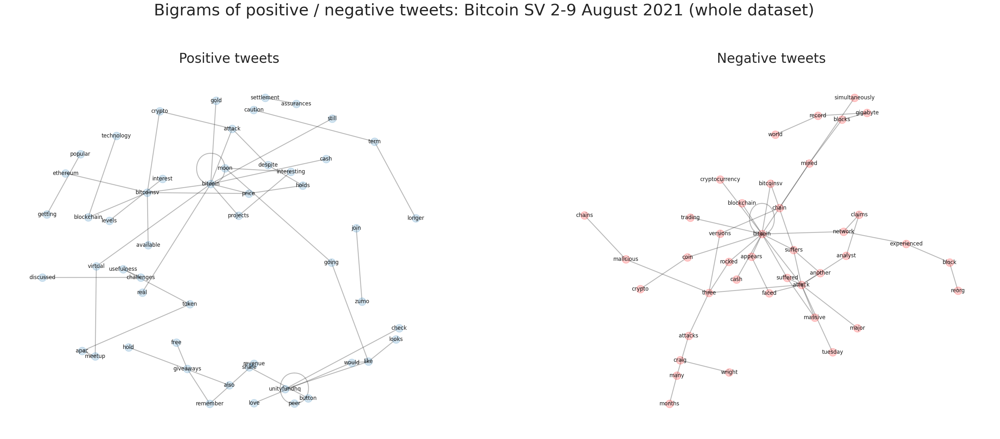

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(1, 2, figsize=(40, 15))

# Subplot1 for positives

# use another layout
#pos_pos = graphviz_layout(G_pos, prog="neato")
pos_pos = nx.spring_layout(G_pos, k=7, seed=9165, iterations=400)

# store the node label information
labelsPos = {}
for node in G_pos.nodes:
    labelsPos[node] = node

# Plot edges
nx.draw_networkx_edges(G_pos, pos_pos, width=2, alpha=0.3, ax=ax[0])
#nx.draw_networkx_edges(G, pos_pos, width=2, alpha=0.3 )


# Plot nodes
nx.draw_networkx_nodes(G_pos, pos_pos, alpha=0.2, label=True, ax=ax[0])

# Add labels
nx.draw_networkx_labels(G_pos, pos_pos, labelsPos, ax=ax[0])

# Turn off the axis
ax[0].axis("off")
# Add title
ax[0].set_title('Positive tweets',fontsize=30)


# Subplot2 for negatives

# use another layout
#pos_neg = graphviz_layout(G_neg, prog="neato")
pos_neg = nx.spring_layout(G_neg, k=7, seed=9165, iterations=400)
#pos_neg = nx.fruchterman_reingold_layout(G_neg, k=5, seed=9165, iterations=400)

# store the node label information
labelsNeg = {}
for node in G_neg.nodes:
    labelsNeg[node] = node

# Plot edges
nx.draw_networkx_edges(G_neg, pos_neg, width=2, alpha=0.3, ax=ax[1])

# Plot nodes
nx.draw_networkx_nodes(G_neg, pos_neg, alpha=0.2,  label=True, ax=ax[1], node_color='red')

# Add labels
nx.draw_networkx_labels(G_neg, pos_neg, labelsNeg, ax=ax[1])

# Add a title
# Use y to increase space
f.suptitle('Bigrams of positive / negative tweets: %s (whole dataset)' % myName,y=1.01, fontsize=36)

# Turn off the axis
ax[1].axis("off")
# Add title
ax[1].set_title('Negative tweets',fontsize=30)

# Save the figure
plt.savefig('conditionalBigram_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Pos = pd.DataFrame(bigramFreqPos.most_common(30), columns=['word', 'frequency'])

# Convert the result to a dataframe for visualisation
myDF2Neg = pd.DataFrame(bigramFreqNeg.most_common(30), columns=['word', 'frequency'])

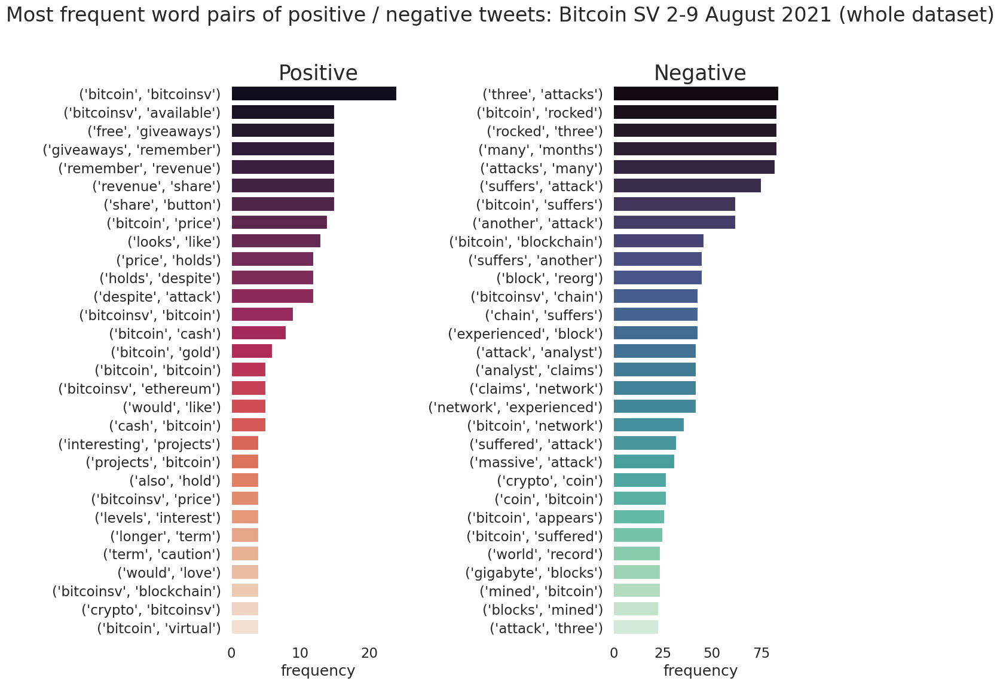

In [ ]:
# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(1, 2,
                     figsize=(12,12)
                     )

# Barplot for positive tweets
sns.barplot(x="frequency",
            y="word",
            data=myDF2Pos,
            palette="rocket",
            ax=ax[0]
            )

ax[0].set_title('Positive',fontsize=25)
ax[0].set_ylabel('')

# Barplot for negative tweets
sns.barplot(x="frequency",
            y="word",
            data=myDF2Neg,
            palette="mako",
            ax=ax[1]
            )

ax[1].set_title('Negative',fontsize=25)
ax[1].set_ylabel('')

# Leave some space between subplots
# Try commenting it out
plt.subplots_adjust(wspace=1.2)

# Add a title
# Use y to increase space
f.suptitle('Most frequent word pairs of positive / negative tweets: %s (whole dataset)' % myName,y=0.99, fontsize=24)


# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig('conditionalBigramFreq_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

#### Most frequent word pairs in the 5 feelings

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataHap = MyData_en[MyData_en['Happy']!=0.0]

# Tokenise each tweet
myTokensHap = [word_tokenize(tweet) for tweet in myDataHap['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensHap_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensHap]

# Generate lists of bigrams
myBigramHap = [list(bigrams(tweet)) for tweet in myTokensHap_noSW_noCase]

# Put all lists together
myBigramListHap = list(itertools.chain.from_iterable(myBigramHap))

# Get the most frequent ones
bigramFreqHap = FreqDist(myBigramListHap)
bigramFreqHap.most_common(50)

[(('bitcoinsv', 'available'), 15),
 (('free', 'giveaways'), 15),
 (('giveaways', 'remember'), 15),
 (('remember', 'revenue'), 15),
 (('revenue', 'share'), 15),
 (('share', 'button'), 15),
 (('bitcoin', 'bitcoinsv'), 11),
 (('bitcoinsv', 'bitcoin'), 7),
 (('looks', 'like'), 5),
 (('interesting', 'projects'), 4),
 (('bitcoinsv', 'price'), 4),
 (('levels', 'interest'), 4),
 (('longer', 'term'), 4),
 (('term', 'caution'), 4),
 (('would', 'love'), 4),
 (('bitcoinsv', 'blockchain'), 4),
 (('craig', 'wright'), 4),
 (('check', 'unityfundhq'), 3),
 (('projects', 'bitcoin'), 3),
 (('infrastructure', 'bill'), 3),
 (('good', 'luck'), 3),
 (('blockchain', 'technology'), 3),
 (('recent', 'attack'), 3),
 (('bitcoin', 'fork'), 3),
 (('moon', 'interesting'), 3),
 (('attack', 'bitcoin'), 3),
 (('bitcoin', 'week'), 3),
 (('week', 'opportunity'), 3),
 (('opportunity', 'highlight'), 3),
 (('highlight', 'importance'), 3),
 (('blockchain', 'security'), 3),
 (('price', 'main'), 3),
 (('main', 'trend'), 3),
 (

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultHap = bigramFreqHap.most_common(50)

# Construct the network
G_Hap = nx.Graph()

# Create connections between nodes
for i in myResultHap:
    G_Hap.add_edge(i[0][0], i[0][1], weight=(i[1]))

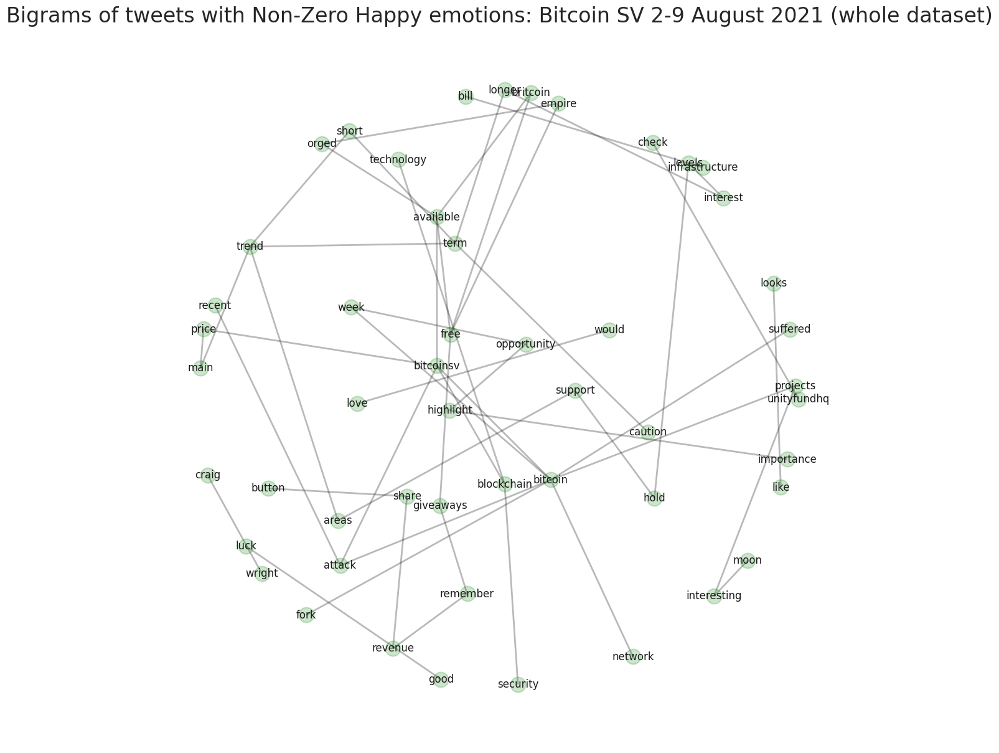

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Hap = nx.spring_layout(G_Hap, k=10, seed=9165, iterations=400)

# store the node label information
labels_Hap = {}
for node in G_Hap.nodes:
    labels_Hap[node] = node

# Plot edges
nx.draw_networkx_edges(G_Hap, Hap, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Hap, Hap, alpha=0.2, label=True, node_color='green')

# Add labels
nx.draw_networkx_labels(G_Hap, Hap, labels_Hap)

# Add title
ax.set_title('Bigrams of tweets with Non-Zero Happy emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Happy_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

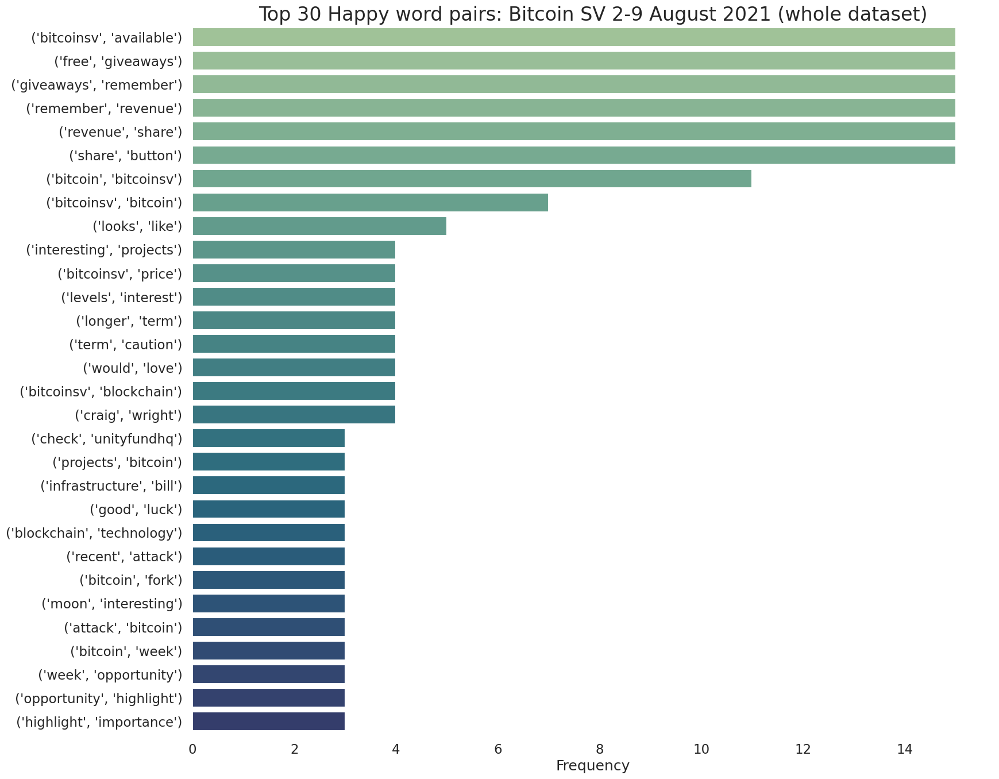

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Hap = pd.DataFrame(bigramFreqHap.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Hap,
            #palette="flare"
            #palette="mako"
            palette="crest"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Happy word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Happy_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Angry

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataAng = MyData_en[MyData_en['Angry']!=0.0]

# Tokenise each tweet
myTokensAng = [word_tokenize(tweet) for tweet in myDataAng['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensAng_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensAng]

# Generate lists of bigrams
myBigramAng = [list(bigrams(tweet)) for tweet in myTokensAng_noSW_noCase]

# Put all lists together
myBigramListAng = list(itertools.chain.from_iterable(myBigramAng))

# Get the most frequent ones
bigramFreqAng = FreqDist(myBigramListAng)
bigramFreqAng.most_common(50)

[(('faced', 'attack'), 21),
 (('crypto', 'coin'), 20),
 (('appears', 'faced'), 20),
 (('coin', 'bitcoin'), 19),
 (('bitcoin', 'appears'), 19),
 (('bitcoin', 'price'), 17),
 (('bitcoin', 'attack'), 17),
 (('three', 'malicious'), 17),
 (('malicious', 'chains'), 16),
 (('attack', 'three'), 14),
 (('chains', 'created'), 14),
 (('bitcoin', 'chain'), 14),
 (('bitcoin', 'cash'), 13),
 (('price', 'holds'), 12),
 (('holds', 'despite'), 12),
 (('despite', 'attack'), 12),
 (('attack', 'bloomberg'), 12),
 (('bitcoin', 'faces'), 10),
 (('coin', 'metrics'), 10),
 (('cash', 'bitcoin'), 9),
 (('chain', 'metrics'), 9),
 (('metrics', 'reveal'), 9),
 (('reveal', 'risk'), 9),
 (('risk', 'facing'), 9),
 (('bitcoin', 'bitcoinsv'), 8),
 (('attempted', 'attack'), 8),
 (('attack', 'yesterday'), 8),
 (('hashing', 'power'), 8),
 (('massive', 'attack'), 8),
 (('power', 'unleashed'), 8),
 (('unleashed', 'today'), 8),
 (('yesterday', 'serious'), 7),
 (('serious', 'hashing'), 7),
 (('today', 'attackers'), 7),
 (('at

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultAng = bigramFreqAng.most_common(50)

# Construct the network
G_Ang = nx.Graph()

# Create connections between nodes
for i in myResultAng:
    G_Ang.add_edge(i[0][0], i[0][1], weight=(i[1]))

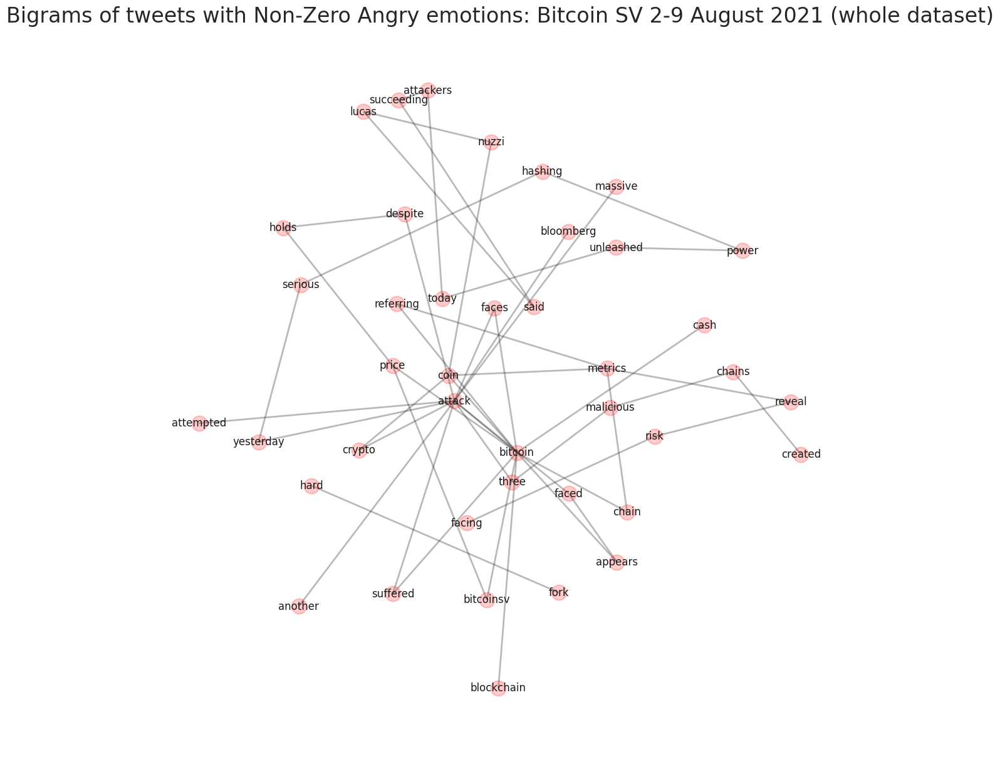

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Ang = nx.spring_layout(G_Ang, k=10, seed=9165, iterations=400)

# store the node label information
labels_Ang = {}
for node in G_Ang.nodes:
    labels_Ang[node] = node

# Plot edges
nx.draw_networkx_edges(G_Ang, Ang, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Ang, Ang, alpha=0.2, label=True, node_color='red')

# Add labels
nx.draw_networkx_labels(G_Ang, Ang, labels_Ang)

# Add title
ax.set_title('Bigrams of tweets with Non-Zero Angry emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Angry_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

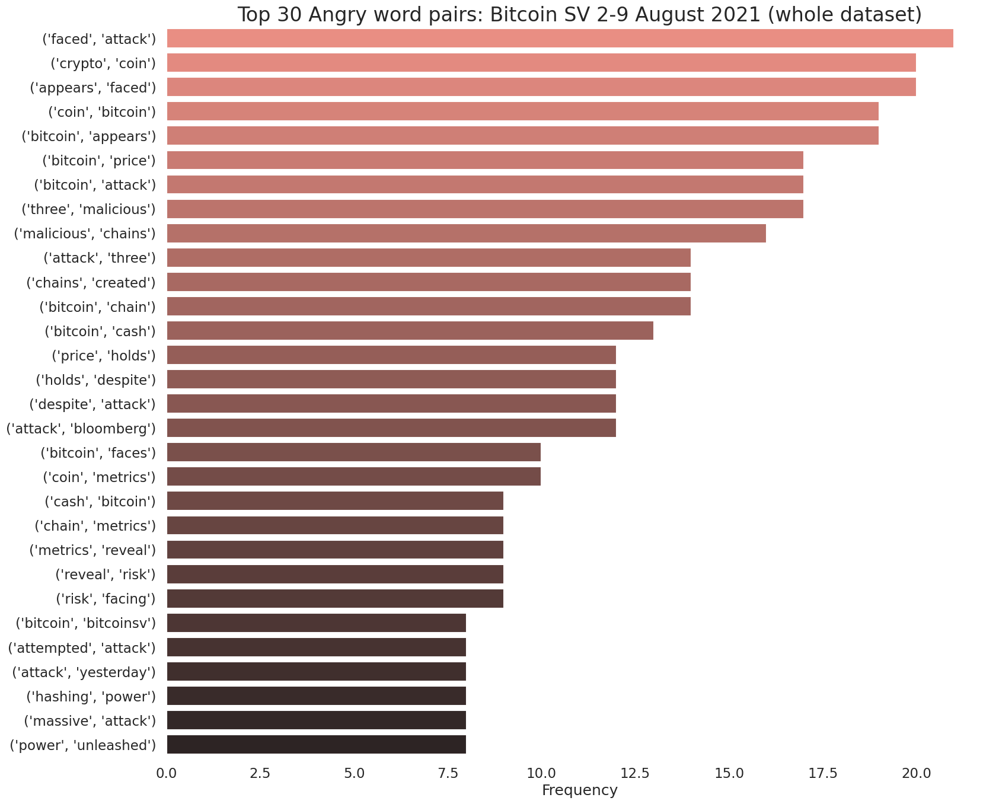

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Ang = pd.DataFrame(bigramFreqAng.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Ang,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            palette="dark:salmon_r"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Angry word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Angry_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Surprise

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataSur = MyData_en[MyData_en['Surprise']!=0.00]

# Tokenise each tweet
myTokensSur = [word_tokenize(tweet) for tweet in myDataSur['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensSur_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensSur]

# Generate lists of bigrams
myBigramSur = [list(bigrams(tweet)) for tweet in myTokensSur_noSW_noCase]

# Put all lists together
myBigramListSur = list(itertools.chain.from_iterable(myBigramSur))

# Get the most frequent ones
bigramFreqSur = FreqDist(myBigramListSur)
bigramFreqSur.most_common(50)

[(('suffers', 'attack'), 44),
 (('bitcoinsv', 'chain'), 42),
 (('chain', 'suffers'), 42),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('experienced', 'block'), 42),
 (('block', 'reorg'), 42),
 (('bitcoin', 'network'), 17),
 (('bitcoin', 'chain'), 13),
 (('bitcoin', 'cash'), 12),
 (('network', 'suffered'), 12),
 (('suffered', 'large'), 12),
 (('large', 'scale'), 11),
 (('scale', 'anonymous'), 11),
 (('anonymous', 'attack'), 11),
 (('bitcoin', 'bitcoinsv'), 10),
 (('cash', 'bitcoin'), 10),
 (('chain', 'metrics'), 9),
 (('metrics', 'reveal'), 9),
 (('reveal', 'risk'), 9),
 (('risk', 'facing'), 9),
 (('breaking', 'reportedly'), 9),
 (('reportedly', 'suffers'), 9),
 (('massive', 'attack'), 9),
 (('craig', 'wright'), 8),
 (('coin', 'metrics'), 8),
 (('suffers', 'massive'), 8),
 (('looks', 'like'), 6),
 (('bitcoin', 'news'), 6),
 (('reorg', 'bitcoin'), 5),
 (('bitcoin', 'bitcoin'), 5),
 (('attack', 'bitcoinsv')

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultSur = bigramFreqSur.most_common(50)

# Construct the network
G_Sur = nx.Graph()

# Create connections between nodes
for i in myResultSur:
    G_Sur.add_edge(i[0][0], i[0][1], weight=(i[1]))

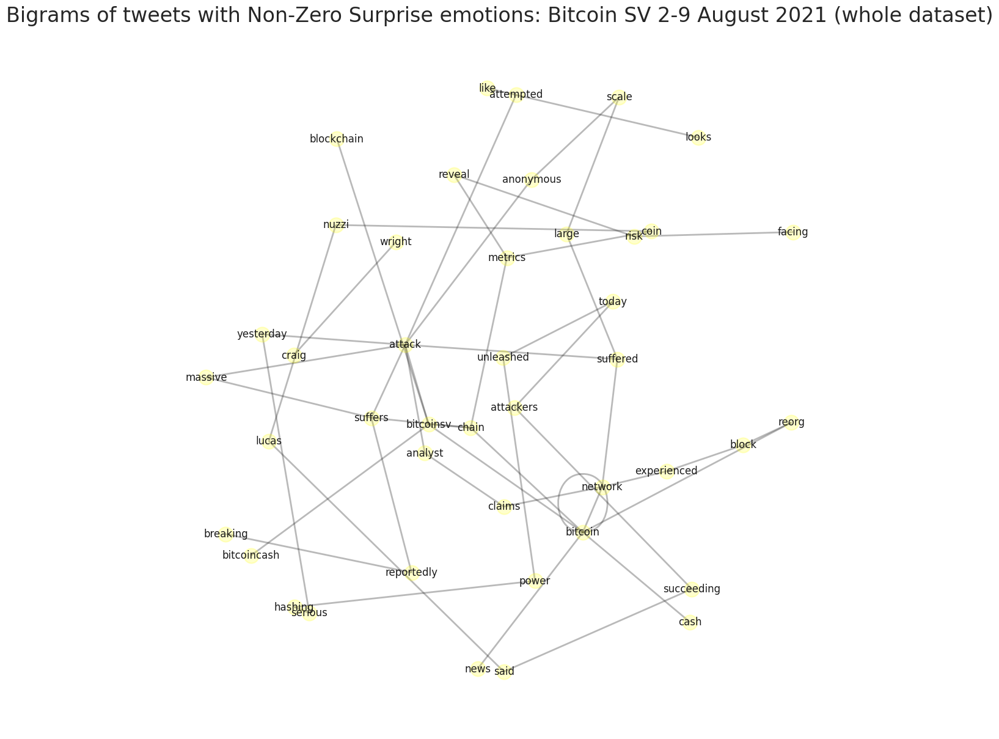

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Sur = nx.spring_layout(G_Sur, k=10, seed=9165, iterations=400)

# store the node label information
labels_Sur = {}
for node in G_Sur.nodes:
    labels_Sur[node] = node

# Plot edges
nx.draw_networkx_edges(G_Sur, Sur, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Sur, Sur, alpha=0.2, label=True, node_color='yellow')

# Add labels
nx.draw_networkx_labels(G_Sur, Sur, labels_Sur)

# Add title
ax.set_title('Bigrams of tweets with Non-Zero Surprise emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Surprise_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

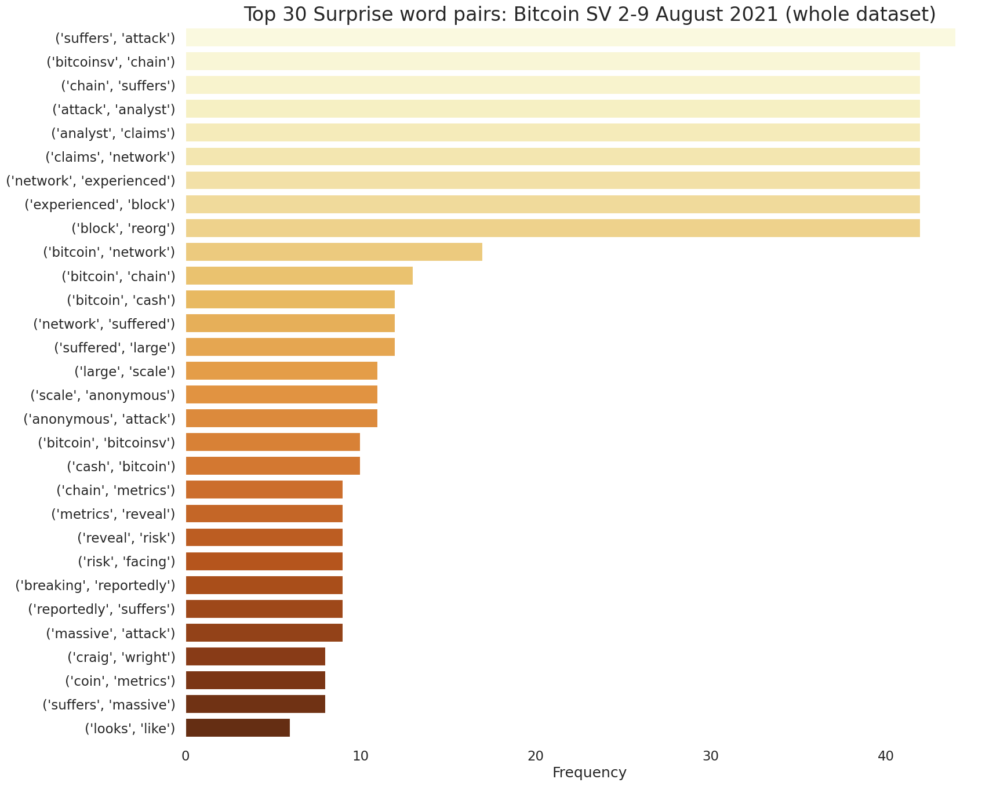

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Sur = pd.DataFrame(bigramFreqSur.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Sur,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            palette="YlOrBr"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Surprise word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Surprise_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Sad

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataSad = MyData_en[MyData_en['Sad']!=0.00]

# Tokenise each tweet
myTokensSad = [word_tokenize(tweet) for tweet in myDataSad['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensSad_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensSad]

# Generate lists of bigrams
myBigramSad = [list(bigrams(tweet)) for tweet in myTokensSad_noSW_noCase]

# Put all lists together
myBigramListSad = list(itertools.chain.from_iterable(myBigramSad))

# Get the most frequent ones
bigramFreqSad = FreqDist(myBigramListSad)
bigramFreqSad.most_common(50)

[(('crypto', 'coin'), 27),
 (('coin', 'bitcoin'), 27),
 (('bitcoin', 'appears'), 26),
 (('faced', 'attack'), 21),
 (('appears', 'faced'), 20),
 (('cryptocurrency', 'bitcoin'), 18),
 (('bitcoin', 'blockchain'), 17),
 (('attack', 'bloomberg'), 14),
 (('blockchain', 'attack'), 14),
 (('attack', 'appears'), 14),
 (('bitcoin', 'bitcoinsv'), 13),
 (('appears', 'inflicted'), 13),
 (('inflicted', 'least'), 13),
 (('least', 'damage'), 13),
 (('damage', 'network'), 13),
 (('suffered', 'attack'), 12),
 (('bitcoin', 'bitcoin'), 8),
 (('real', 'bitcoin'), 8),
 (('massive', 'attack'), 7),
 (('craig', 'wright'), 7),
 (('bitcoin', 'suffers'), 7),
 (('appears', 'suffered'), 7),
 (('suffered', 'massive'), 6),
 (('mined', 'simultaneously'), 6),
 (('bitcoin', 'attack'), 6),
 (('crypto', 'exchanges'), 6),
 (('exchanges', 'increasingly'), 6),
 (('increasingly', 'becoming'), 6),
 (('becoming', 'wary'), 6),
 (('wary', 'bitcoin'), 6),
 (('bitcoin', 'following'), 6),
 (('following', 'string'), 6),
 (('string', 

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultSad = bigramFreqSad.most_common(50)

# Construct the network
G_Sad = nx.Graph()

# Create connections between nodes
for i in myResultSad:
    G_Sad.add_edge(i[0][0], i[0][1], weight=(i[1]))

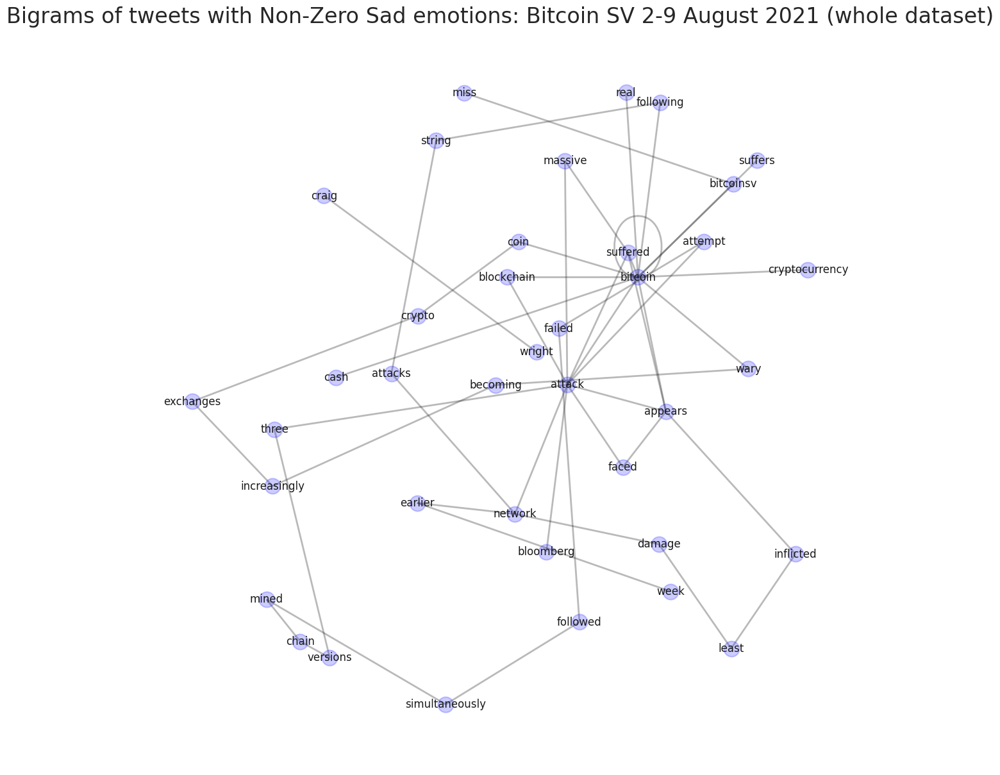

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Sad = nx.spring_layout(G_Sad, k=10, seed=9165, iterations=400)

# store the node label information
labels_Sad = {}
for node in G_Sad.nodes:
    labels_Sad[node] = node

# Plot edges
nx.draw_networkx_edges(G_Sad, Sad, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Sad, Sad, alpha=0.2, label=True, node_color='blue')

# Add labels
nx.draw_networkx_labels(G_Sad, Sad, labels_Sad)

# Add title
ax.set_title('Bigrams of tweets with Non-Zero Sad emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Sad_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

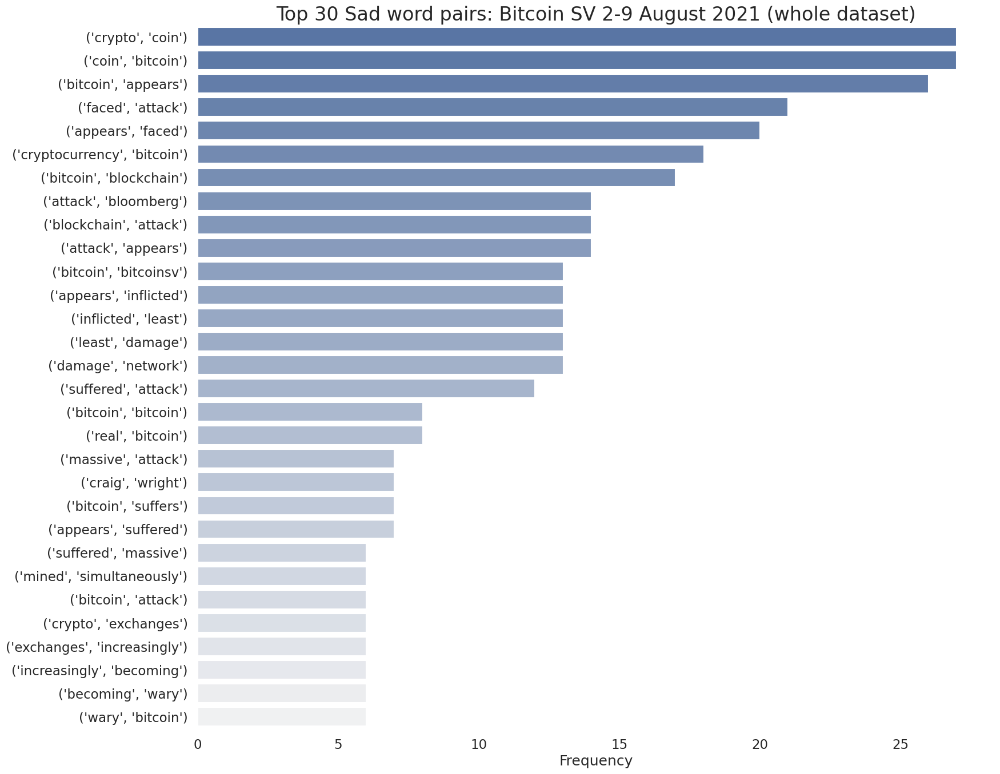

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Sad = pd.DataFrame(bigramFreqSad.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Sad,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            palette="light:b_r"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Sad word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Sad_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Fear

In [ ]:
# Get the bigrams for Fear emotion sentiment

# Subset the data
myDataFea = MyData_en[MyData_en['Fear']!=0.00]

# Tokenise each tweet
myTokensFea = [word_tokenize(tweet) for tweet in myDataFea['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensFea_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensFea]

# Generate lists of bigrams
myBigramFea = [list(bigrams(tweet)) for tweet in myTokensFea_noSW_noCase]

# Put all lists together
myBigramListFea = list(itertools.chain.from_iterable(myBigramFea))

# Get the most frequent ones
bigramFreqFea = FreqDist(myBigramListFea)
bigramFreqFea.most_common(50)

[(('suffers', 'attack'), 49),
 (('block', 'reorg'), 45),
 (('experienced', 'block'), 43),
 (('bitcoinsv', 'chain'), 42),
 (('chain', 'suffers'), 42),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('bitcoin', 'network'), 37),
 (('another', 'attack'), 30),
 (('bitcoin', 'bitcoinsv'), 29),
 (('bitcoin', 'blockchain'), 23),
 (('suffers', 'another'), 19),
 (('cryptocurrency', 'bitcoin'), 18),
 (('suffered', 'attack'), 18),
 (('attack', 'bitcoin'), 16),
 (('massive', 'attack'), 16),
 (('network', 'suffers'), 15),
 (('another', 'major'), 15),
 (('major', 'attack'), 15),
 (('network', 'suffered'), 15),
 (('attack', 'tuesday'), 14),
 (('blockchain', 'attack'), 14),
 (('bitcoin', 'trading'), 13),
 (('versions', 'chain'), 13),
 (('bitcoin', 'suffered'), 13),
 (('craig', 'wright'), 13),
 (('exchanges', 'delist'), 13),
 (('attack', 'appears'), 13),
 (('appears', 'inflicted'), 13),
 (('inflicted', 'least'), 13),
 (('lea

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultFea = bigramFreqFea.most_common(50)

# Construct the network
G_Fea = nx.Graph()

# Create connections between nodes
for i in myResultFea:
    G_Fea.add_edge(i[0][0], i[0][1], weight=(i[1]))

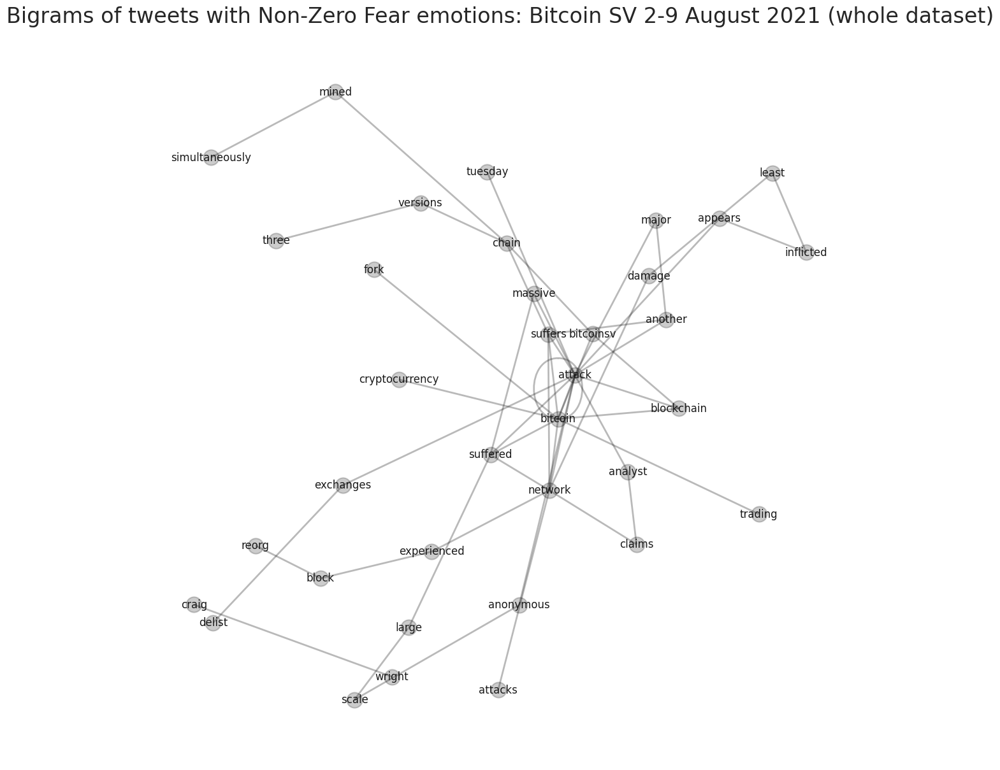

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Fea = nx.spring_layout(G_Fea, k=10, seed=9165, iterations=400)

# store the node label information
labels_Fea = {}
for node in G_Fea.nodes:
    labels_Fea[node] = node

# Plot edges
nx.draw_networkx_edges(G_Fea, Fea, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Fea, Fea, alpha=0.2, label=True, node_color='black')

# Add labels
nx.draw_networkx_labels(G_Fea, Fea, labels_Fea)

# Add title
ax.set_title('Bigrams of tweets with Non-Zero Fear emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Fear_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

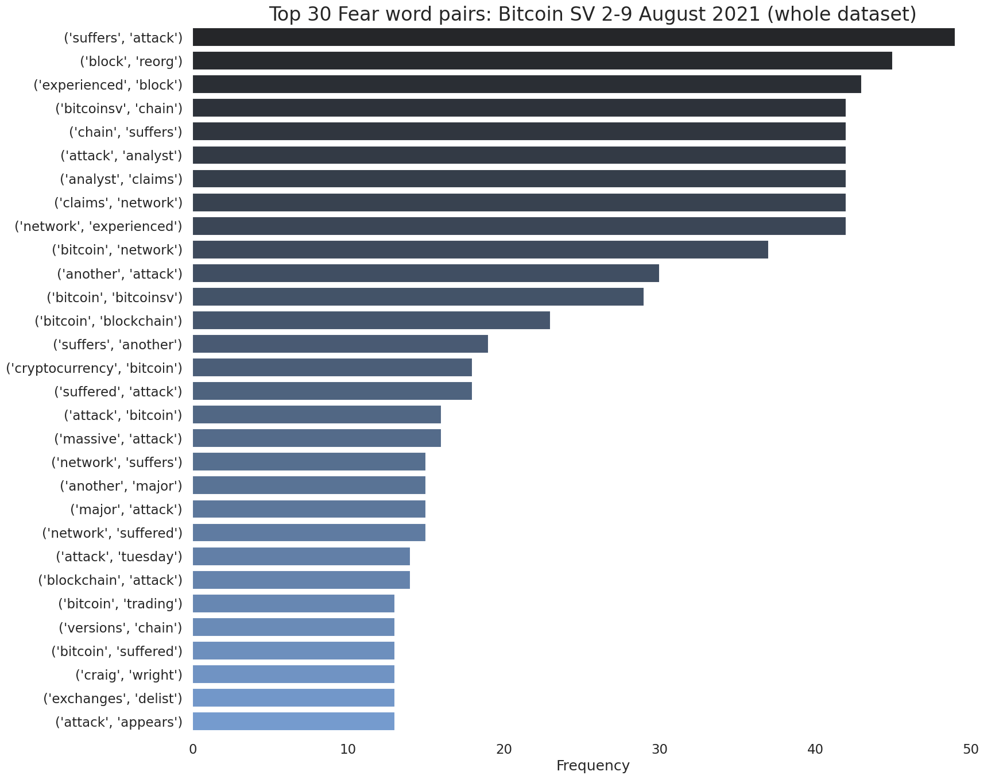

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Fea = pd.DataFrame(bigramFreqFea.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Fea,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            #palette="light:b_r"
            #palette="dark:salmon"
            palette="dark:#69d"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Fear word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Fear_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Neutral emotions

In [ ]:
# Get the bigrams for Fear emotion sentiment

# Subset the data
myDataNeut = MyData_en[(MyData_en['Happy']==0.0) & (MyData_en['Angry']==0.0) & (MyData_en['Surprise']==0.00) & (MyData_en['Sad']==0.0) & (MyData_en['Fear']==0.00)]

# Tokenise each tweet
myTokensNeut = [word_tokenize(tweet) for tweet in myDataNeut['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensNeut_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensNeut]

# Generate lists of bigrams
myBigramNeut = [list(bigrams(tweet)) for tweet in myTokensNeut_noSW_noCase]

# Put all lists together
myBigramListNeut = list(itertools.chain.from_iterable(myBigramNeut))

# Get the most frequent ones
bigramFreqNeut = FreqDist(myBigramListNeut)
bigramFreqNeut.most_common(50)

[(('three', 'attacks'), 78),
 (('bitcoin', 'rocked'), 76),
 (('rocked', 'three'), 76),
 (('attacks', 'many'), 76),
 (('many', 'months'), 76),
 (('bitcoin', 'suffers'), 45),
 (('another', 'attack'), 31),
 (('suffers', 'another'), 26),
 (('bitcoin', 'blockchain'), 22),
 (('suffers', 'attack'), 22),
 (('world', 'record'), 20),
 (('record', 'gigabyte'), 20),
 (('gigabyte', 'blocks'), 20),
 (('blocks', 'mined'), 20),
 (('mined', 'bitcoin'), 20),
 (('bitcoin', 'cash'), 14),
 (('bitcoin', 'bitcoin'), 13),
 (('months', 'cointelegraph'), 8),
 (('bitcoin', 'suffered'), 8),
 (('bitcoin', 'bitcoinsv'), 7),
 (('blockchain', 'prnewswire'), 6),
 (('cash', 'bitcoin'), 6),
 (('attack', 'hackers'), 6),
 (('hackers', 'reorganise'), 6),
 (('reorganise', 'blocks'), 6),
 (('attack', 'report'), 6),
 (('coinbase', 'says'), 6),
 (('says', 'attack'), 6),
 (('attack', 'occurred'), 6),
 (('occurred', 'bitcoin'), 6),
 (('bitcoin', 'stopping'), 6),
 (('stopping', 'trading'), 6),
 (('months', 'bitcoinsv'), 5),
 (('b

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultNeut = bigramFreqNeut.most_common(50)

# Construct the network
G_Neut = nx.Graph()

# Create connections between nodes
for i in myResultNeut:
    G_Neut.add_edge(i[0][0], i[0][1], weight=(i[1]))

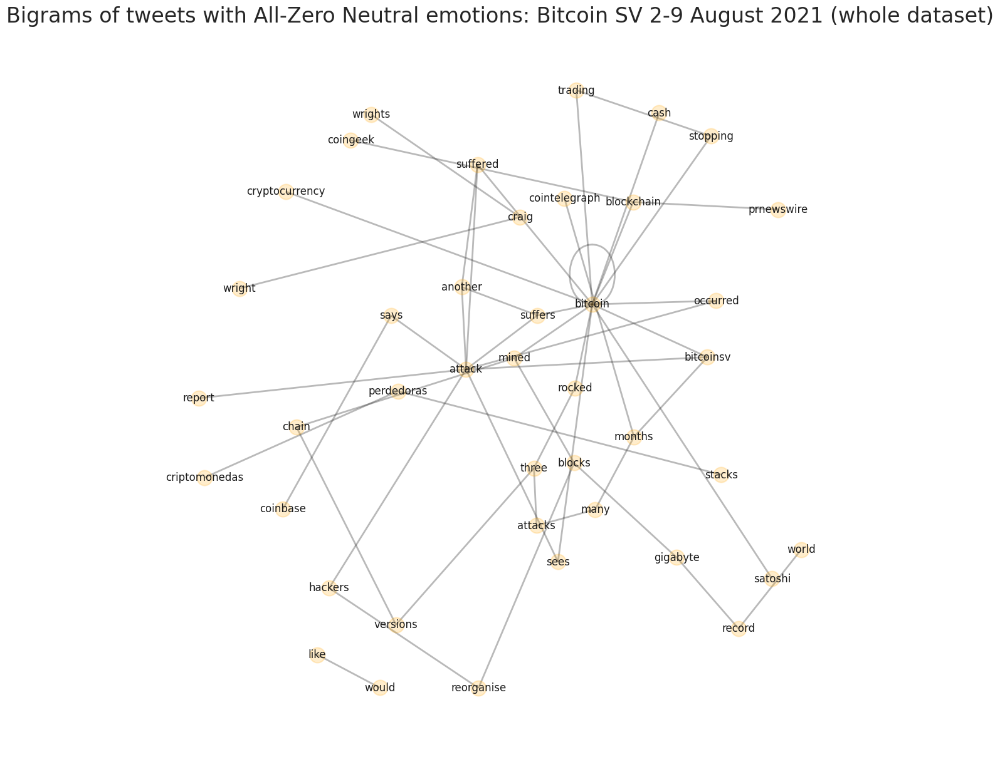

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Neut = nx.spring_layout(G_Neut, k=10, seed=9165, iterations=400)

# store the node label information
labels_Neut = {}
for node in G_Neut.nodes:
    labels_Neut[node] = node

# Plot edges
nx.draw_networkx_edges(G_Neut, Neut, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Neut, Neut, alpha=0.2, label=True, node_color='orange')

# Add labels
nx.draw_networkx_labels(G_Neut, Neut, labels_Neut)

# Add title
ax.set_title('Bigrams of tweets with All-Zero Neutral emotions: %s (whole dataset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('bigram_Neutral_whole_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

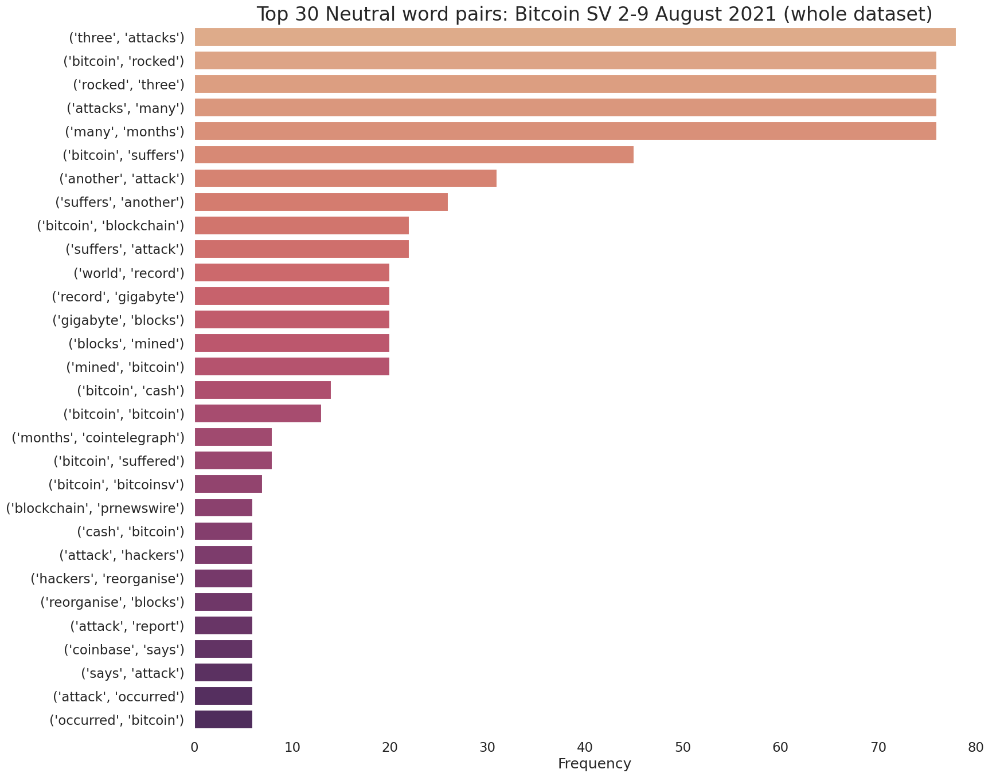

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Neut = pd.DataFrame(bigramFreqNeut.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Neut,
            palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            #palette="light:b_r"
            #palette="dark:salmon"
            #palette="dark:#69d"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Neutral word pairs: %s (whole dataset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("top30_Neutral_whole_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

## ***Subset: "51" OR "attack" OR "double"***

### **Creating** subset

In [ ]:
# Create a new dataframe with tweets containing 51 or attack
#define values
values = ['51', 'attack', 'Attack', 'double', 'Double']

#keep rows that contain any value in the list
MyData_en_sub = MyData_en[MyData_en.content.str.contains('|'.join(values))]

In [ ]:
MyData_en_sub.describe()

,id,replyCount,retweetCount,likeCount,quoteCount,conversationId,retweetedTweet,sentiment_score,Happy,Angry,Surprise,Sad,Fear
count,5.240000e+02,524.000000,524.000000,524.000000,524.000000,5.240000e+02,0.0,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000
mean,1.423215e+18,1.898855,1.854962,7.694656,0.435115,1.423154e+18,NaN,-0.558400,0.028111,0.130019,0.095515,0.105725,0.317958
std,5.280015e+14,11.055539,8.651195,43.249137,3.165539,9.937078e+14,NaN,0.333706,0.119664,0.296843,0.207508,0.234912,0.379437
min,1.422172e+18,0.000000,0.000000,0.000000,0.000000,1.406697e+18,NaN,-0.951800,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.422842e+18,0.000000,0.000000,0.000000,0.000000,1.422841e+18,NaN,-0.744900,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.422963e+18,0.000000,0.000000,0.000000,0.000000,1.422963e+18,NaN,-0.637500,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.423488e+18,0.000000,0.000000,1.000000,0.000000,1.423451e+18,NaN,-0.440400,0.000000,0.000000,0.000000,0.000000,0.500000
max,1.424795e+18,158.000000,131.000000,658.000000,50.000000,1.424795e+18,NaN,0.848100,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# drop rows which have same clean_content
# and user and keep last (first appearance in time) entry
MyData_en_sub = MyData_en_sub.drop_duplicates(
  subset = ['clean_content', 'user'],
  keep = 'last').reset_index(drop = True)

MyData_en_sub.describe()

,id,replyCount,retweetCount,likeCount,quoteCount,conversationId,retweetedTweet,sentiment_score,Happy,Angry,Surprise,Sad,Fear
count,5.240000e+02,524.000000,524.000000,524.000000,524.000000,5.240000e+02,0.0,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000
mean,1.423215e+18,1.898855,1.854962,7.694656,0.435115,1.423154e+18,NaN,-0.558400,0.028111,0.130019,0.095515,0.105725,0.317958
std,5.280015e+14,11.055539,8.651195,43.249137,3.165539,9.937078e+14,NaN,0.333706,0.119664,0.296843,0.207508,0.234912,0.379437
min,1.422172e+18,0.000000,0.000000,0.000000,0.000000,1.406697e+18,NaN,-0.951800,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.422842e+18,0.000000,0.000000,0.000000,0.000000,1.422841e+18,NaN,-0.744900,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.422963e+18,0.000000,0.000000,0.000000,0.000000,1.422963e+18,NaN,-0.637500,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.423488e+18,0.000000,0.000000,1.000000,0.000000,1.423451e+18,NaN,-0.440400,0.000000,0.000000,0.000000,0.000000,0.500000
max,1.424795e+18,158.000000,131.000000,658.000000,50.000000,1.424795e+18,NaN,0.848100,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
MyData_en_sub.to_csv('Dataset_sub_'+myUrl+'.csv')

### Get the **statistics** for the subset

In [ ]:
MyData_en_sub[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']].describe()

,Happy,Angry,Surprise,Sad,Fear
count,524.000000,524.000000,524.000000,524.000000,524.000000
mean,0.028111,0.130019,0.095515,0.105725,0.317958
std,0.119664,0.296843,0.207508,0.234912,0.379437
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.500000
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
MyData_en_sub[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']].value_counts()

Happy  Angry  Surprise  Sad   Fear
0.00   0.00   0.00      0.00  0.00    169
                              1.00     85
              0.50      0.00  0.50     62
       1.00   0.00      0.00  0.00     44
       0.00   0.00      0.50  0.50     33
       0.50   0.00      0.50  0.00     19
       0.00   0.00      1.00  0.00     17
       0.50   0.00      0.00  0.50      8
       0.00   1.00      0.00  0.00      7
              0.33      0.00  0.67      6
              0.00      0.33  0.67      6
       0.50   0.50      0.00  0.00      6
0.50   0.00   0.00      0.00  0.50      5
0.00   0.25   0.00      0.00  0.75      4
0.50   0.00   0.00      0.50  0.00      4
1.00   0.00   0.00      0.00  0.00      3
0.33   0.00   0.33      0.00  0.33      2
0.00   0.67   0.00      0.00  0.33      2
0.25   0.25   0.25      0.00  0.25      2
0.00   0.33   0.33      0.33  0.00      2
0.17   0.00   0.00      0.00  0.83      2
0.00   0.00   0.33      0.33  0.33      2
       0.33   0.00      0.00  0.67      2

In [ ]:
#melt data frame into long format
df_melted_sub = pd.melt(MyData_en_sub[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']])

#view first 10 rows of melted data frame
#df_melted_sub.head(10)

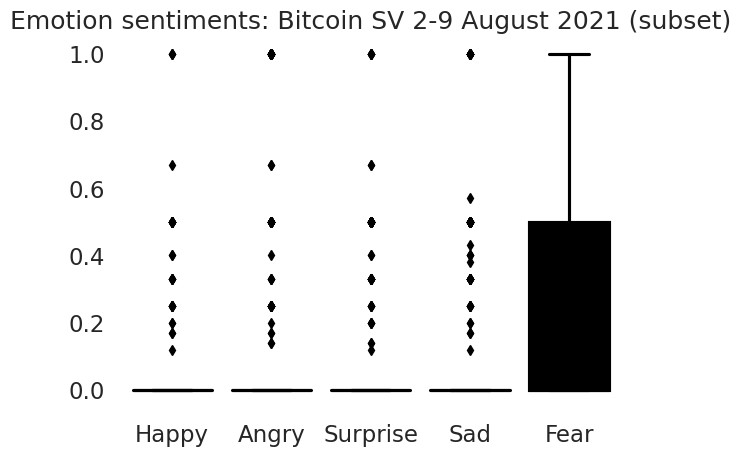

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#create seaborn boxplots by group
sns.boxplot(x='variable', y='value', data=df_melted_sub, palette=["green", "red", "gold", "blue", "black"]).set(title='Emotion sentiments: %s (subset)' % myName)

#modify axis labels
plt.xlabel('')
plt.ylabel('')

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("emotion_sentiments_sub_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

In [ ]:
MyData_en_sub[['sentiment_cat']].value_counts()

sentiment_cat
negative         487
positive          36
neutral            1
dtype: int64

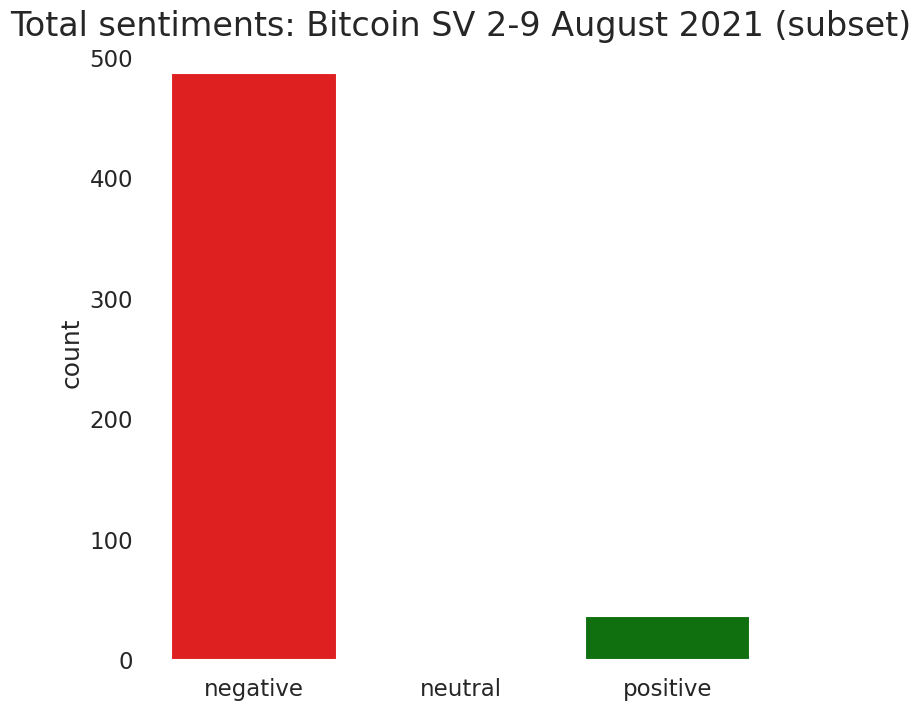

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8,8),
                     sharey=True
                     )

sns.countplot(x="sentiment_cat",
            data=MyData_en_sub,
            order=['negative', 'neutral', 'positive'], # specify the ordering
            palette=["red", "orange", "green"]
            #palette="flare",
            )

ax.set_title('Total sentiments: %s (subset)' % myName,size=24)
ax.set_xlabel('')

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("sentiments_subset_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

### **Timeline** of 51 attack tweets per day

In [ ]:
neg_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='negative']
neg_sub = neg_sub.groupby(['only_date'],as_index=False).count()

pos_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='positive']
pos_sub = pos_sub.groupby(['only_date'],as_index=False).count()

neu_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='neutral']
neu_sub = neu_sub.groupby(['only_date'],as_index=False).count()

pos_sub = pos_sub[['only_date','id']]
neg_sub = neg_sub[['only_date','id']]
neu_sub = neu_sub[['only_date','id']]

In [ ]:
import plotly.graph_objs as go
import matplotlib.pyplot as plt

fig = go.Figure()
for col in pos_sub.columns:
    fig.add_trace(go.Scatter(x=pos_sub['only_date'], y=pos_sub['id'],
                             name = "positive 51 attack tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='green'
                             )
                 )

for col in neg_sub.columns:
    fig.add_trace(go.Scatter(x=neg_sub['only_date'], y=neg_sub['id'],
                             name = "negative 51 attack tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='red'
                             )
                 )

for col in neu_sub.columns:
    fig.add_trace(go.Scatter(x=neu_sub['only_date'], y=neu_sub['id'],
                             name = "neutral 51 attack tweets",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='orange'
                             )
                 )

fig.update_layout(
    title_font_family="Arial",
    title_font_color="black",
    #title_font_size=30,
    title="Timeline of sentiments in the %s tweets (subset)" % myName
)

fig.write_html("Timeline_sentiments_subset_"+myUrl+".html")

fig.show()


In [ ]:
hap_sub = MyData_en_sub[MyData_en_sub['Happy']!=0.0]
hap_sub = hap_sub.groupby(['only_date'],as_index=False).count()

ang_sub = MyData_en_sub[MyData_en_sub['Angry']!=0.0]
ang_sub = ang_sub.groupby(['only_date'],as_index=False).count()

sur_sub = MyData_en_sub[MyData_en_sub['Surprise']!=0.00]
sur_sub = sur_sub.groupby(['only_date'],as_index=False).count()

sad_sub = MyData_en_sub[MyData_en_sub['Sad']!=0.0]
sad_sub = sad_sub.groupby(['only_date'],as_index=False).count()

fea_sub = MyData_en_sub[MyData_en_sub['Fear']!=0.00]
fea_sub = fea_sub.groupby(['only_date'],as_index=False).count()

neut_sub = MyData_en_sub[(MyData_en_sub['Happy']==0.0) & (MyData_en_sub['Angry']==0.0) & \
                         (MyData_en_sub['Surprise']==0.00) & (MyData_en_sub['Sad']==0.0) & \
                         (MyData_en_sub['Fear']==0.00)]
neut_sub = neut_sub.groupby(['only_date'],as_index=False).count()

hap_sub = hap_sub[['only_date','id']]
ang_sub = ang_sub[['only_date','id']]
sur_sub = sur_sub[['only_date','id']]
sad_sub = sad_sub[['only_date','id']]
fea_sub = fea_sub[['only_date','id']]
neut_sub = neut_sub[['only_date','id']]

In [ ]:
import plotly.graph_objs as go

fig = go.Figure()
for col in hap_sub.columns:
    fig.add_trace(go.Scatter(x=hap_sub['only_date'], y=hap_sub['id'],
                             name = "51 attack tweets with non-zero Happy scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='green'
                             )
                 )

for col in ang_sub.columns:
    fig.add_trace(go.Scatter(x=ang_sub['only_date'], y=ang_sub['id'],
                             name = "51 attack tweets with non-zero Angry scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='red'
                             )
                 )

for col in sur_sub.columns:
    fig.add_trace(go.Scatter(x=sur_sub['only_date'], y=sur_sub['id'],
                             name = "51 attack tweets with non-zero Surprise scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='yellow'
                             )
                 )

for col in sad_sub.columns:
    fig.add_trace(go.Scatter(x=sad_sub['only_date'], y=sad_sub['id'],
                             name = "51 attack tweets with non-zero Sad scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='blue'
                             )
                 )

for col in fea_sub.columns:
    fig.add_trace(go.Scatter(x=fea_sub['only_date'], y=fea_sub['id'],
                             name = "51 attack tweets with non-zero Fear scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='black'
                             )
                 )

for col in neut_sub.columns:
    fig.add_trace(go.Scatter(x=neut_sub['only_date'], y=neut_sub['id'],
                             name = "51 attack neutral tweets with all zero scores",
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True,
                             line_color='orange'
                             )
                 )
fig.update_layout(
    title_font_family="Arial",
    title_font_color="black",
    #title_font_size=30,
    title="Timeline of emotions in the %s tweets (subset)" % myName
)

fig.write_html("Timeline_emotions_subset_"+myUrl+".html")

fig.show()


### **Timeline** of 51 attack tweets per day (updated figure)

---



In [ ]:
import pandas as pd
MyData_en_sub = pd.read_csv('Dataset_sub_bitcoingold_22_01_2020.csv')
MyData_en_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594 entries, 0 to 593
Data columns (total 38 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          594 non-null    int64  
 1   url                 594 non-null    object 
 2   date                594 non-null    object 
 3   content             594 non-null    object 
 4   renderedContent     594 non-null    object 
 5   id                  594 non-null    int64  
 6   user                594 non-null    object 
 7   outlinks            594 non-null    object 
 8   tcooutlinks         594 non-null    object 
 9   replyCount          594 non-null    int64  
 10  retweetCount        594 non-null    int64  
 11  likeCount           594 non-null    int64  
 12  quoteCount          594 non-null    int64  
 13  conversationId      594 non-null    int64  
 14  lang                594 non-null    object 
 15  source              594 non-null    object 
 16  sourceUr

In [ ]:
neg_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='negative']
neg_sub = neg_sub.groupby(['only_date'],as_index=False).count()

pos_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='positive']
pos_sub = pos_sub.groupby(['only_date'],as_index=False).count()

neu_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='neutral']
neu_sub = neu_sub.groupby(['only_date'],as_index=False).count()

pos_sub = pos_sub[['only_date','id']]
neg_sub = neg_sub[['only_date','id']]
neu_sub = neu_sub[['only_date','id']]

In [ ]:
import plotly.graph_objs as go
import matplotlib.pyplot as plt

fig = go.Figure()

fig.add_trace(go.Scatter(x=pos_sub['only_date'], y=pos_sub['id'],
                         name = "positive 51 attack tweets",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='green'
                         )
             )

fig.add_trace(go.Scatter(x=neg_sub['only_date'], y=neg_sub['id'],
                         name = "negative 51 attack tweets",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='red'
                         )
             )

fig.add_trace(go.Scatter(x=neu_sub['only_date'], y=neu_sub['id'],
                         name = "neutral 51 attack tweets",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='orange'
                         )
             )

fig.update_layout(
    plot_bgcolor='white',
    font_family = 'STIX',
    title_font_family='STIX',
    title_font_color="black",
    xaxis_title="Date",
    yaxis_title="Number of Tweets"
    #title_font_size=30,
    #title="Timeline of sentiments in the %s tweets (subset)" % myName
)

#Update the axis and labels with latex format
fig.update_xaxes(title_text="Date", title_font=dict(size=18, family='STIX'))
fig.update_yaxes(title_text="Number of Tweets", title_font=dict(size=18, family='STIX'))


fig.write_html("Timeline_sentiments_subset_BTGjan2020.html")

fig.show()

In [ ]:
hap_sub = MyData_en_sub[MyData_en_sub['Happy']!=0.0]
hap_sub = hap_sub.groupby(['only_date'],as_index=False).count()

ang_sub = MyData_en_sub[MyData_en_sub['Angry']!=0.0]
ang_sub = ang_sub.groupby(['only_date'],as_index=False).count()

sur_sub = MyData_en_sub[MyData_en_sub['Surprise']!=0.00]
sur_sub = sur_sub.groupby(['only_date'],as_index=False).count()

sad_sub = MyData_en_sub[MyData_en_sub['Sad']!=0.0]
sad_sub = sad_sub.groupby(['only_date'],as_index=False).count()

fea_sub = MyData_en_sub[MyData_en_sub['Fear']!=0.00]
fea_sub = fea_sub.groupby(['only_date'],as_index=False).count()

neut_sub = MyData_en_sub[(MyData_en_sub['Happy']==0.0) & (MyData_en_sub['Angry']==0.0) & \
                         (MyData_en_sub['Surprise']==0.00) & (MyData_en_sub['Sad']==0.0) & \
                         (MyData_en_sub['Fear']==0.00)]
neut_sub = neut_sub.groupby(['only_date'],as_index=False).count()

hap_sub = hap_sub[['only_date','id']]
ang_sub = ang_sub[['only_date','id']]
sur_sub = sur_sub[['only_date','id']]
sad_sub = sad_sub[['only_date','id']]
fea_sub = fea_sub[['only_date','id']]
neut_sub = neut_sub[['only_date','id']]

In [ ]:
import plotly.graph_objs as go

fig = go.Figure()

fig.add_trace(go.Scatter(x=hap_sub['only_date'], y=hap_sub['id'],
                         name = "51 attack tweets with non-zero Happy scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='green'
                         )
              )

fig.add_trace(go.Scatter(x=ang_sub['only_date'], y=ang_sub['id'],
                         name = "51 attack tweets with non-zero Angry scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='red'
                         )
                 )


fig.add_trace(go.Scatter(x=sur_sub['only_date'], y=sur_sub['id'],
                         name = "51 attack tweets with non-zero Surprise scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='yellow'
                         )
                 )

fig.add_trace(go.Scatter(x=sad_sub['only_date'], y=sad_sub['id'],
                         name = "51 attack tweets with non-zero Sad scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='blue'
                         )
                 )


fig.add_trace(go.Scatter(x=fea_sub['only_date'], y=fea_sub['id'],
                         name = "51 attack tweets with non-zero Fear scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='black'
                         )
                 )


fig.add_trace(go.Scatter(x=neut_sub['only_date'], y=neut_sub['id'],
                         name = "51 attack neutral tweets with all zero scores",
                         mode = 'markers+lines',
                         line=dict(shape='linear'),
                         connectgaps=True,
                         line_color='orange'
                         )
                 )
fig.update_layout(
    plot_bgcolor='white',
    title_font_family="Arial",
    title_font_color="black",
    xaxis_title="Date",
    yaxis_title="Number of Tweets"
    #title_font_size=30,
    #title="Timeline of emotions in the %s tweets (subset)" % myName
)

fig.write_html("Timeline_emotions_subset_BTGjan2020.html")

fig.show()


### **Most frequent** word pairs and their bigrams for the 51 attack subset

#### Positive / Negative (subset)

In [ ]:
# Get a bunch of tools from nltk

import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import word_tokenize

# Import bigrams
from nltk import bigrams

import itertools

# Get English stopwords
en_stopwords = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataPos_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='positive']

# Tokenise each tweet
myTokensPos_sub = [word_tokenize(tweet) for tweet in myDataPos_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensPos_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensPos_sub]

# Generate lists of bigrams
myBigramPos_sub = [list(bigrams(tweet)) for tweet in myTokensPos_sub_noSW_noCase]

# Put all lists together
myBigramListPos_sub = list(itertools.chain.from_iterable(myBigramPos_sub))

# Get the most frequent ones
bigramFreqPos_sub = FreqDist(myBigramListPos_sub)
bigramFreqPos_sub.most_common(50)

[(('bitcoin', 'price'), 12),
 (('price', 'holds'), 12),
 (('holds', 'despite'), 12),
 (('despite', 'attack'), 12),
 (('attack', 'crypto'), 3),
 (('attack', 'bitcoin'), 3),
 (('bitcoin', 'week'), 3),
 (('week', 'opportunity'), 3),
 (('opportunity', 'highlight'), 3),
 (('highlight', 'importance'), 3),
 (('blockchain', 'security'), 3),
 (('honest', 'nodes'), 3),
 (('bitcoin', 'fork'), 2),
 (('fork', 'undergoes'), 2),
 (('undergoes', 'attack'), 2),
 (('attack', 'settlement'), 2),
 (('settlement', 'assurances'), 2),
 (('assurances', 'matter'), 2),
 (('matter', 'attack'), 2),
 (('importance', 'decentralized'), 2),
 (('decentralized', 'blockchain'), 2),
 (('crypto', 'briefing'), 2),
 (('like', 'bitcoin'), 2),
 (('shares', 'bitcoin'), 2),
 (('bitcoin', 'attack'), 2),
 (('read', 'latest'), 1),
 (('latest', 'security'), 1),
 (('security', 'news'), 1),
 (('news', 'summary'), 1),
 (('summary', 'august'), 1),
 (('august', 'apple'), 1),
 (('apple', 'iphone'), 1),
 (('iphone', 'childabuseimages'), 1)

In [ ]:
# Get the bigrams for negative sentiment

# Subset the data
myDataNeg_sub = MyData_en_sub[MyData_en_sub['sentiment_cat']=='negative']

# Tokenise each tweet
myTokensNeg_sub = [word_tokenize(tweet) for tweet in myDataNeg_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensNeg_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>1) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensNeg_sub]

# Generate lists of bigrams
myBigramNeg_sub = [list(bigrams(tweet)) for tweet in myTokensNeg_sub_noSW_noCase]

# Put all lists together
myBigramListNeg_sub = list(itertools.chain.from_iterable(myBigramNeg_sub))

# Get the most frequent ones
bigramFreqNeg_sub = FreqDist(myBigramListNeg_sub)
bigramFreqNeg_sub.most_common(50)


[(('three', 'attacks'), 84),
 (('bitcoin', 'rocked'), 83),
 (('rocked', 'three'), 83),
 (('many', 'months'), 83),
 (('attacks', 'many'), 82),
 (('suffers', 'attack'), 75),
 (('bitcoin', 'suffers'), 62),
 (('another', 'attack'), 62),
 (('suffers', 'another'), 45),
 (('block', 'reorg'), 45),
 (('bitcoinsv', 'chain'), 43),
 (('chain', 'suffers'), 43),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('experienced', 'block'), 42),
 (('bitcoin', 'network'), 33),
 (('suffered', 'attack'), 32),
 (('massive', 'attack'), 31),
 (('crypto', 'coin'), 27),
 (('coin', 'bitcoin'), 27),
 (('bitcoin', 'appears'), 26),
 (('bitcoin', 'suffered'), 25),
 (('attack', 'three'), 23),
 (('bitcoin', 'blockchain'), 23),
 (('bitcoin', 'attack'), 22),
 (('faced', 'attack'), 21),
 (('appears', 'faced'), 20),
 (('attack', 'bitcoin'), 19),
 (('versions', 'chain'), 18),
 (('cryptocurrency', 'bitcoin'), 18),
 (('bitcoin', 'trading'), 17),
 ((

In [ ]:
# Prepare the bigram networks

# We need some libraries
import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout
import matplotlib.pyplot as plt

# Collect the result
myResultPos_sub = bigramFreqPos_sub.most_common(50)
myResultNeg_sub = bigramFreqNeg_sub.most_common(50)

# Construct the network for positives
G_pos_sub = nx.Graph()

# Create connections between nodes
for i in myResultPos_sub:
    G_pos_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

# Construct the network for negatives
G_neg_sub = nx.Graph()

# Create connections between nodes
for i in myResultNeg_sub:
    G_neg_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

<ipython-input-83-60643fae7ba6>:9: DeprecationWarning:

nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723

<ipython-input-83-60643fae7ba6>:37: DeprecationWarning:

nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723



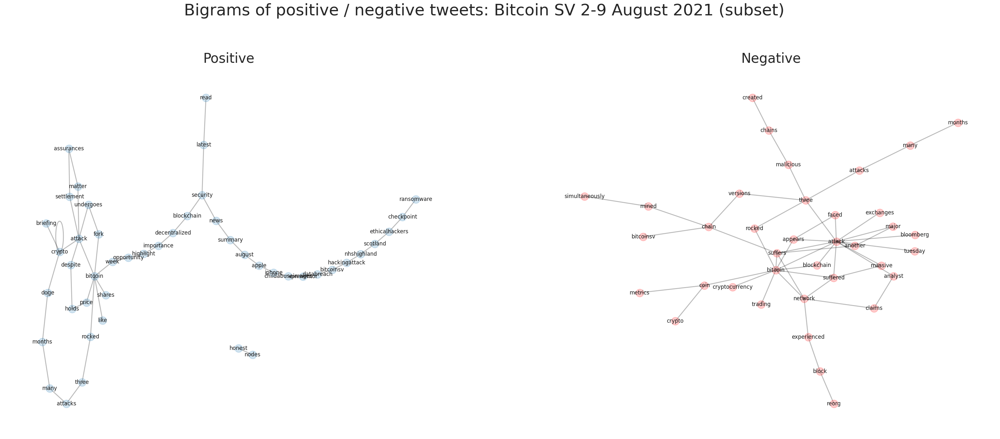

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(1, 2, figsize=(40, 15))

# Subplot1 for positives

# use another layout
pos_sub = graphviz_layout(G_pos_sub, prog="neato")
#pos_pos = nx.spring_layout(G_pos, k=7, seed=9165, iterations=400)

# store the node label information
labelsPos_sub = {}
for node in G_pos_sub.nodes:
    labelsPos_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_pos_sub, pos_sub, width=2, alpha=0.3, ax=ax[0])
#nx.draw_networkx_edges(G, pos_pos, width=2, alpha=0.3 )


# Plot nodes
nx.draw_networkx_nodes(G_pos_sub, pos_sub, alpha=0.2, label=True, ax=ax[0])

# Add labels
nx.draw_networkx_labels(G_pos_sub, pos_sub, labelsPos_sub, ax=ax[0])

# Turn off the axis
ax[0].axis("off")
# Add title
ax[0].set_title('Positive',fontsize=30)


# Subplot2 for negatives

# use another layout
neg_sub = graphviz_layout(G_neg_sub, prog="neato")
#pos_neg = nx.spring_layout(G_neg, k=7, seed=9165, iterations=400)
#pos_neg = nx.fruchterman_reingold_layout(G_neg, k=5, seed=9165, iterations=400)

# store the node label information
labelsNeg_sub = {}
for node in G_neg_sub.nodes:
    labelsNeg_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_neg_sub, neg_sub, width=2, alpha=0.3, ax=ax[1])

# Plot nodes
nx.draw_networkx_nodes(G_neg_sub, neg_sub, alpha=0.2,  label=True, ax=ax[1], node_color='red')

# Add labels
nx.draw_networkx_labels(G_neg_sub, neg_sub, labelsNeg_sub, ax=ax[1])

# Turn off the axis
ax[1].axis("off")
# Add title
ax[1].set_title('Negative',fontsize=30)

# Add a title
# Use y to increase space
f.suptitle('Bigrams of positive / negative tweets: %s (subset)' % myName,y=1.01, fontsize=36)


# Save the figure
plt.savefig('subset_conditionalBigram_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Pos_sub = pd.DataFrame(bigramFreqPos_sub.most_common(30), columns=['word', 'frequency'])

# Convert the result to a dataframe for visualisation
myDF2Neg_sub = pd.DataFrame(bigramFreqNeg_sub.most_common(30), columns=['word', 'frequency'])

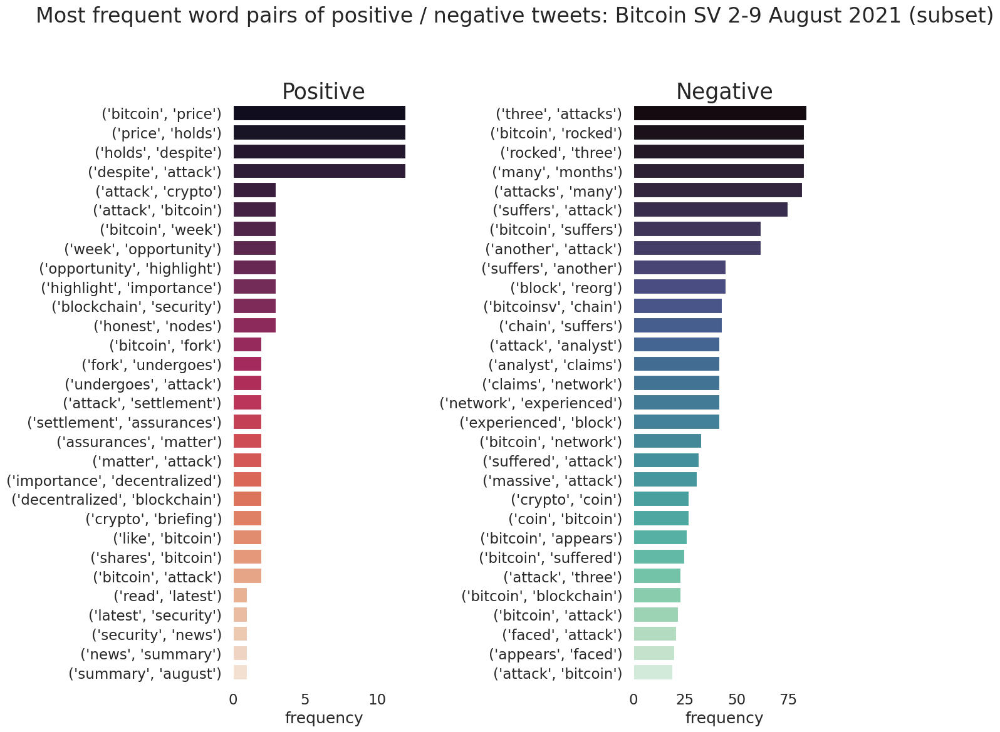

In [ ]:
# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(1, 2,
                     figsize=(12,12)
                     )

# Barplot for positive tweets
sns.barplot(x="frequency",
            y="word",
            data=myDF2Pos_sub,
            palette="rocket",
            ax=ax[0]
            )

ax[0].set_title('Positive',fontsize=25)
ax[0].set_ylabel('')

# Barplot for negative tweets
sns.barplot(x="frequency",
            y="word",
            data=myDF2Neg_sub,
            palette="mako",
            ax=ax[1]
            )

ax[1].set_title('Negative',fontsize=25)
ax[1].set_ylabel('')

# Leave some space between subplots
# Try commenting it out
plt.subplots_adjust(wspace=1.2)

# Add a title
# Use y to increase space
f.suptitle('Most frequent word pairs of positive / negative tweets: %s (subset)' % myName,y=1.01, fontsize=24)


# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig('subset_conditionalFreq_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

#### Most frequent word pairs in the 5 feelings in the subset

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataHap_sub = MyData_en_sub[MyData_en_sub['Happy']!=0.0]

# Tokenise each tweet
myTokensHap_sub = [word_tokenize(tweet) for tweet in myDataHap_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensHap_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensHap_sub]

# Generate lists of bigrams
myBigramHap_sub = [list(bigrams(tweet)) for tweet in myTokensHap_sub_noSW_noCase]

# Put all lists together
myBigramListHap_sub = list(itertools.chain.from_iterable(myBigramHap_sub))

# Get the most frequent ones
bigramFreqHap_sub = FreqDist(myBigramListHap_sub)
bigramFreqHap_sub.most_common(50)

[(('recent', 'attack'), 3),
 (('bitcoin', 'fork'), 3),
 (('attack', 'bitcoin'), 3),
 (('bitcoin', 'week'), 3),
 (('week', 'opportunity'), 3),
 (('opportunity', 'highlight'), 3),
 (('highlight', 'importance'), 3),
 (('blockchain', 'security'), 3),
 (('attack', 'bitcoinsv'), 3),
 (('craig', 'wright'), 3),
 (('bitcoin', 'suffered'), 3),
 (('bitcoin', 'rocked'), 2),
 (('rocked', 'three'), 2),
 (('many', 'months'), 2),
 (('attack', 'cost'), 2),
 (('third', 'time'), 2),
 (('time', 'three'), 2),
 (('three', 'months'), 2),
 (('months', 'suffered'), 2),
 (('suffered', 'blockchain'), 2),
 (('blockchain', 'reorganization'), 2),
 (('reorganization', 'reorg'), 2),
 (('bitcoin', 'bitcoinsv'), 2),
 (('fork', 'undergoes'), 2),
 (('undergoes', 'attack'), 2),
 (('attack', 'settlement'), 2),
 (('settlement', 'assurances'), 2),
 (('assurances', 'matter'), 2),
 (('matter', 'attack'), 2),
 (('importance', 'decentralized'), 2),
 (('decentralized', 'blockchain'), 2),
 (('bitcoinsv', 'bitcoin'), 2),
 (('bitcoi

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultHap_sub = bigramFreqHap_sub.most_common(50)

# Construct the network
G_Hap_sub = nx.Graph()

# Create connections between nodes
for i in myResultHap_sub:
    G_Hap_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

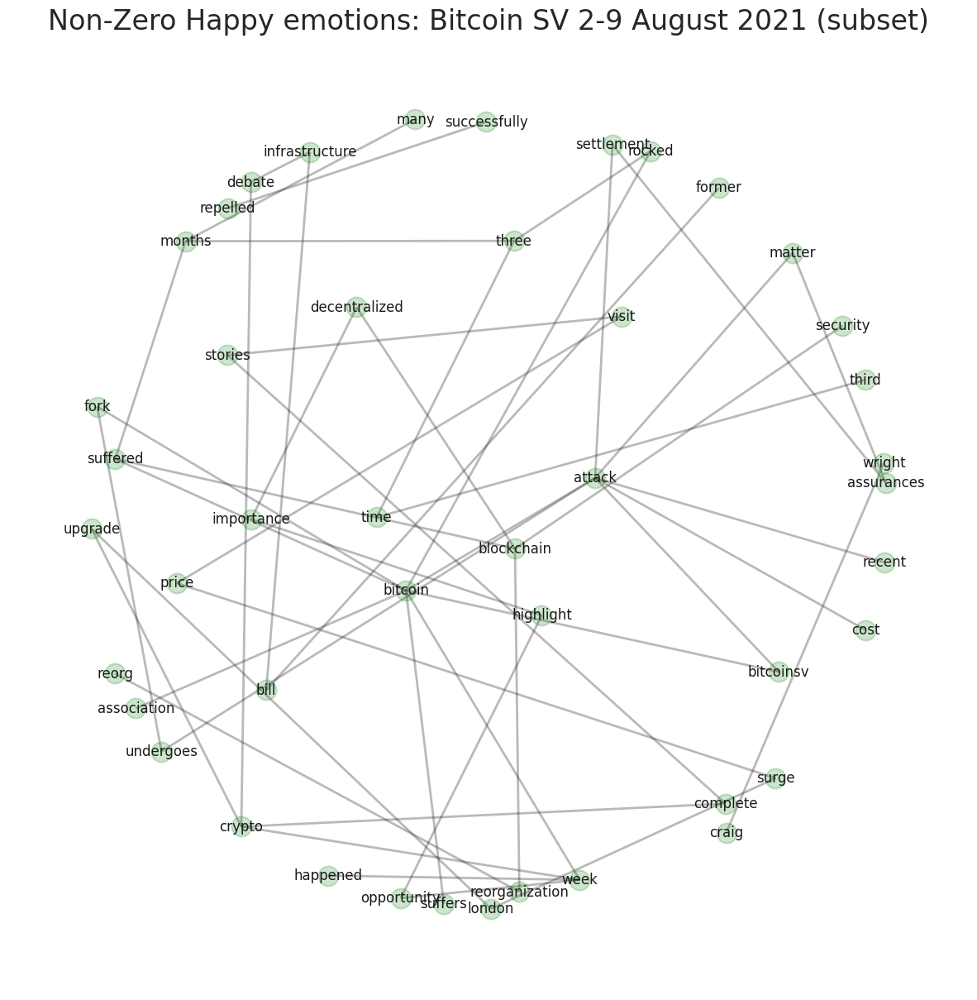

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Hap_sub = nx.spring_layout(G_Hap_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Hap_sub = {}
for node in G_Hap_sub.nodes:
    labels_Hap_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Hap_sub, Hap_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Hap_sub, Hap_sub, alpha=0.2, label=True, node_color='green')

# Add labels
nx.draw_networkx_labels(G_Hap_sub, Hap_sub, labels_Hap_sub)

# Turn off the axis
ax.axis("off")
# Add title
ax.set_title('Non-Zero Happy emotions: %s (subset)' % myName,fontsize=24)

# Save the figure
plt.savefig('subset_bigram_Happy_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

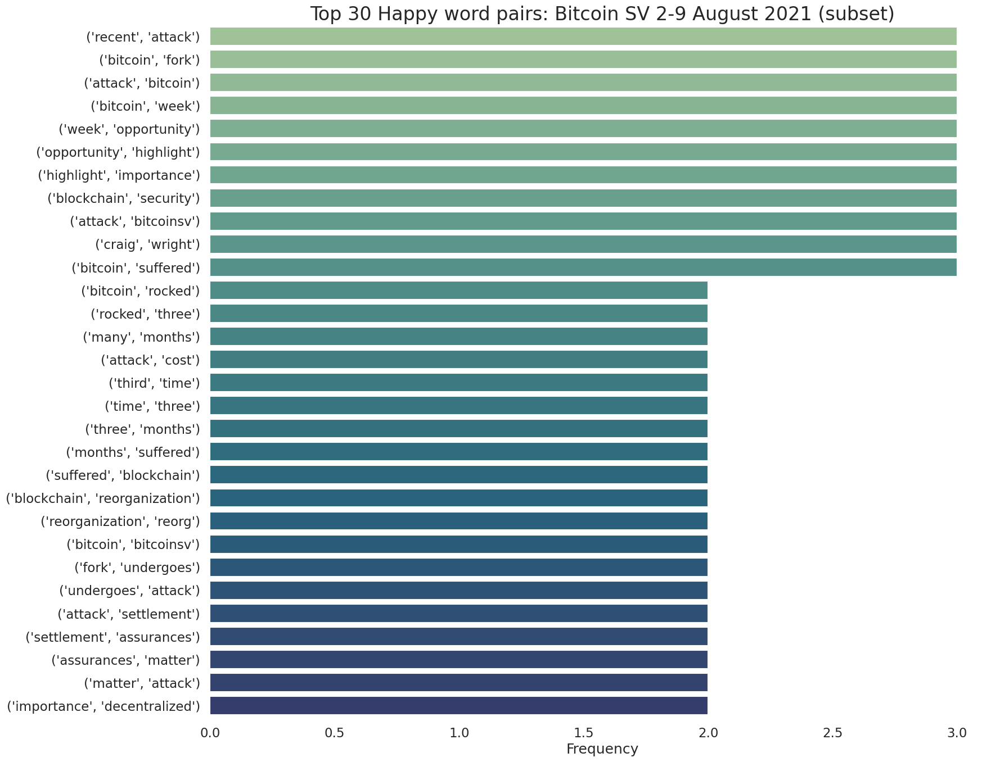

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Hap_sub = pd.DataFrame(bigramFreqHap_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Hap_sub,
            #palette="flare"
            #palette="mako"
            palette="crest"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Happy word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Happy_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Angry

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataAng_sub = MyData_en_sub[MyData_en_sub['Angry']!=0.0]

# Tokenise each tweet
myTokensAng_sub = [word_tokenize(tweet) for tweet in myDataAng_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensAng_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensAng_sub]

# Generate lists of bigrams
myBigramAng_sub = [list(bigrams(tweet)) for tweet in myTokensAng_sub_noSW_noCase]

# Put all lists together
myBigramListAng_sub = list(itertools.chain.from_iterable(myBigramAng_sub))

# Get the most frequent ones
bigramFreqAng_sub = FreqDist(myBigramListAng_sub)
bigramFreqAng_sub.most_common(50)

[(('faced', 'attack'), 21),
 (('crypto', 'coin'), 20),
 (('appears', 'faced'), 20),
 (('coin', 'bitcoin'), 19),
 (('bitcoin', 'appears'), 19),
 (('bitcoin', 'attack'), 17),
 (('three', 'malicious'), 17),
 (('malicious', 'chains'), 16),
 (('attack', 'three'), 14),
 (('chains', 'created'), 14),
 (('bitcoin', 'price'), 12),
 (('price', 'holds'), 12),
 (('holds', 'despite'), 12),
 (('despite', 'attack'), 12),
 (('attack', 'bloomberg'), 12),
 (('bitcoin', 'faces'), 10),
 (('coin', 'metrics'), 10),
 (('attempted', 'attack'), 8),
 (('attack', 'yesterday'), 8),
 (('massive', 'attack'), 8),
 (('power', 'unleashed'), 8),
 (('unleashed', 'today'), 8),
 (('yesterday', 'serious'), 7),
 (('serious', 'hashing'), 7),
 (('hashing', 'power'), 7),
 (('today', 'attackers'), 7),
 (('attackers', 'succeeding'), 7),
 (('bitcoin', 'suffered'), 6),
 (('suffered', 'attack'), 6),
 (('attack', 'crypto'), 6),
 (('another', 'attack'), 6),
 (('succeeding', 'said'), 6),
 (('said', 'lucas'), 6),
 (('lucas', 'nuzzi'), 6

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultAng_sub = bigramFreqAng_sub.most_common(50)

# Construct the network
G_Ang_sub = nx.Graph()

# Create connections between nodes
for i in myResultAng_sub:
    G_Ang_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

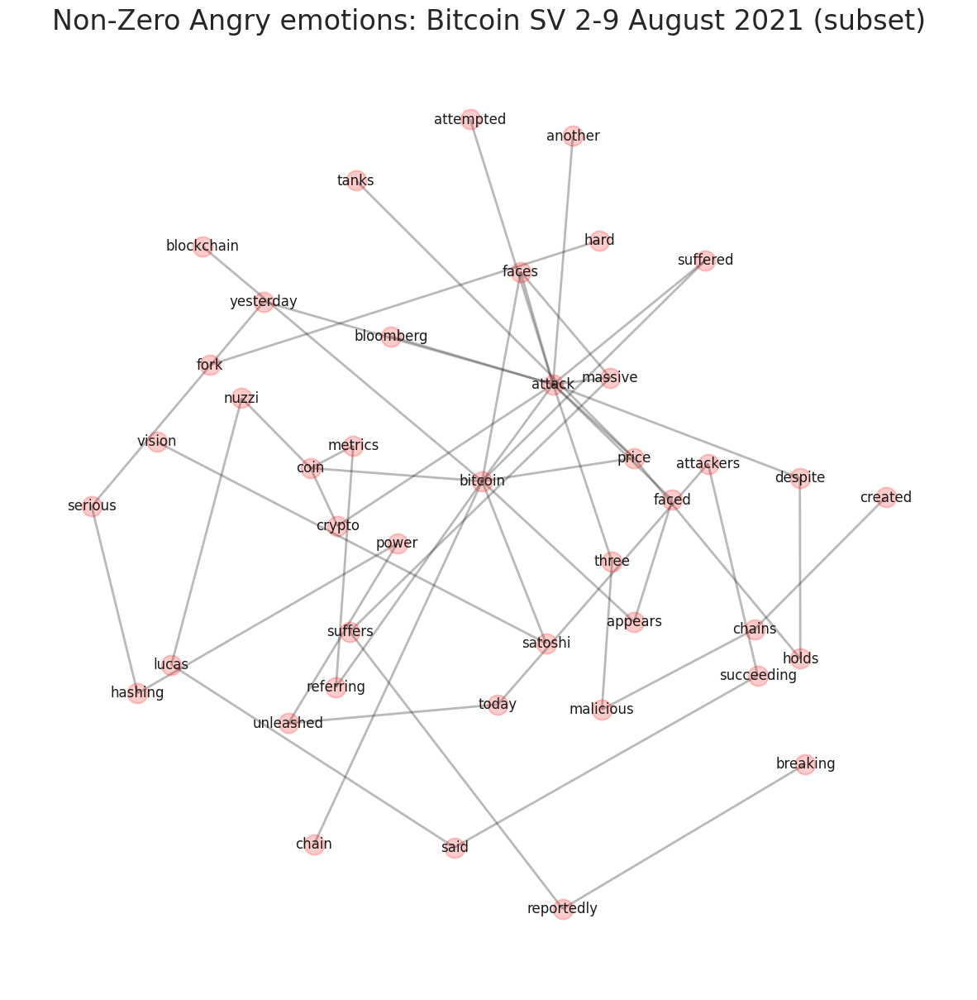

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Ang_sub = nx.spring_layout(G_Ang_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Ang_sub = {}
for node in G_Ang_sub.nodes:
    labels_Ang_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Ang_sub, Ang_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Ang_sub, Ang_sub, alpha=0.2, label=True, node_color='red')

# Add labels
nx.draw_networkx_labels(G_Ang_sub, Ang_sub, labels_Ang_sub)

# Add title
ax.set_title('Non-Zero Angry emotions: %s (subset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('subset_bigram_Angry_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

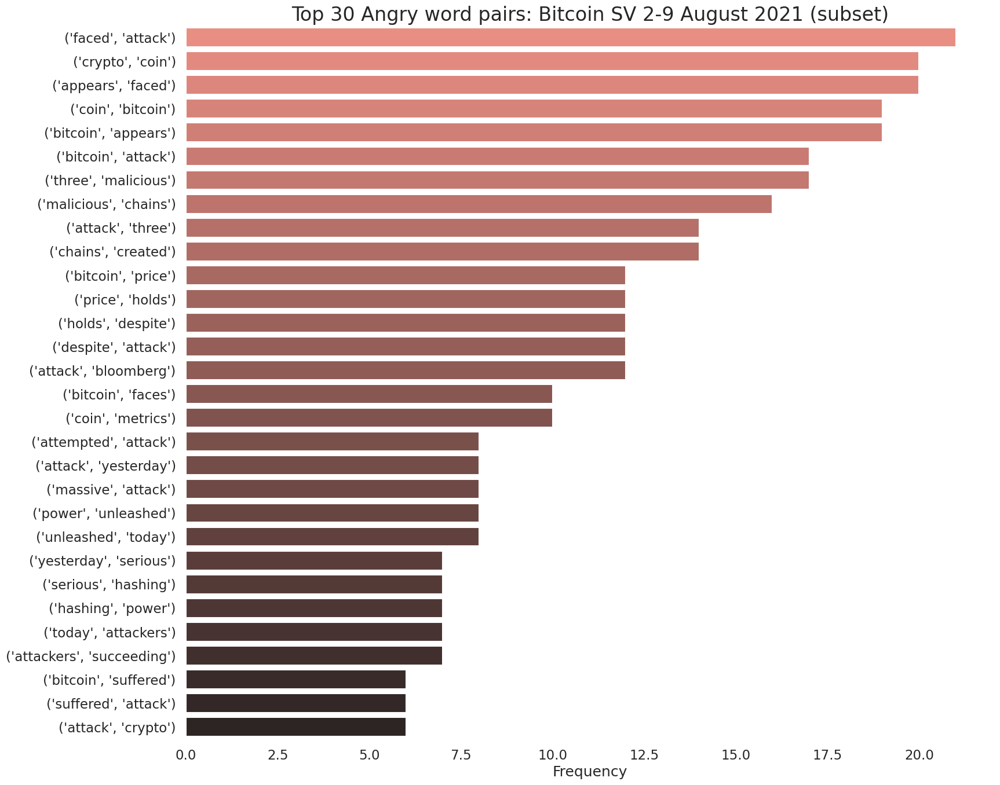

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Ang_sub = pd.DataFrame(bigramFreqAng_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Ang_sub,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            palette="dark:salmon_r"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Angry word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Angry_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Surprise

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataSur_sub = MyData_en_sub[MyData_en_sub['Surprise']!=0.00]

# Tokenise each tweet
myTokensSur_sub = [word_tokenize(tweet) for tweet in myDataSur_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensSur_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensSur_sub]

# Generate lists of bigrams
myBigramSur_sub = [list(bigrams(tweet)) for tweet in myTokensSur_sub_noSW_noCase]

# Put all lists together
myBigramListSur_sub = list(itertools.chain.from_iterable(myBigramSur_sub))

# Get the most frequent ones
bigramFreqSur_sub = FreqDist(myBigramListSur_sub)
bigramFreqSur_sub.most_common(50)

[(('suffers', 'attack'), 44),
 (('bitcoinsv', 'chain'), 42),
 (('chain', 'suffers'), 42),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('experienced', 'block'), 42),
 (('block', 'reorg'), 42),
 (('bitcoin', 'network'), 14),
 (('network', 'suffered'), 12),
 (('suffered', 'large'), 12),
 (('large', 'scale'), 11),
 (('scale', 'anonymous'), 11),
 (('anonymous', 'attack'), 11),
 (('breaking', 'reportedly'), 9),
 (('reportedly', 'suffers'), 9),
 (('massive', 'attack'), 9),
 (('coin', 'metrics'), 8),
 (('suffers', 'massive'), 8),
 (('bitcoin', 'news'), 6),
 (('reorg', 'bitcoin'), 5),
 (('attack', 'bitcoinsv'), 5),
 (('craig', 'wright'), 5),
 (('suffered', 'attack'), 5),
 (('attempted', 'attack'), 5),
 (('attack', 'yesterday'), 5),
 (('yesterday', 'serious'), 5),
 (('serious', 'hashing'), 5),
 (('hashing', 'power'), 5),
 (('power', 'unleashed'), 5),
 (('unleashed', 'today'), 5),
 (('today', 'attackers'), 5),
 (('

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultSur_sub = bigramFreqSur_sub.most_common(50)

# Construct the network
G_Sur_sub = nx.Graph()

# Create connections between nodes
for i in myResultSur_sub:
    G_Sur_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

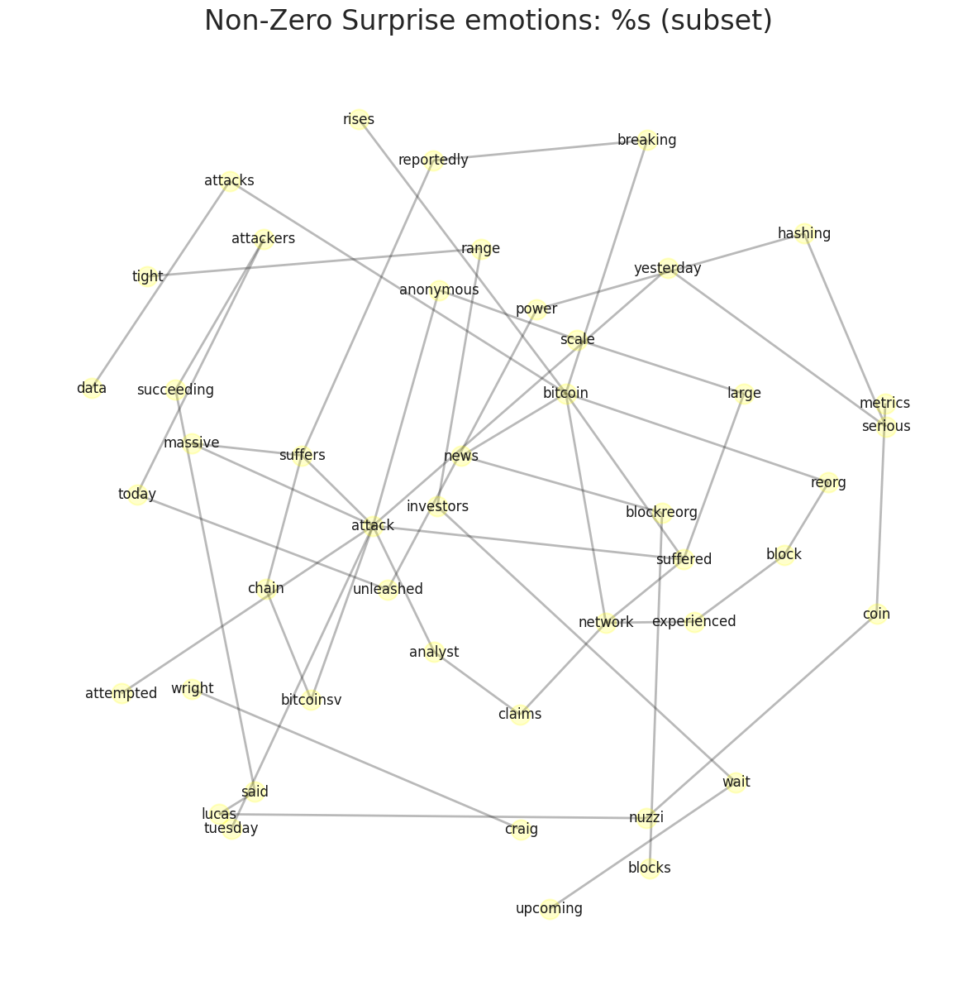

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Sur_sub = nx.spring_layout(G_Sur_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Sur_sub = {}
for node in G_Sur_sub.nodes:
    labels_Sur_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Sur_sub, Sur_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Sur_sub, Sur_sub, alpha=0.2, label=True, node_color='yellow')

# Add labels
nx.draw_networkx_labels(G_Sur_sub, Sur_sub, labels_Sur_sub)

# Add title
ax.set_title('Non-Zero Surprise emotions: %s (subset)',fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('subset_bigram_Surprise_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

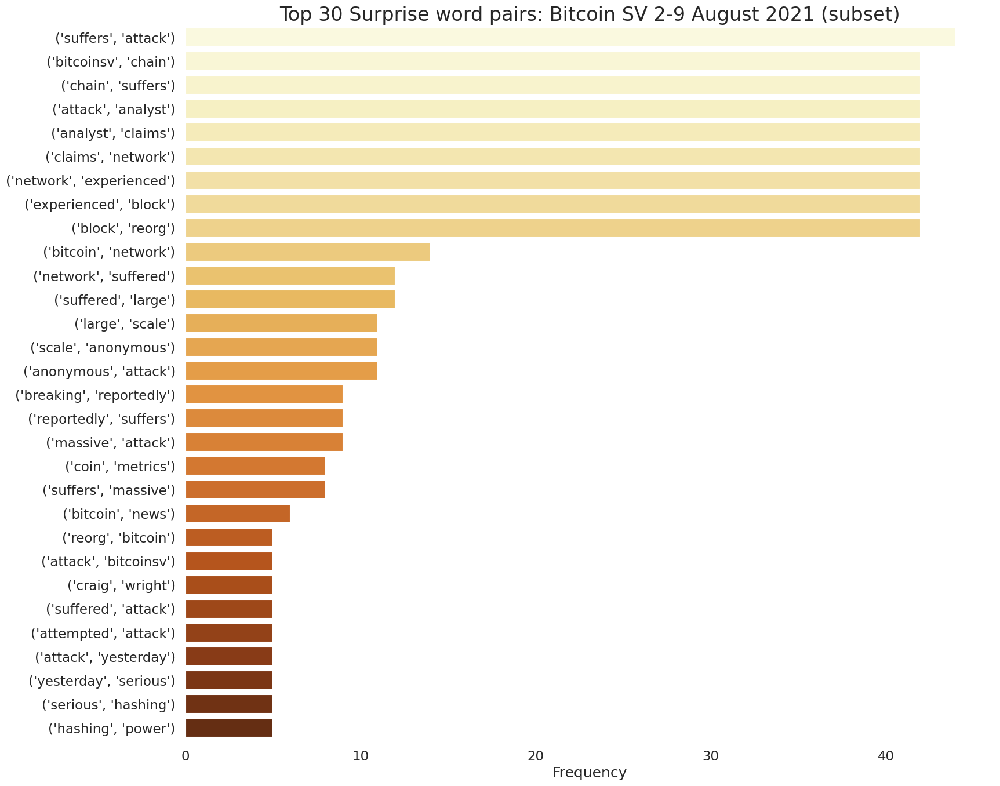

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Sur_sub = pd.DataFrame(bigramFreqSur_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Sur_sub,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            palette="YlOrBr"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Surprise word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Surprise_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Sad

In [ ]:
# Get the bigrams for positive sentiment

# Subset the data
myDataSad_sub = MyData_en_sub[MyData_en_sub['Sad']!=0.00]

# Tokenise each tweet
myTokensSad_sub = [word_tokenize(tweet) for tweet in myDataSad_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensSad_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensSad_sub]

# Generate lists of bigrams
myBigramSad_sub = [list(bigrams(tweet)) for tweet in myTokensSad_sub_noSW_noCase]

# Put all lists together
myBigramListSad_sub = list(itertools.chain.from_iterable(myBigramSad_sub))

# Get the most frequent ones
bigramFreqSad_sub = FreqDist(myBigramListSad_sub)
bigramFreqSad_sub.most_common(50)

[(('crypto', 'coin'), 27),
 (('coin', 'bitcoin'), 27),
 (('bitcoin', 'appears'), 26),
 (('faced', 'attack'), 21),
 (('appears', 'faced'), 20),
 (('cryptocurrency', 'bitcoin'), 18),
 (('bitcoin', 'blockchain'), 15),
 (('attack', 'bloomberg'), 14),
 (('blockchain', 'attack'), 14),
 (('attack', 'appears'), 14),
 (('appears', 'inflicted'), 13),
 (('inflicted', 'least'), 13),
 (('least', 'damage'), 13),
 (('damage', 'network'), 13),
 (('suffered', 'attack'), 12),
 (('massive', 'attack'), 7),
 (('bitcoin', 'suffers'), 7),
 (('appears', 'suffered'), 7),
 (('suffered', 'massive'), 6),
 (('mined', 'simultaneously'), 6),
 (('bitcoin', 'attack'), 6),
 (('crypto', 'exchanges'), 6),
 (('exchanges', 'increasingly'), 6),
 (('increasingly', 'becoming'), 6),
 (('becoming', 'wary'), 6),
 (('wary', 'bitcoin'), 6),
 (('bitcoin', 'following'), 6),
 (('following', 'string'), 6),
 (('string', 'attacks'), 6),
 (('attacks', 'network'), 6),
 (('attack', 'three'), 5),
 (('three', 'versions'), 5),
 (('versions', 

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultSad_sub = bigramFreqSad_sub.most_common(50)

# Construct the network
G_Sad_sub = nx.Graph()

# Create connections between nodes
for i in myResultSad_sub:
    G_Sad_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

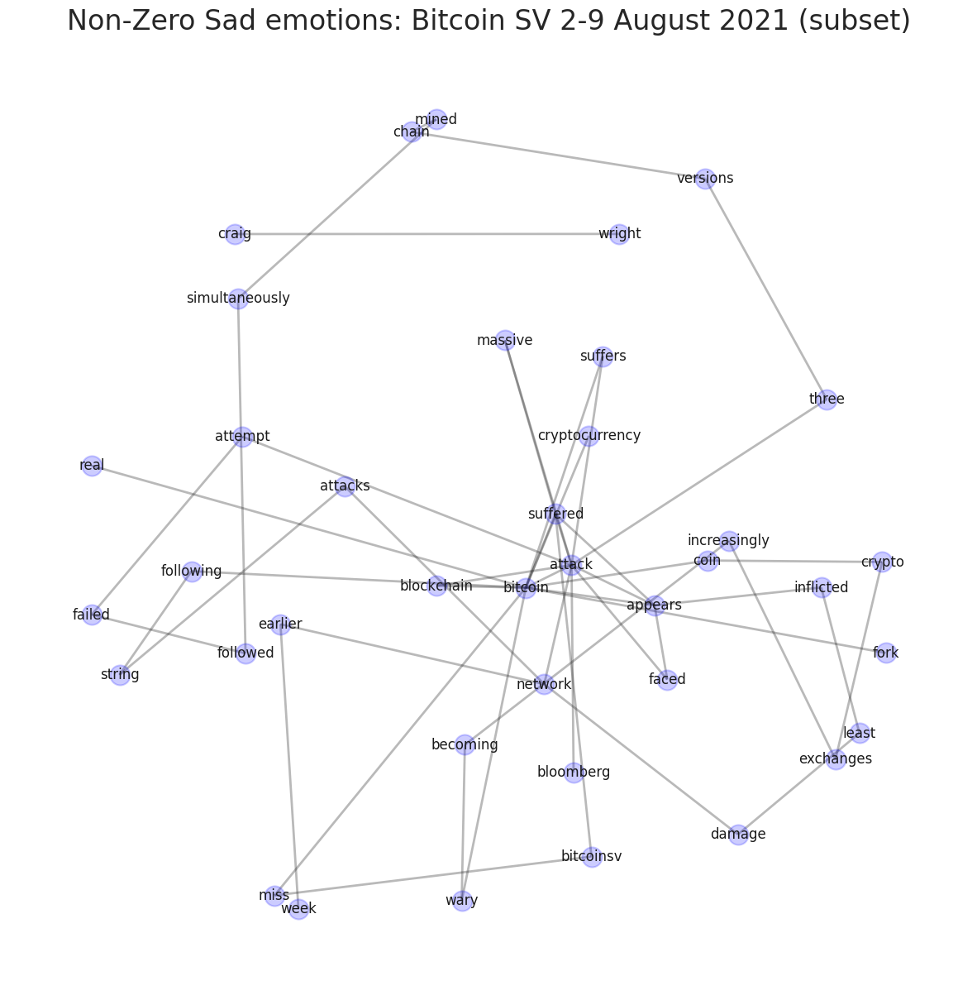

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Sad_sub = nx.spring_layout(G_Sad_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Sad_sub = {}
for node in G_Sad_sub.nodes:
    labels_Sad_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Sad_sub, Sad_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Sad_sub, Sad_sub, alpha=0.2, label=True, node_color='blue')

# Add labels
nx.draw_networkx_labels(G_Sad_sub, Sad_sub, labels_Sad_sub)

# Add title
ax.set_title('Non-Zero Sad emotions: %s (subset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('subset_bigram_Sad_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

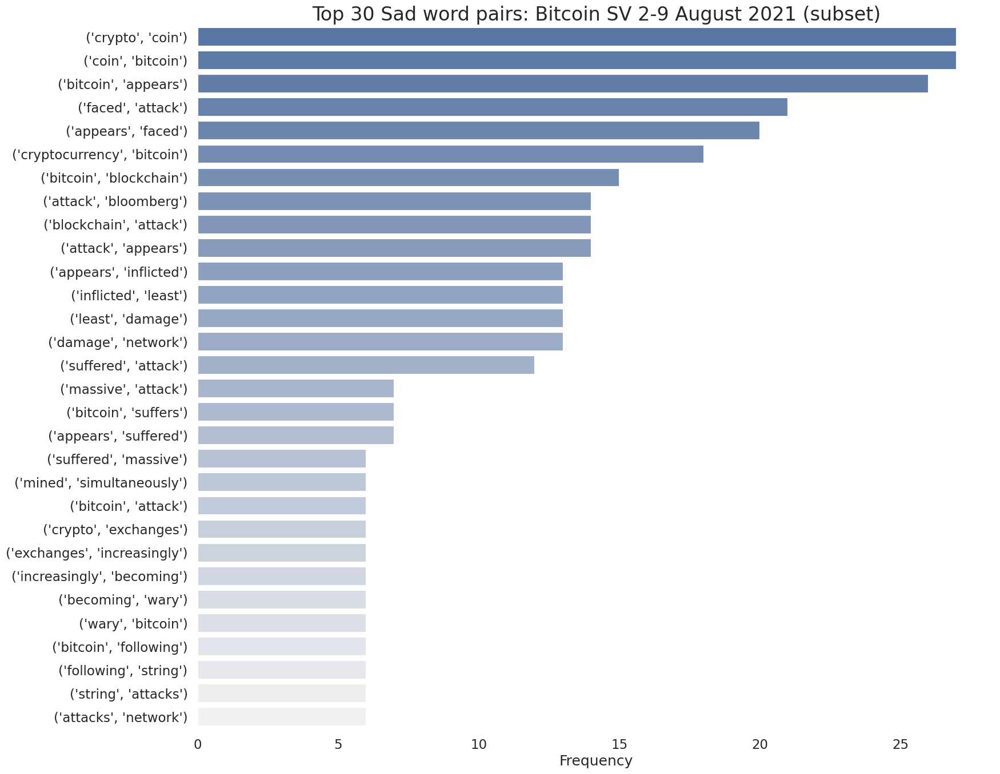

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Sad_sub = pd.DataFrame(bigramFreqSad_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Sad_sub,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            palette="light:b_r"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Sad word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Sad_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Fear

In [ ]:
# Get the bigrams for Fear emotion sentiment

# Subset the data
myDataFea_sub = MyData_en_sub[MyData_en_sub['Fear']!=0.00]

# Tokenise each tweet
myTokensFea_sub = [word_tokenize(tweet) for tweet in myDataFea_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensFea_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensFea_sub]

# Generate lists of bigrams
myBigramFea_sub = [list(bigrams(tweet)) for tweet in myTokensFea_sub_noSW_noCase]

# Put all lists together
myBigramListFea_sub = list(itertools.chain.from_iterable(myBigramFea_sub))

# Get the most frequent ones
bigramFreqFea_sub = FreqDist(myBigramListFea_sub)
bigramFreqFea_sub.most_common(50)

[(('suffers', 'attack'), 49),
 (('block', 'reorg'), 45),
 (('bitcoinsv', 'chain'), 42),
 (('chain', 'suffers'), 42),
 (('attack', 'analyst'), 42),
 (('analyst', 'claims'), 42),
 (('claims', 'network'), 42),
 (('network', 'experienced'), 42),
 (('experienced', 'block'), 42),
 (('bitcoin', 'network'), 33),
 (('another', 'attack'), 30),
 (('suffers', 'another'), 19),
 (('bitcoin', 'blockchain'), 19),
 (('cryptocurrency', 'bitcoin'), 18),
 (('suffered', 'attack'), 18),
 (('attack', 'bitcoin'), 16),
 (('massive', 'attack'), 16),
 (('network', 'suffers'), 15),
 (('another', 'major'), 15),
 (('major', 'attack'), 15),
 (('network', 'suffered'), 15),
 (('attack', 'tuesday'), 14),
 (('blockchain', 'attack'), 14),
 (('versions', 'chain'), 13),
 (('bitcoin', 'suffered'), 13),
 (('exchanges', 'delist'), 13),
 (('attack', 'appears'), 13),
 (('appears', 'inflicted'), 13),
 (('inflicted', 'least'), 13),
 (('least', 'damage'), 13),
 (('damage', 'network'), 13),
 (('bitcoin', 'trading'), 12),
 (('suffer

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultFea_sub = bigramFreqFea_sub.most_common(50)

# Construct the network
G_Fea_sub = nx.Graph()

# Create connections between nodes
for i in myResultFea_sub:
    G_Fea_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

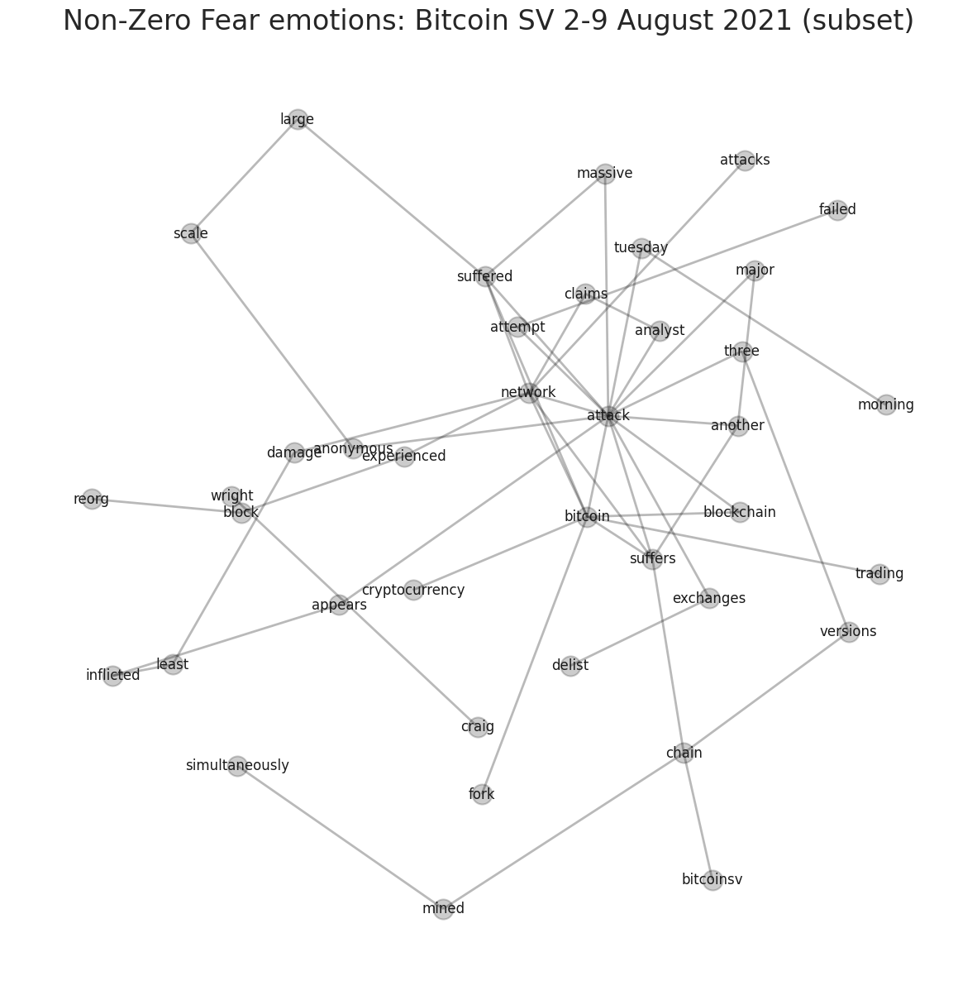

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Fea_sub = nx.spring_layout(G_Fea_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Fea_sub = {}
for node in G_Fea_sub.nodes:
    labels_Fea_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Fea_sub, Fea_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Fea_sub, Fea_sub, alpha=0.2, label=True, node_color='black')

# Add labels
nx.draw_networkx_labels(G_Fea_sub, Fea_sub, labels_Fea_sub)

# Add title
ax.set_title('Non-Zero Fear emotions: %s (subset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('subset_bigram_Fear_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

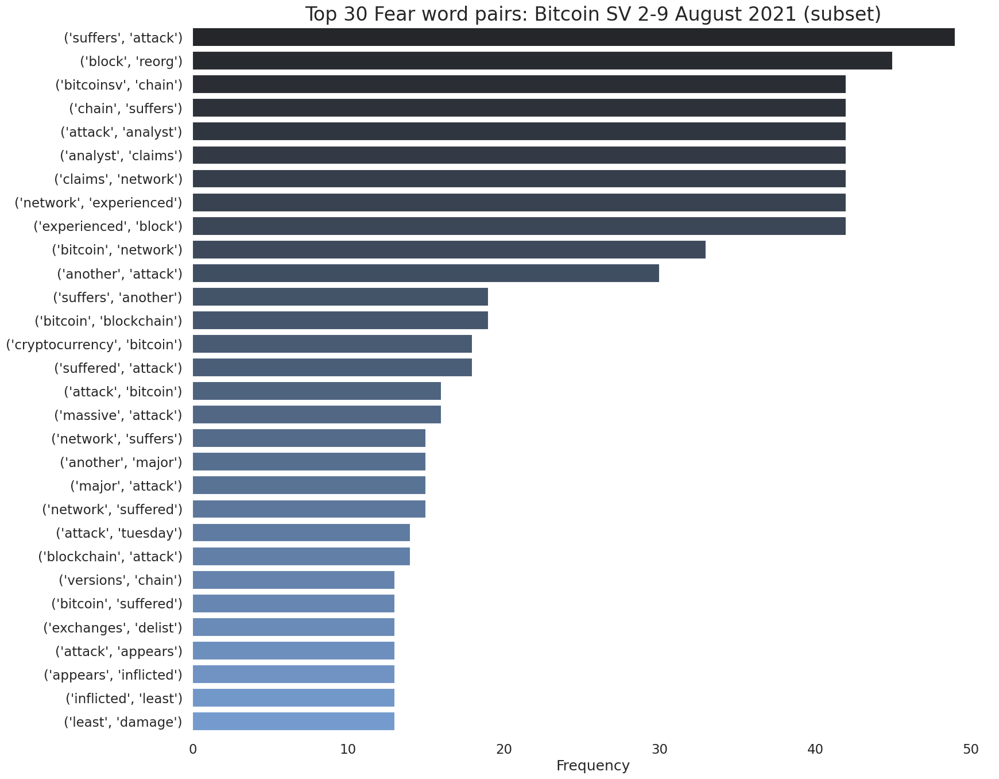

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Fea_sub = pd.DataFrame(bigramFreqFea_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Fea_sub,
            #palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            #palette="light:b_r"
            #palette="dark:salmon"
            palette="dark:#69d"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Fear word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Fear_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Neutral emotions

In [ ]:
# Get the bigrams for Fear emotion sentiment

# Subset the data
myDataNeut_sub = MyData_en_sub[(MyData_en_sub['Happy']==0.0) & (MyData_en_sub['Angry']==0.0) & \
                               (MyData_en_sub['Surprise']==0.00) & (MyData_en_sub['Sad']==0.0) & \
                               (MyData_en_sub['Fear']==0.00)]

# Tokenise each tweet
myTokensNeut_sub = [word_tokenize(tweet) for tweet in myDataNeut_sub['clean_content']]

# Remove stopwords and lowercase all
# Note that len(tweet)>2 will make sure at least three words are in a tweet.
myTokensNeut_sub_noSW_noCase = [[word.lower() for word in tweet if (len(tweet)>2) and
                            (word.lower() not in en_stopwords) and
                            (len(word)>3)] for tweet in myTokensNeut_sub]

# Generate lists of bigrams
myBigramNeut_sub = [list(bigrams(tweet)) for tweet in myTokensNeut_sub_noSW_noCase]

# Put all lists together
myBigramListNeut_sub = list(itertools.chain.from_iterable(myBigramNeut_sub))

# Get the most frequent ones
bigramFreqNeut_sub = FreqDist(myBigramListNeut_sub)
bigramFreqNeut_sub.most_common(50)

[(('three', 'attacks'), 78),
 (('bitcoin', 'rocked'), 76),
 (('rocked', 'three'), 76),
 (('attacks', 'many'), 76),
 (('many', 'months'), 76),
 (('bitcoin', 'suffers'), 45),
 (('another', 'attack'), 31),
 (('suffers', 'another'), 26),
 (('suffers', 'attack'), 22),
 (('months', 'cointelegraph'), 8),
 (('bitcoin', 'suffered'), 8),
 (('attack', 'hackers'), 6),
 (('hackers', 'reorganise'), 6),
 (('reorganise', 'blocks'), 6),
 (('attack', 'report'), 6),
 (('coinbase', 'says'), 6),
 (('says', 'attack'), 6),
 (('attack', 'occurred'), 6),
 (('occurred', 'bitcoin'), 6),
 (('bitcoin', 'stopping'), 6),
 (('stopping', 'trading'), 6),
 (('months', 'bitcoinsv'), 5),
 (('bitcoinsv', 'attack'), 5),
 (('bitcoin', 'sees'), 5),
 (('sees', 'attack'), 5),
 (('suffered', 'another'), 5),
 (('bitcoin', 'bitcoin'), 4),
 (('bitcoin', 'trading'), 4),
 (('suffered', 'attack'), 4),
 (('three', 'versions'), 4),
 (('versions', 'chain'), 4),
 (('chain', 'mined'), 4),
 (('cointelegraph', 'bitcoin'), 3),
 (('crypto', 'c

In [ ]:
# Prepare the bigram network

# We need networkx
import networkx as nx

# Collect the result
myResultNeut_sub = bigramFreqNeut_sub.most_common(50)

# Construct the network
G_Neut_sub = nx.Graph()

# Create connections between nodes
for i in myResultNeut_sub:
    G_Neut_sub.add_edge(i[0][0], i[0][1], weight=(i[1]))

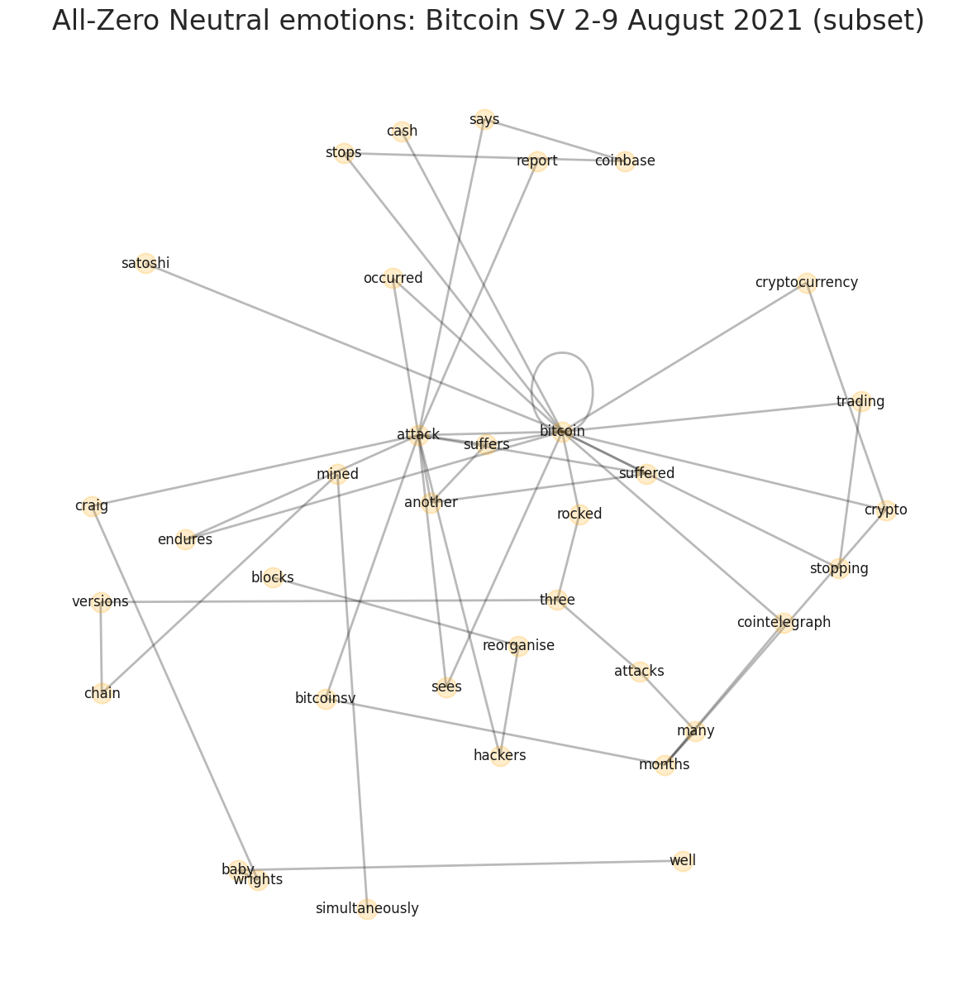

In [ ]:
# Visualisation

# set up the figure
f, ax = plt.subplots(figsize=(15, 15))

# k controls distance between nodes
Neut_sub = nx.spring_layout(G_Neut_sub, k=10, seed=9165, iterations=400)

# store the node label information
labels_Neut_sub = {}
for node in G_Neut_sub.nodes:
    labels_Neut_sub[node] = node

# Plot edges
nx.draw_networkx_edges(G_Neut_sub, Neut_sub, width=2, alpha=0.3)

# Plot nodes
nx.draw_networkx_nodes(G_Neut_sub, Neut_sub, alpha=0.2, label=True, node_color='orange')

# Add labels
nx.draw_networkx_labels(G_Neut_sub, Neut_sub, labels_Neut_sub)

# Add title
ax.set_title('All-Zero Neutral emotions: %s (subset)' % myName,fontsize=24)

# Turn off the axis
ax.axis("off")

# Save the figure
plt.savefig('subset_bigram_Neutral_'+myUrl+'.png',
            bbox_inches='tight',
            dpi=400)

# Show nicely in the notebook
plt.show()

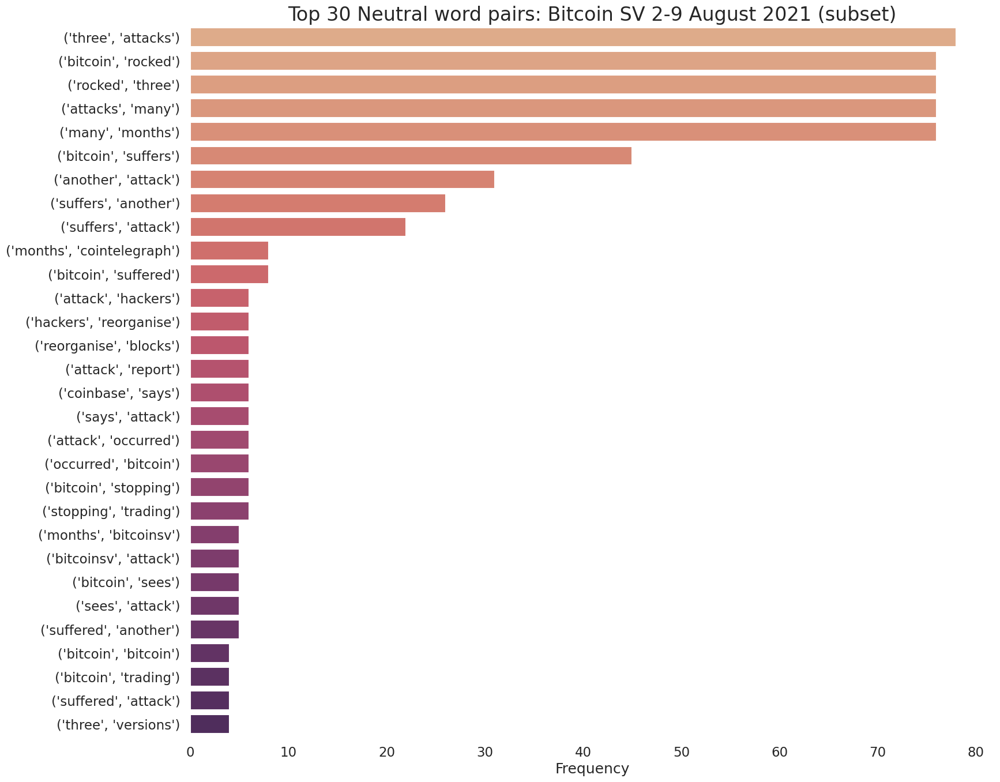

In [ ]:
# Convert the result to a dataframe for visualisation
myDF2Neut_sub = pd.DataFrame(bigramFreqNeut_sub.most_common(30), columns=['word', 'frequency'])

# Set a more specific style
sns.set_theme(style="white", context="talk")

#sns.set_theme(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18,16))

# x and y will control if the barplot is horizontal or vertical
sns.barplot(x="frequency",
            y="word",
            data=myDF2Neut_sub,
            palette="flare"
            #palette="mako"
            #palette="crest"
            #palette="dark:salmon_r"
            #palette="YlOrBr"
            #palette="ch:start=.2,rot=-.3"
            #palette="light:b_r"
            #palette="dark:salmon"
            #palette="dark:#69d"
            )

# Add label to horiztontal axis
ax.set_xlabel("Frequency")

# Remove ylabel
ax.set_ylabel("")

# Add a title
ax.set_title("Top 30 Neutral word pairs: %s (subset)" % myName, fontsize = 24)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("subset_top30_Neutral_"+myUrl+".png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

# **Visualisation of results**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Sentiments for all the events

In [ ]:
#MyData = pd.read_csv('summary_sent3_updated_may.csv')
MyData = pd.read_csv('summary_sent3_updated_sept2023.csv')
MyData.head()

,Event,dataset,positive,neutral,negative,positive %,neutral %,negative %,happy,angry,...,angry_surprise_sad,angry_surprise_fear,angry_sad_fear,surprise_sad_fear,happy_angry_surprise_sad,happy_angry_surprise_fear,happy_surprise_sad_fear,angry_surprise_sad_fear,happy_angry_surprise_sad_fear,happy_angry_surprise_sad_fear_allZero
0,E1,whole,85,134,42,32.567050,51.340996,16.091954,0.053946,0.046820,...,1,0,3,2,0,0,0,1,0,113
1,E2,whole,31941,27715,12802,44.082089,38.249745,17.668166,0.126194,0.032346,...,77,219,786,1066,44,148,178,58,11,18205
2,E3,whole,2381,1533,2241,38.683997,24.906580,36.409423,0.087631,0.080642,...,13,66,80,141,10,12,63,41,20,1384
3,E4,whole,736,394,1319,30.053083,16.088199,53.858718,0.076211,0.088828,...,16,10,24,44,0,2,11,11,5,550
4,E5,whole,1171,822,1668,31.985796,22.452882,45.561322,0.068408,0.038967,...,4,17,22,101,3,11,32,22,12,1098


In [ ]:
# splitting into 2 the dataset: whole and subset
MyData_whole = MyData[MyData['dataset'] == 'whole']
MyData_sub = MyData[MyData['dataset'] == 'subset']

Sentiments: whole datasets

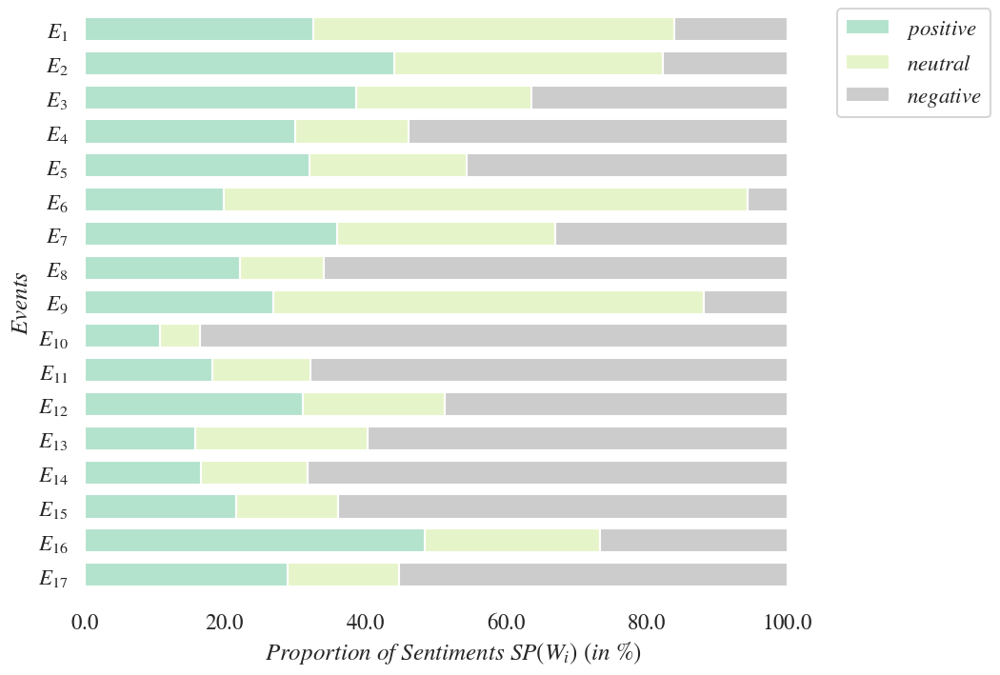

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_whole[['positive %', 'neutral %', 'negative %']].plot(kind='barh',
                                                             stacked=True,
                                                             width=0.7,
                                                             figsize=(10, 8),
                                                             use_index=True,
                                                             #order=['negative', 'neutral', 'positive'], # specify the ordering
                                                             colormap='Pastel2',
                                                             ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
#plt.legend(loc="upper right", ncol=1)
plt.xlabel(r'$Proportion\ of\ Sentiments\ SP(W_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')

ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$positive$', r'$neutral$', r'$negative$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Sentiments around 51% attacks (whole datasets)", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("sentiments_whole.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("sentiments_whole.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

Sentiments: subsets

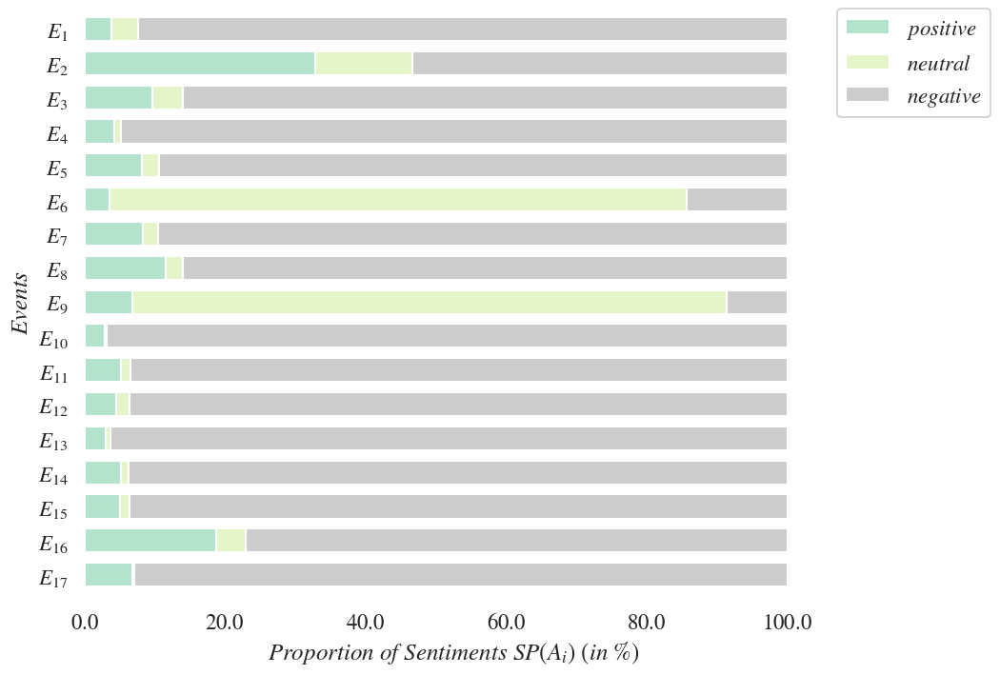

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_sub[['positive %', 'neutral %', 'negative %']].plot(kind='barh',
                                                             stacked=True,
                                                             width=0.7,
                                                             figsize=(10, 8),
                                                             use_index=True,
                                                             #order=['negative', 'neutral', 'positive'], # specify the ordering
                                                             colormap='Pastel2',
                                                             ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Proportion\ of\ Sentiments\ SP(A_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')


ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$positive$', r'$neutral$', r'$negative$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Sentiments around 51% attacks (subsets)", y=1.1, fontsize = 24)



# Save the figure
plt.savefig("sentiments_sub.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("sentiments_sub.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()



Sentiments: benchmark datasets

In [ ]:
#MyData_b = pd.read_csv('benchmark_sent2_updated_may.csv')
MyData_b = pd.read_csv('benchmark_sent2_updated_sept2023.csv')
MyData_b.head()

,Benchmark datasets,dataset,positive,neutral,negative,positive %,neutral %,negative %,happy,angry,...,"(-,a,s,d,-)","(-,a,s,-,f)","(-,a,-,d,f)","(-,-,s,d,f)","(h,a,s,d,-)","(h,a,s,-,f)","(h,-,s,d,f)","(-,a,s,d,f)","(h,a,s,d,f)","(0,0,0,0,0)"
0,Feathercoin [7-16 May 2013],benchmark_whole,22,20,9,43.137255,39.215686,17.647059,0.078431,0.065294,...,0.000000,0.000000,0.000000,3.921569,0.000000,0.000000,0.000000,0.000000,0.000000,50.980392
1,Bitcoin [15-22 May 2014],benchmark_whole,27964,26967,10477,42.753180,41.228902,16.017918,0.148395,0.033438,...,1.022360,0.313748,0.630558,1.030013,0.033671,0.064280,0.209676,0.133152,0.018366,24.789176
2,Verge [3 -10 March 2018],benchmark_whole,6303,1098,403,80.766274,14.069708,5.164018,0.409473,0.068971,...,0.064259,0.205629,0.257036,0.925331,0.064259,0.077111,0.411258,0.179925,0.089963,11.489526
3,Bitcoin Gold [15-25 April 2018],benchmark_whole,589,400,148,51.802990,35.180299,13.016711,0.109120,0.028417,...,0.176367,0.264550,0.352734,1.058201,0.088183,0.088183,0.088183,0.264550,0.000000,30.246914
4,Verge [20-28 April 2018],benchmark_whole,1932,1438,660,47.940447,35.682382,16.377171,0.103454,0.037685,...,0.373506,0.298805,0.846614,2.589641,0.124502,0.224104,0.921315,0.622510,0.323705,24.726096


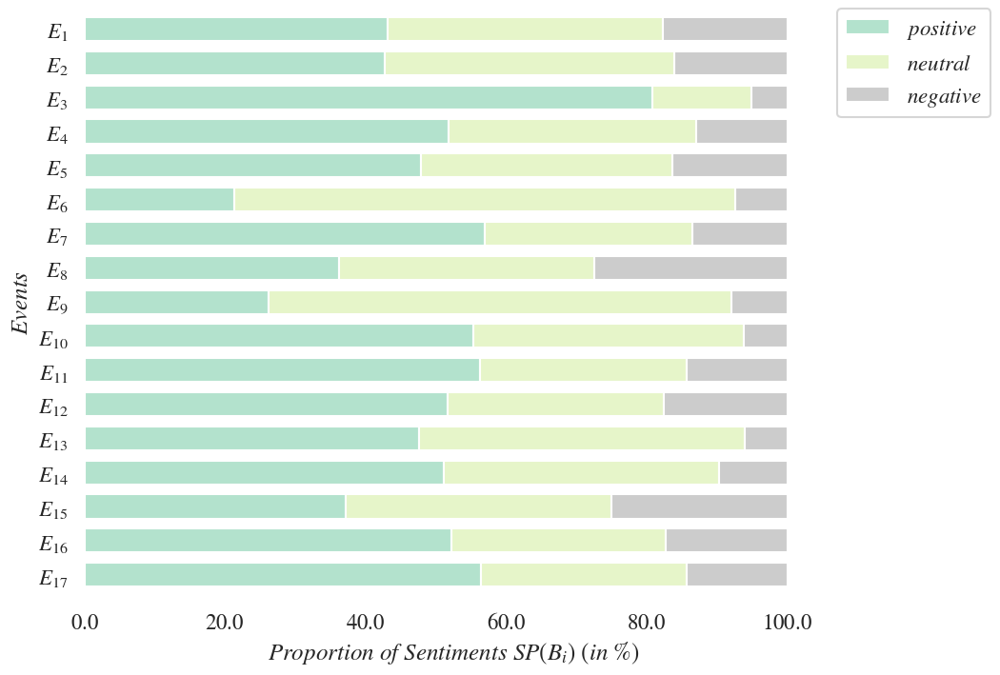

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_b[['positive %', 'neutral %', 'negative %']].plot(kind='barh',
                                                             stacked=True,
                                                             width=0.7,
                                                             figsize=(10, 8),
                                                             use_index=True,
                                                             #order=['negative', 'neutral', 'positive'], # specify the ordering
                                                             colormap='Pastel2',
                                                             ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Proportion\ of\ Sentiments\ SP(B_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')


ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$positive$', r'$neutral$', r'$negative$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Sentiments in the Benchmark datasets)", y=1.1, fontsize = 24)



# Save the figure
plt.savefig("sentiments_benchmark.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("sentiments_benchmark.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()



### Emotions for all datasets

Emotions: whole dataset

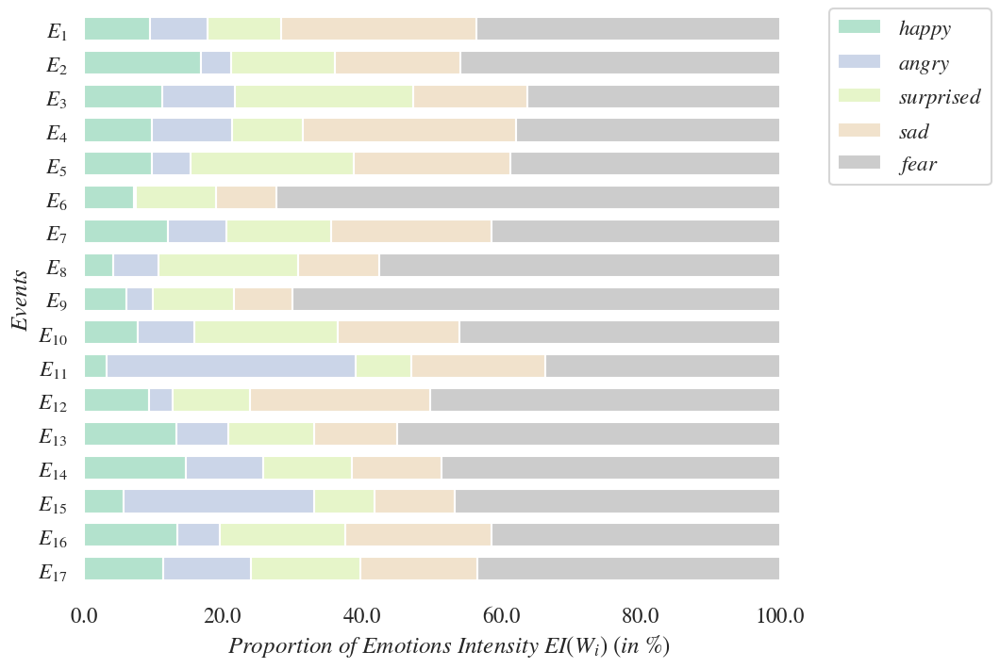

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_whole[['happy %', 'angry %', 'surprised %', 'sad %', 'fear %']].plot(kind='barh',
                                                                           stacked=True,
                                                                           width=0.7,
                                                                           figsize=(10, 8),
                                                                           use_index=True,
                                                                           colormap='Pastel2',                                                                           #colormap='Pastel2',
                                                                           ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
#plt.legend(loc="upper right", ncol=1)
plt.xlabel(r'$Proportion\ of\ Emotions\ Intensity\ EI(W_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')

ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$happy$', r'$angry$', r'$surprised$', r'$sad$', r'$fear$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Emotions around 51% attacks (whole datasets)", y=1.1, fontsize = 24)



# Save the figure
plt.savefig("emotions_whole.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("semotions_whole.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()



Emotions: subset

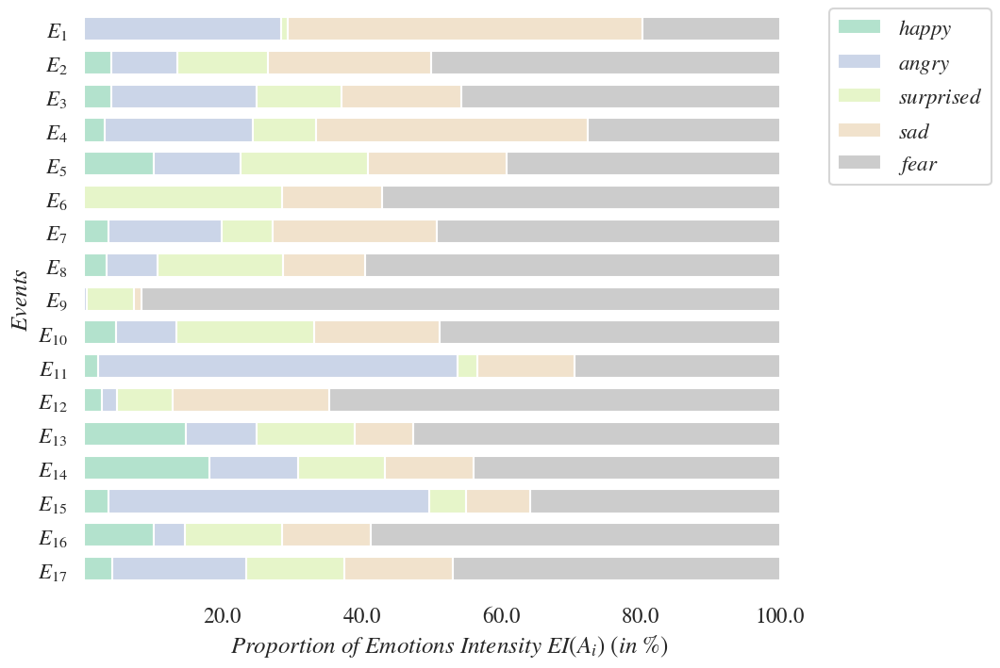

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_sub[['happy %', 'angry %', 'surprised %', 'sad %', 'fear %']].plot(kind='barh',
                                                                           stacked=True,
                                                                           width=0.7,
                                                                           figsize=(10, 8),
                                                                           use_index=True,
                                                                           colormap='Pastel2',                                                                           #colormap='Pastel2',
                                                                           ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
#plt.legend(loc="upper right", ncol=1)
plt.xlabel(r'$Proportion\ of\ Emotions\ Intensity\ EI(A_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')

ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$happy$', r'$angry$', r'$surprised$', r'$sad$', r'$fear$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Emotions around 51% attacks (subset)", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("emotions_sub.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotions_sub.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()



Emotions: benchmark

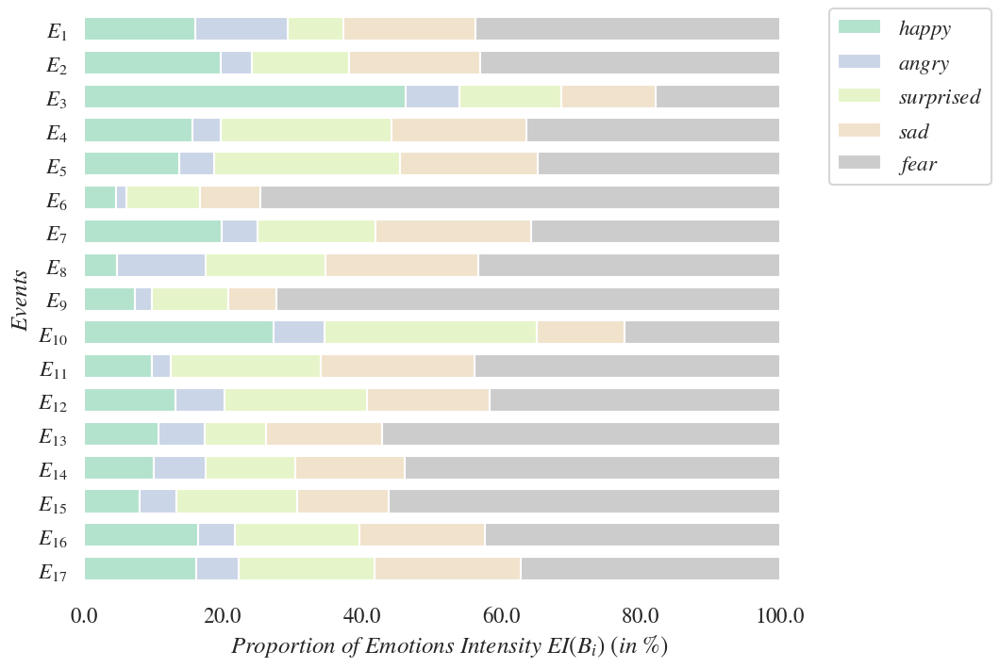

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX
def format_func(value, tick_number):
    return r'$%s$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))

MyData_b[['happy %', 'angry %', 'surprised %', 'sad %', 'fear %']].plot(kind='barh',
                                                                           stacked=True,
                                                                           width=0.7,
                                                                           figsize=(10, 8),
                                                                           use_index=True,
                                                                           colormap='Pastel2',                                                                           #colormap='Pastel2',
                                                                           ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
#plt.legend(loc="upper right", ncol=1)
plt.xlabel(r'$Proportion\ of\ Emotions\ Intensity\ EI(B_{i})\ (in\ \%)$')
plt.ylabel(r'$Events$')

ax.set_yticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the x-axis
ax.xaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$happy$', r'$angry$', r'$surprised$', r'$sad$', r'$fear$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

#reverse y-axis
plt.gca().invert_yaxis()

# Remove the border line
sns.despine(left=True, bottom=True)

# Add a title
#plt.title("Proportion of Emotions in the benchmark datasets", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("emotions_benchmark.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotions_benchmark.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()



Emotions: proportions and combined proportions (whole, sub and benchmark)

In [ ]:
import pandas as pd
#MyData_e = pd.read_csv('summary_sent4_updated_may.csv')
MyData_e = pd.read_csv('summary_sent4_updated_sept2023.csv')
MyData_e.head()

,51% Attack,dataset,happy_nonZero,angry_nonZero,surprise_nonZero,sad_nonZero,fear_nonZero,happy_only,angry_only,surprise_only,...,"(-,av,sv,dv,-)","(-,av,sv,-,fv)","(-,av,-,dv,fv)","(-,-,sv,dv,fv)","(hv,av,sv,dv,-)","(hv,av,sv,-,fv)","(hv,-,sv,dv,fv)","(-,av,sv,dv,fv)","(hv,av,sv,dv,fv)","(0,0,0,0,0)"
0,Feathercoin [8 June 2013],whole,18,18,24,53,77,11,9,10,...,0.383142,0.000000,1.149425,0.766284,0.000000,0.000000,0.000000,0.383142,0.000000,43.295019
1,Bitcoin [16 June 2014],whole,15297,4917,13514,15915,33883,4574,827,4112,...,0.106383,0.302570,1.085935,1.472783,0.060790,0.204476,0.245924,0.080133,0.015198,25.151976
2,Verge [4 April 2018],whole,1063,1035,2226,1532,2658,194,135,556,...,0.212453,1.078608,1.307403,2.304298,0.163425,0.196110,1.029580,0.670044,0.326851,22.618075
3,Bitcoin Gold [16-19 May 2018],whole,330,448,348,1109,1013,102,30,103,...,0.656545,0.410341,0.984817,1.805499,0.000000,0.082068,0.451375,0.451375,0.205170,22.568732
4,Verge [21-22 May 2018],whole,503,294,932,951,1451,113,58,398,...,0.109709,0.466264,0.603401,2.770159,0.082282,0.301700,0.877674,0.603401,0.329128,30.115195


In [ ]:
# splitting into 2 the dataset: whole and subset
MyData_e_whole = MyData_e[MyData_e['dataset'] == 'whole']
MyData_e_sub = MyData_e[MyData_e['dataset'] == 'subset']

In [ ]:
# set 51% Attack column as index and drop the columns that are not needed

MyData_e_whole_hm  = MyData_e_whole.drop(columns=['dataset', '51% Attack', 'happy_nonZero', \
                                                    'angry_nonZero', 'surprise_nonZero', \
                                                    'sad_nonZero', 'fear_nonZero', \
                                                    'happy_nonZero%', 'angry_nonZero%', 'surprise_nonZero%', \
                                                    'sad_nonZero%', 'fear_nonZero%', \
                                                    'happy_angry_surprise_sad_fear_allZero%_1', \
                                                    'happy_only', 'angry_only', 'surprise_only', \
                                                    'sad_only', 'fear_only', \
                                                    'happy_angry', 'happy_surprise', \
                                                    'happy_sad', 'happy_fear', \
                                                    'angry_surprise', 'angry_sad', \
                                                    'angry_fear', 'surprise_sad', \
                                                    'surprise_fear', 'sad_fear', \
                                                    'happy_angry_surprise', 'happy_angry_sad', \
                                                    'happy_angry_fear', 'happy_surprise_sad', \
                                                    'happy_surprise_fear', 'happy_sad_fear', \
                                                    'angry_surprise_sad', 'angry_surprise_fear', \
                                                    'angry_sad_fear', 'surprise_sad_fear', \
                                                    'happy_angry_surprise_sad', 'happy_angry_surprise_fear', \
                                                    'happy_surprise_sad_fear', 'angry_surprise_sad_fear', \
                                                    'happy_angry_surprise_sad_fear', \
                                                    'happy_angry_surprise_sad_fear_allZero'], axis=1)
MyData_e_whole_hm

,"(hv,-,-,-,-)","(-,av,-,-,-)","(-,-,sv,-,-)","(-,-,-,dv,-)","(-,-,-,-,fv)","(hv,av,-,-,-)","(hv,-,sv,-,-)","(hv,-,-,dv,-)","(hv,-,-,-,fv)","(-,av,sv,-,-)",...,"(-,av,sv,dv,-)","(-,av,sv,-,fv)","(-,av,-,dv,fv)","(-,-,sv,dv,fv)","(hv,av,sv,dv,-)","(hv,av,sv,-,fv)","(hv,-,sv,dv,fv)","(-,av,sv,dv,fv)","(hv,av,sv,dv,fv)","(0,0,0,0,0)"
0,4.214559,3.448276,3.831418,12.260536,21.072797,0.000000,0.383142,0.000000,1.149425,0.000000,...,0.383142,0.000000,1.149425,0.766284,0.000000,0.000000,0.000000,0.383142,0.000000,43.295019
1,6.319425,1.142581,5.681127,7.413650,21.581929,0.509809,1.700746,1.721470,7.033711,0.306715,...,0.106383,0.302570,1.085935,1.472783,0.060790,0.204476,0.245924,0.080133,0.015198,25.151976
2,3.170453,2.206243,9.086452,4.265403,14.267037,0.228796,3.252165,1.062265,2.336983,4.804707,...,0.212453,1.078608,1.307403,2.304298,0.163425,0.196110,1.029580,0.670044,0.326851,22.618075
3,4.185474,1.231022,4.226508,9.519902,14.033648,0.246204,0.779647,1.313090,2.585146,0.410341,...,0.656545,0.410341,0.984817,1.805499,0.000000,0.082068,0.451375,0.451375,0.205170,22.568732
4,3.099287,1.590784,10.916072,8.968733,15.798135,0.274273,0.795392,1.151947,2.879868,0.383982,...,0.109709,0.466264,0.603401,2.770159,0.082282,0.301700,0.877674,0.603401,0.329128,30.115195
5,2.378121,0.000000,6.183115,4.042806,52.556480,0.000000,2.259215,1.307967,2.259215,0.118906,...,0.000000,0.000000,0.118906,0.713436,0.000000,0.000000,0.118906,0.356718,0.000000,21.997622
6,4.080352,2.008788,6.026365,7.595731,16.886378,0.313873,0.878845,1.192718,4.080352,0.690521,...,0.188324,0.251099,1.318267,2.385436,0.062775,0.125549,0.627746,0.251099,0.125549,33.270559
7,0.804564,1.784669,10.254535,4.651843,31.100059,0.380339,0.672908,0.175541,2.867174,0.526624,...,0.043885,0.629023,0.760679,1.418958,0.029257,0.058514,0.336454,0.102399,0.131656,23.932124
8,1.952278,0.867679,4.338395,2.603037,49.240781,0.000000,0.867679,0.867679,2.819957,2.386117,...,0.216920,0.216920,1.084599,2.386117,0.000000,0.216920,0.433839,0.650759,0.000000,18.004338
9,2.844639,1.531729,4.595186,1.531729,20.568928,0.218818,0.656455,0.656455,1.312910,0.000000,...,0.000000,0.218818,1.312910,1.531729,0.000000,0.000000,0.218818,0.218818,0.000000,38.730853


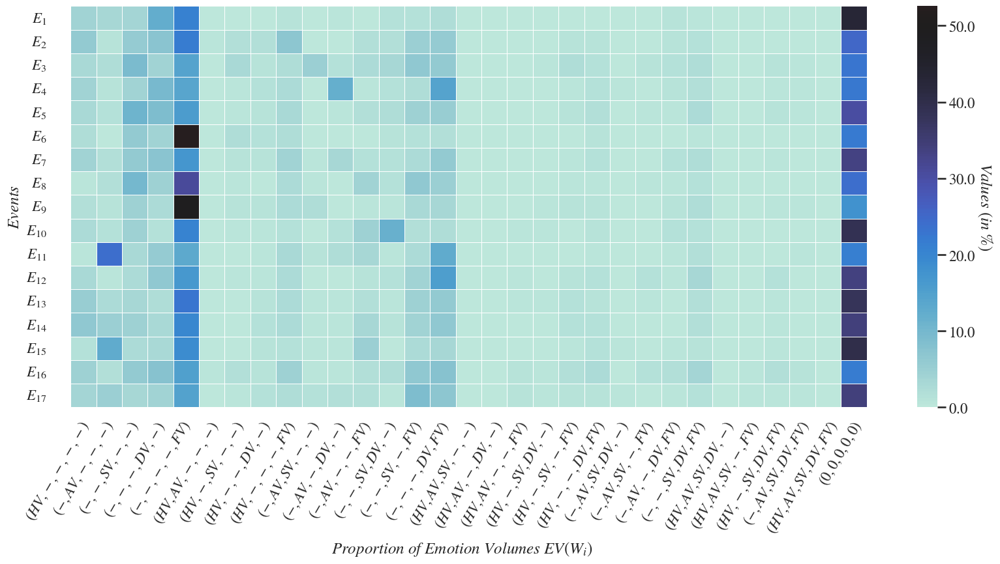

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(data=MyData_e_whole_hm,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Proportion\ of\ Emotion\ Volumes\ EV(W_{i})$')
plt.ylabel(r'$Events$')

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((-0.5,0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5, \
               14.5,15.5,16.5,17.5,18.5,19.5,20.5,21.5,22.5,23.5,24.5,25.5,26.5,27.5,28.5,30))
ax.set_xticklabels(('$(HV,-,-,-,-)$', '$(-,AV,-,-,-)$', '$(-,-,SV,-,-)$', '$(-,-,-,DV,-)$', \
                    '$(-,-,-,-,FV)$', '$(HV,AV,-,-,-)$', '$(HV,-,SV,-,-)$', \
                    '$(HV,-,-,DV,-)$', '$(HV,-,-,-,FV)$', '$(-,AV,SV,-,-)$', \
                    '$(-,AV,-,DV,-)$', '$(-,AV,-,-,FV)$', '$(-,-,SV,DV,-)$', \
                    '$(-,-,SV,-,FV)$', '$(-,-,-,DV,FV)$', '$(HV,AV,SV,-,-)$', \
                    '$(HV,AV,-,DV,-)$', '$(HV,AV,-,-,FV)$', '$(HV,-,SV,DV,-)$', \
                    '$(HV,-,SV,-,FV)$', '$(HV,-,-,DV,FV)$', '$(-,AV,SV,DV,-)$', \
                    '$(-,AV,SV,-,FV)$', '$(-,AV,-,DV,FV)$', '$(-,-,SV,DV,FV)$', \
                    '$(HV,AV,SV,DV,-)$', '$(HV,AV,SV,-,FV)$', '$(HV,-,SV,DV,FV)$', \
                    '$(-,AV,SV,DV,FV)$', '$(HV,AV,SV,DV,FV)$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of Emotion combinations (in %) across the whole datasets ", y=1.1, fontsize = 24)



# Save the figure
plt.savefig("emotion_proportion_whole.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_v_prop_whole.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

plt.show()

In [ ]:
# set 51% Attack column as index and drop the columns that are not needed

MyData_e_sub_hm  = MyData_e_sub.drop(columns=['dataset', '51% Attack', 'happy_nonZero', \
                                                    'angry_nonZero', 'surprise_nonZero', \
                                                    'sad_nonZero', 'fear_nonZero', \
                                                    'happy_nonZero%', 'angry_nonZero%', 'surprise_nonZero%', \
                                                    'sad_nonZero%', 'fear_nonZero%', \
                                                    'happy_angry_surprise_sad_fear_allZero%_1', \
                                                    'happy_only', 'angry_only', 'surprise_only', \
                                                    'sad_only', 'fear_only', \
                                                    'happy_angry', 'happy_surprise', \
                                                    'happy_sad', 'happy_fear', \
                                                    'angry_surprise', 'angry_sad', \
                                                    'angry_fear', 'surprise_sad', \
                                                    'surprise_fear', 'sad_fear', \
                                                    'happy_angry_surprise', 'happy_angry_sad', \
                                                    'happy_angry_fear', 'happy_surprise_sad', \
                                                    'happy_surprise_fear', 'happy_sad_fear', \
                                                    'angry_surprise_sad', 'angry_surprise_fear', \
                                                    'angry_sad_fear', 'surprise_sad_fear', \
                                                    'happy_angry_surprise_sad', 'happy_angry_surprise_fear', \
                                                    'happy_surprise_sad_fear', 'angry_surprise_sad_fear', \
                                                    'happy_angry_surprise_sad_fear', \
                                                    'happy_angry_surprise_sad_fear_allZero'], axis=1)
MyData_e_sub_hm

,"(hv,-,-,-,-)","(-,av,-,-,-)","(-,-,sv,-,-)","(-,-,-,dv,-)","(-,-,-,-,fv)","(hv,av,-,-,-)","(hv,-,sv,-,-)","(hv,-,-,dv,-)","(hv,-,-,-,fv)","(-,av,sv,-,-)",...,"(-,av,sv,dv,-)","(-,av,sv,-,fv)","(-,av,-,dv,fv)","(-,-,sv,dv,fv)","(hv,av,sv,dv,-)","(hv,av,sv,-,fv)","(hv,-,sv,dv,fv)","(-,av,sv,dv,fv)","(hv,av,sv,dv,fv)","(0,0,0,0,0)"
17,0.000000,23.076923,0.000000,42.307692,15.384615,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,3.846154,0.000000,0.000000,0.000000,0.000000,3.846154,0.000000,11.538462
18,1.325869,0.736594,1.591043,1.826753,16.499705,1.414260,0.117855,0.265174,1.325869,0.500884,...,0.000000,2.474956,15.822039,2.916912,0.000000,0.117855,0.058928,0.265174,0.029464,17.766647
19,0.505051,8.249158,6.060606,3.535354,27.104377,0.168350,0.505051,1.010101,2.356902,0.673401,...,0.505051,1.010101,4.040404,1.010101,0.168350,0.168350,0.505051,0.841751,0.168350,11.447811
20,0.598802,1.696607,4.890220,10.778443,13.173653,0.199601,0.099800,1.097804,1.097804,0.499002,...,1.297405,0.199601,1.696607,1.996008,0.000000,0.099800,0.499002,0.399202,0.299401,15.568862
21,3.524229,3.083700,6.607930,7.048458,12.481645,0.146843,0.587372,1.027900,2.643172,0.293686,...,0.293686,0.881057,0.881057,2.055800,0.000000,0.293686,0.440529,0.440529,0.734214,38.032305
22,0.000000,0.000000,7.142857,3.571429,14.285714,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,75.000000
23,0.523560,2.356021,2.617801,6.544503,26.963351,0.261780,1.047120,0.000000,1.570681,0.261780,...,0.261780,0.523560,1.832461,1.832461,0.000000,0.000000,0.000000,0.261780,0.000000,29.057592
24,0.403316,2.038987,8.245575,4.436478,31.369034,0.089626,0.672194,0.067219,3.114497,0.717006,...,0.044813,0.358503,0.537755,1.277168,0.022406,0.044813,0.201658,0.044813,0.022406,27.089402
25,0.000000,0.000000,5.172414,0.000000,84.482759,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.724138,0.000000,3.448276
26,1.587302,1.322751,3.439153,1.058201,22.222222,0.000000,0.264550,0.529101,0.264550,0.000000,...,0.000000,0.000000,1.322751,1.058201,0.000000,0.000000,0.000000,0.000000,0.000000,40.740741


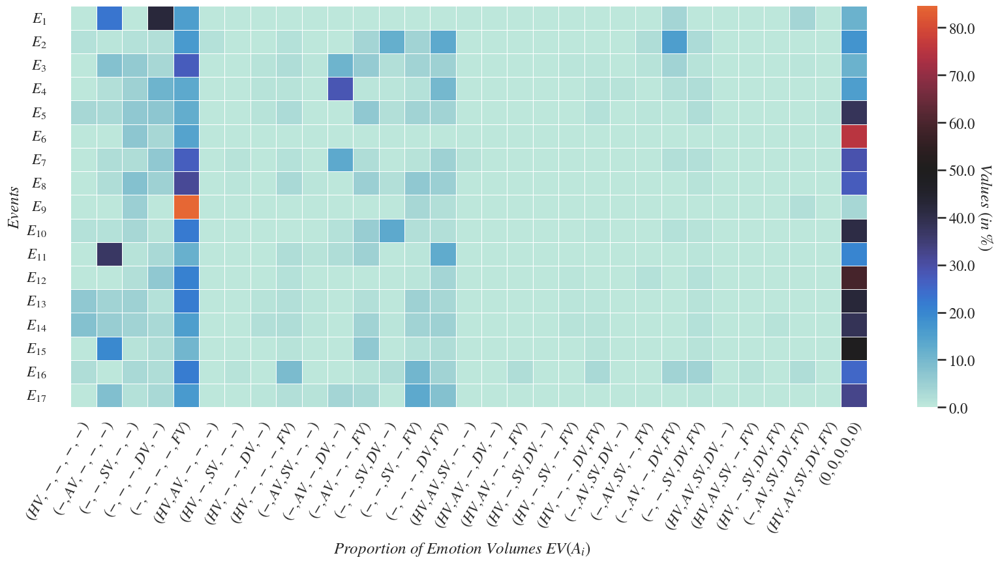

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(data=MyData_e_sub_hm,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Proportion\ of\ Emotion\ Volumes\ EV(A_{i})$')
plt.ylabel(r'$Events$')

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((-0.5,0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5, \
               14.5,15.5,16.5,17.5,18.5,19.5,20.5,21.5,22.5,23.5,24.5,25.5,26.5,27.5,28.5,30))
ax.set_xticklabels(('$(HV,-,-,-,-)$', '$(-,AV,-,-,-)$', '$(-,-,SV,-,-)$', '$(-,-,-,DV,-)$', \
                    '$(-,-,-,-,FV)$', '$(HV,AV,-,-,-)$', '$(HV,-,SV,-,-)$', \
                    '$(HV,-,-,DV,-)$', '$(HV,-,-,-,FV)$', '$(-,AV,SV,-,-)$', \
                    '$(-,AV,-,DV,-)$', '$(-,AV,-,-,FV)$', '$(-,-,SV,DV,-)$', \
                    '$(-,-,SV,-,FV)$', '$(-,-,-,DV,FV)$', '$(HV,AV,SV,-,-)$', \
                    '$(HV,AV,-,DV,-)$', '$(HV,AV,-,-,FV)$', '$(HV,-,SV,DV,-)$', \
                    '$(HV,-,SV,-,FV)$', '$(HV,-,-,DV,FV)$', '$(-,AV,SV,DV,-)$', \
                    '$(-,AV,SV,-,FV)$', '$(-,AV,-,DV,FV)$', '$(-,-,SV,DV,FV)$', \
                    '$(HV,AV,SV,DV,-)$', '$(HV,AV,SV,-,FV)$', '$(HV,-,SV,DV,FV)$', \
                    '$(-,AV,SV,DV,FV)$', '$(HV,AV,SV,DV,FV)$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of Emotion combinations (in %) across the subsets ", y=1.1, fontsize = 24)


# Save the figure
plt.savefig("emotion_proportion_sub.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_v_prop_sub.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)


plt.show()

In [ ]:
MyData_b.head(2)

,Benchmark datasets,dataset,positive,neutral,negative,positive %,neutral %,negative %,happy,angry,...,"(-,a,s,d,-)","(-,a,s,-,f)","(-,a,-,d,f)","(-,-,s,d,f)","(h,a,s,d,-)","(h,a,s,-,f)","(h,-,s,d,f)","(-,a,s,d,f)","(h,a,s,d,f)","(0,0,0,0,0)"
0,Feathercoin [7-16 May 2013],benchmark_whole,22,20,9,43.137255,39.215686,17.647059,0.078431,0.065294,...,0.00000,0.000000,0.000000,3.921569,0.000000,0.00000,0.000000,0.000000,0.000000,50.980392
1,Bitcoin [15-22 May 2014],benchmark_whole,27964,26967,10477,42.753180,41.228902,16.017918,0.148395,0.033438,...,1.02236,0.313748,0.630558,1.030013,0.033671,0.06428,0.209676,0.133152,0.018366,24.789176


In [ ]:
# drop the columns that are not needed

MyData_b_hm  = MyData_b.drop(columns=['Benchmark datasets', 'dataset', 'positive', 'neutral', \
                                      'negative', 'positive %', 'neutral %',  'negative %', \
                                      'happy', 'angry', 'surprised', 'sad', 'fear', \
                                      'happy %', 'angry %', 'surprised %', 'sad %', 'fear %', \
                                      'happy_nonZero', 'angry_nonZero', 'surprise_nonZero', \
                                      'sad_nonZero', 'fear_nonZero', 'happy_nonZero%', \
                                      'angry_nonZero%', 'surprise_nonZero%', \
                                      'sad_nonZero%', 'fear_nonZero%', \
                                      'happy_angry_surprise_sad_fear_allZero%_1', \
                                      'happy_only', 'angry_only', 'surprise_only', \
                                      'sad_only', 'fear_only', \
                                      'happy_angry', 'happy_surprise', \
                                      'happy_sad', 'happy_fear', \
                                      'angry_surprise', 'angry_sad', \
                                      'angry_fear', 'surprise_sad', \
                                      'surprise_fear', 'sad_fear', \
                                      'happy_angry_surprise', 'happy_angry_sad', \
                                      'happy_angry_fear', 'happy_surprise_sad', \
                                      'happy_surprise_fear', 'happy_sad_fear', \
                                      'angry_surprise_sad', 'angry_surprise_fear', \
                                      'angry_sad_fear', 'surprise_sad_fear', \
                                      'happy_angry_surprise_sad', 'happy_angry_surprise_fear', \
                                      'happy_surprise_sad_fear', 'angry_surprise_sad_fear', \
                                      'happy_angry_surprise_sad_fear', \
                                      'happy_angry_surprise_sad_fear_allZero'], axis=1)
MyData_b_hm

,"(h,-,-,-,-)","(-,a,-,-,-)","(-,-,s,-,-)","(-,-,-,d,-)","(-,-,-,-,f)","(h,a,-,-,-)","(h,-,s,-,-)","(h,-,-,d,-)","(h,-,-,-,f)","(-,a,s,-,-)",...,"(-,a,s,d,-)","(-,a,s,-,f)","(-,a,-,d,f)","(-,-,s,d,f)","(h,a,s,d,-)","(h,a,s,-,f)","(h,-,s,d,f)","(-,a,s,d,f)","(h,a,s,d,f)","(0,0,0,0,0)"
0,5.882353,3.921569,1.960784,7.843137,15.686275,3.921569,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,3.921569,0.000000,0.000000,0.000000,0.000000,0.000000,50.980392
1,7.245290,1.521297,5.811231,7.643215,19.998776,0.381089,1.539662,2.589571,9.263992,0.310687,...,1.022360,0.313748,0.630558,1.030013,0.033671,0.064280,0.209676,0.133152,0.018366,24.789176
2,3.842694,0.668295,2.865956,2.428994,7.428351,0.192777,19.856060,26.539005,3.405732,0.179925,...,0.064259,0.205629,0.257036,0.925331,0.064259,0.077111,0.411258,0.179925,0.089963,11.489526
3,7.583774,1.587302,10.758377,7.848325,15.873016,0.088183,1.146384,0.881834,2.821869,0.264550,...,0.176367,0.264550,0.352734,1.058201,0.088183,0.088183,0.088183,0.264550,0.000000,30.246914
4,4.307769,1.419323,12.773904,6.324701,13.595618,0.174303,2.265936,1.693227,4.108566,1.045817,...,0.373506,0.298805,0.846614,2.589641,0.124502,0.224104,0.921315,0.622510,0.323705,24.726096
5,1.571856,0.449102,5.464072,3.293413,50.673653,0.074850,0.374251,0.523952,1.871257,0.224551,...,0.000000,0.000000,0.299401,1.347305,0.000000,0.000000,0.149701,0.074850,0.000000,24.176647
6,8.080808,1.683502,5.050505,10.101010,14.478114,0.000000,2.356902,1.010101,4.713805,0.336700,...,0.000000,0.673401,0.336700,2.020202,0.000000,1.683502,0.336700,0.673401,0.000000,29.966330
7,1.179673,4.627949,5.535390,10.163339,20.871143,0.272232,0.453721,0.816697,1.996370,4.083485,...,0.181488,1.179673,0.635209,5.898367,0.000000,0.000000,0.544465,0.453721,0.362976,18.965517
8,3.333333,0.370370,4.814815,2.222222,49.814815,0.000000,0.185185,0.555556,2.777778,0.185185,...,0.000000,0.185185,0.925926,2.962963,0.000000,0.000000,1.296296,0.370370,0.000000,17.592593
9,10.769231,3.076923,15.384615,4.615385,10.769231,0.000000,4.615385,4.615385,3.076923,1.538462,...,0.000000,0.000000,0.000000,3.076923,0.000000,0.000000,0.000000,0.000000,0.000000,36.923077


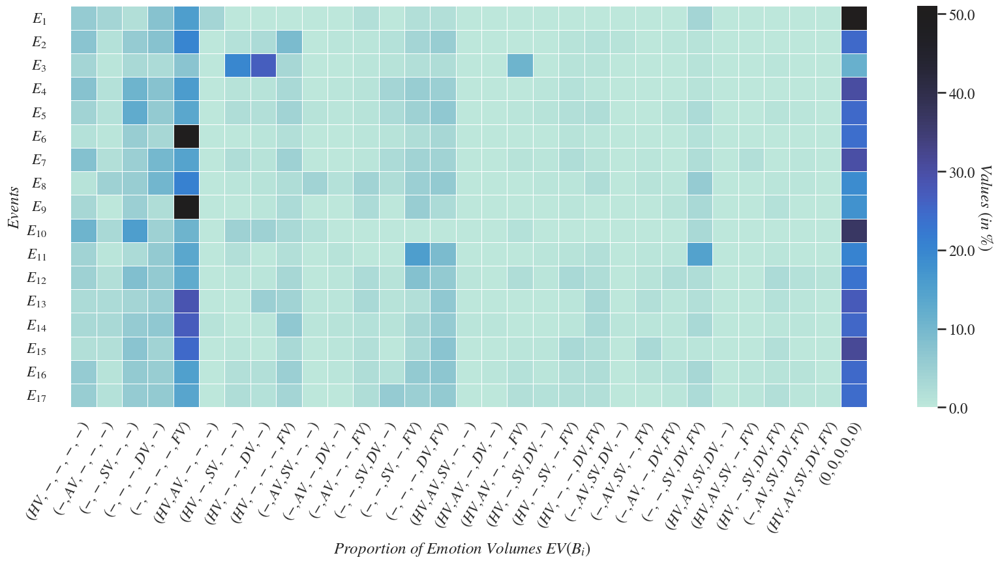

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib import ticker
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(data=MyData_b_hm,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Proportion\ of\ Emotion\ Volumes\ EV(B_{i})$')
plt.ylabel("$Events$")

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((-0.5,0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5, \
               14.5,15.5,16.5,17.5,18.5,19.5,20.5,21.5,22.5,23.5,24.5,25.5,26.5,27.5,28.5,30))
ax.set_xticklabels(('$(HV,-,-,-,-)$', '$(-,AV,-,-,-)$', '$(-,-,SV,-,-)$', '$(-,-,-,DV,-)$', \
                    '$(-,-,-,-,FV)$', '$(HV,AV,-,-,-)$', '$(HV,-,SV,-,-)$', \
                    '$(HV,-,-,DV,-)$', '$(HV,-,-,-,FV)$', '$(-,AV,SV,-,-)$', \
                    '$(-,AV,-,DV,-)$', '$(-,AV,-,-,FV)$', '$(-,-,SV,DV,-)$', \
                    '$(-,-,SV,-,FV)$', '$(-,-,-,DV,FV)$', '$(HV,AV,SV,-,-)$', \
                    '$(HV,AV,-,DV,-)$', '$(HV,AV,-,-,FV)$', '$(HV,-,SV,DV,-)$', \
                    '$(HV,-,SV,-,FV)$', '$(HV,-,-,DV,FV)$', '$(-,AV,SV,DV,-)$', \
                    '$(-,AV,SV,-,FV)$', '$(-,AV,-,DV,FV)$', '$(-,-,SV,DV,FV)$', \
                    '$(HV,AV,SV,DV,-)$', '$(HV,AV,SV,-,FV)$', '$(HV,-,SV,DV,FV)$', \
                    '$(-,AV,SV,DV,FV)$', '$(HV,AV,SV,DV,FV)$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of Emotion combinations (in %) across the benchmark datasets ", y=1.1, fontsize = 24)



# Save the figure
plt.savefig("emotion_proportion_benchmark.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_v_prop_bench.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

plt.show()

Emotion proportions combined

In [ ]:
# set 51% Attack column as index and keep the columns that are needed

MyData_e_whole_hm2  = pd.DataFrame(MyData_e_whole[['happy_nonZero%', 'angry_nonZero%', \
                                                   'surprise_nonZero%', 'sad_nonZero%', \
                                                   'fear_nonZero%', 'happy_angry_surprise_sad_fear_allZero%_1']])


MyData_e_whole_hm2 = MyData_e_whole_hm2.rename(columns={
    'happy_nonZero%': 'H($W_i$)>0',
    'angry_nonZero%': 'A($W_i$)>0',
    'surprise_nonZero%': 'S($W_i$)>0',
    'sad_nonZero%': 'D($W_i$)>0',
    'fear_nonZero%': 'F($W_i$)>0',
    'happy_angry_surprise_sad_fear_allZero%_1': '(0,0,0,0,0)'
})


MyData_e_whole_hm2

,H($W_i$)>0,A($W_i$)>0,S($W_i$)>0,D($W_i$)>0,F($W_i$)>0,"(0,0,0,0,0)"
0,5.940594,5.940594,7.920792,17.491749,25.412541,37.293729
1,15.036714,4.833335,13.284053,15.644199,33.306465,17.895234
2,10.739543,10.456658,22.489392,15.477874,26.853910,13.982623
3,8.688784,11.795682,9.162717,29.199579,26.671933,14.481306
4,9.619430,5.622490,17.823676,18.187034,27.749092,20.998279
5,8.282209,0.817996,10.838446,8.997955,52.147239,18.916155
6,10.290828,7.829978,11.812081,18.926174,27.427293,23.713647
7,5.414570,7.131919,17.293809,11.233866,41.030409,17.895428
8,7.654723,5.211726,12.866450,10.749186,50.000000,13.517915
9,5.787781,7.234727,15.916399,16.237942,26.366559,28.456592


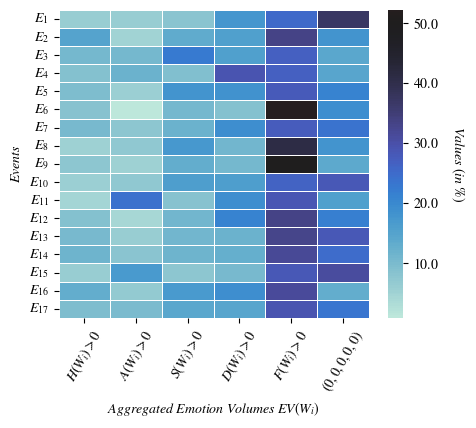

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5,4))

sns.heatmap(data=MyData_e_whole_hm2,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Aggregated\ Emotion\ Volumes\ EV(W_{i})$')
plt.ylabel(r'$Events$')

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((0.5,1.5,2.5,3.5,4.5,5.5))
ax.set_xticklabels(('$H(W_{i})>0$', '$A(W_{i})>0$', '$S(W_{i})>0$', \
                    '$D(W_{i})>0$', '$F(W_{i})>0$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of combined Emotion combinations (in %) across the whole datasets ", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("emotion_proportion_whole2.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_proportion_whole2.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)
plt.show()

In [ ]:
# set 51% Attack column as index and keep the columns that are needed

MyData_e_sub_hm2  = pd.DataFrame(MyData_e_sub[['happy_nonZero%', 'angry_nonZero%', \
                                                   'surprise_nonZero%', 'sad_nonZero%', \
                                                   'fear_nonZero%', 'happy_angry_surprise_sad_fear_allZero%_1']])
MyData_e_sub_hm2

,happy_nonZero%,angry_nonZero%,surprise_nonZero%,sad_nonZero%,fear_nonZero%,happy_angry_surprise_sad_fear_allZero%_1
17,0.000000,25.806452,3.225806,41.935484,19.354839,9.677419
18,3.200637,14.267516,13.296178,26.050955,33.582803,9.601911
19,5.696203,21.308017,11.814346,19.514768,34.493671,7.172996
20,4.402142,22.248662,7.911957,35.633551,20.523498,9.280190
21,8.556701,10.309278,13.195876,14.845361,26.391753,26.701031
22,0.000000,0.000000,7.142857,3.571429,14.285714,75.000000
23,4.494382,16.292135,7.303371,20.973783,30.149813,20.786517
24,4.130098,7.330924,15.401824,10.703838,41.627947,20.805369
25,0.000000,1.562500,9.375000,3.125000,82.812500,3.125000
26,3.550296,7.692308,15.384615,16.370809,26.627219,30.374753


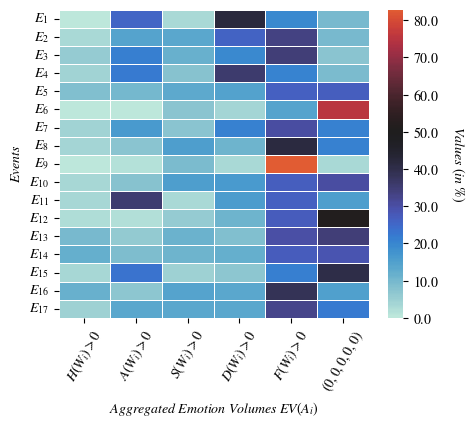

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5,4))

sns.heatmap(data=MyData_e_sub_hm2,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Aggregated\ Emotion\ Volumes\ EV(A_{i})$')
plt.ylabel(r'$Events$')

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((0.5,1.5,2.5,3.5,4.5,5.5))
ax.set_xticklabels(('$H(W_{i})>0$', '$A(W_{i})>0$', '$S(W_{i})>0$', \
                    '$D(W_{i})>0$', '$F(W_{i})>0$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of combined Emotion combinations (in %) across the subsets ", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("emotion_proportion_sub2.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_proportion_sub2.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)
plt.show()

In [ ]:
# keep the columns that are needed

MyData_b_hm2  = pd.DataFrame(MyData_b[['happy_nonZero%', 'angry_nonZero%', \
                                                   'surprise_nonZero%', 'sad_nonZero%', \
                                                   'fear_nonZero%', 'happy_angry_surprise_sad_fear_allZero%_1']])
MyData_b_hm2

,happy_nonZero%,angry_nonZero%,surprise_nonZero%,sad_nonZero%,fear_nonZero%,happy_angry_surprise_sad_fear_allZero%_1
0,8.333333,8.333333,6.666667,11.666667,21.666667,43.333333
1,17.568362,4.598102,12.261604,16.177175,31.763259,17.631499
2,35.924513,7.473770,15.267748,19.076168,16.167053,6.090748
3,11.885790,3.851262,19.123506,16.135458,26.228420,22.775564
4,13.214926,5.474988,20.726739,17.826299,26.576503,16.180544
5,5.656820,2.074167,9.930861,9.553740,52.482715,20.301697
6,15.925059,5.152225,15.690867,16.159251,26.229508,20.843091
7,6.062390,11.477340,17.245438,20.364921,32.548558,12.301354
8,7.692308,4.195804,12.167832,9.370629,53.286713,13.286713
9,20.000000,5.000000,20.000000,10.000000,15.000000,30.000000


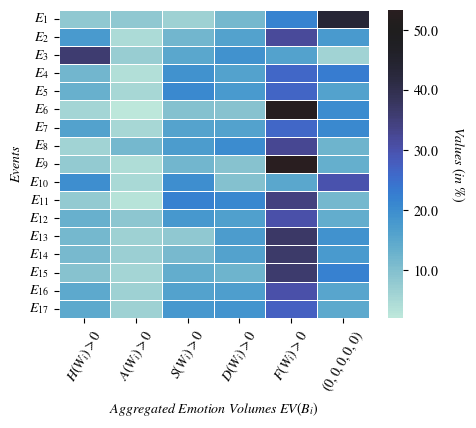

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import ticker

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5,4))

sns.heatmap(data=MyData_b_hm2,
            annot=False,
            linewidths=0.5,
            cbar=True,
            center=50)

# Get the colorbar from the Axes object
cbar = ax.collections[0].colorbar

# Change the colorbar labels to LaTeX font
cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('$%s$'))

# Add a title to the colorbar
cbar.set_label('$Values\ (in\ \%)$', rotation=270, labelpad=20)

plt.xlabel(r'$Aggregated\ Emotion\ Volumes\ EV(B_{i})$')
plt.ylabel(r'$Events$')

ax.set_yticks((0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5))
ax.set_yticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'), rotation=0)

ax.set_xticks((0.5,1.5,2.5,3.5,4.5,5.5))
ax.set_xticklabels(('$H(W_{i})>0$', '$A(W_{i})>0$', '$S(W_{i})>0$', \
                    '$D(W_{i})>0$', '$F(W_{i})>0$', '$(0,0,0,0,0)$'), rotation=60)

# Add a title
#plt.title("Proportion of combined Emotion combinations (in %) across the benchmark datasets ", y=1.1, fontsize = 24)

# Save the figure
plt.savefig("emotion_proportion_benchmark2.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("emotion_proportion_benchmark2.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

plt.show()

### Emotions line graphs

In [ ]:
import pandas as pd
df = pd.read_csv('happy.csv')
df_a = pd.read_csv('angry.csv')
df_s = pd.read_csv('surprised.csv')
df_d = pd.read_csv('sad.csv')
df_f = pd.read_csv('fear.csv')
df.head()

,Wi,Ai,Bi
0,0.053946,0.000010,0.078431
1,0.126194,0.032473,0.148395
2,0.087631,0.034958,0.409473
3,0.076211,0.026206,0.109120
4,0.068408,0.062964,0.103454


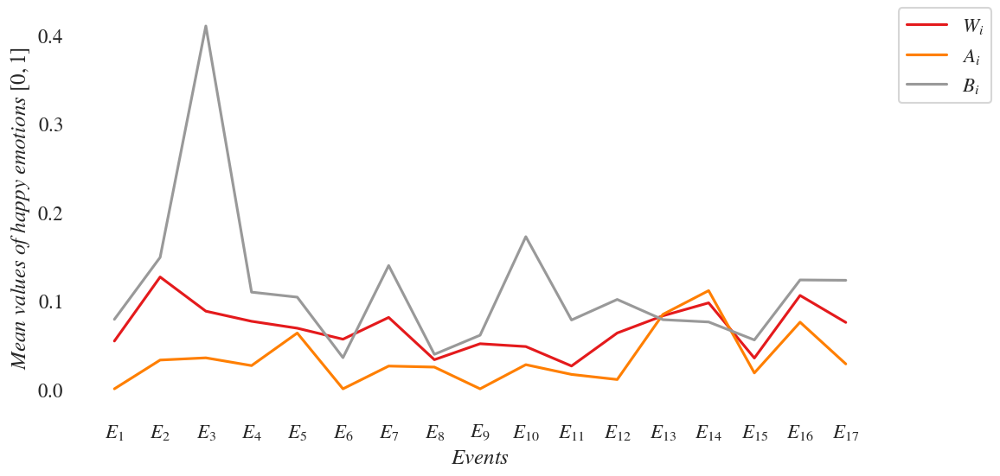

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX with 1 decimal place
def format_func(value, tick_number):
    return r'$%.1f$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,4))

# Plot the data
df.plot(kind='line',
        figsize=(12, 6),
        use_index=True,
        colormap='Set1',
        ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Events$')
plt.ylabel(r'$Mean\ values\ of\ happy\ emotions\ [0,1]$')

ax.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_xticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the y-axis
ax.yaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$W_{i}$', r'$A_{i}$', r'$B_{i}$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("Happy.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("happy.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

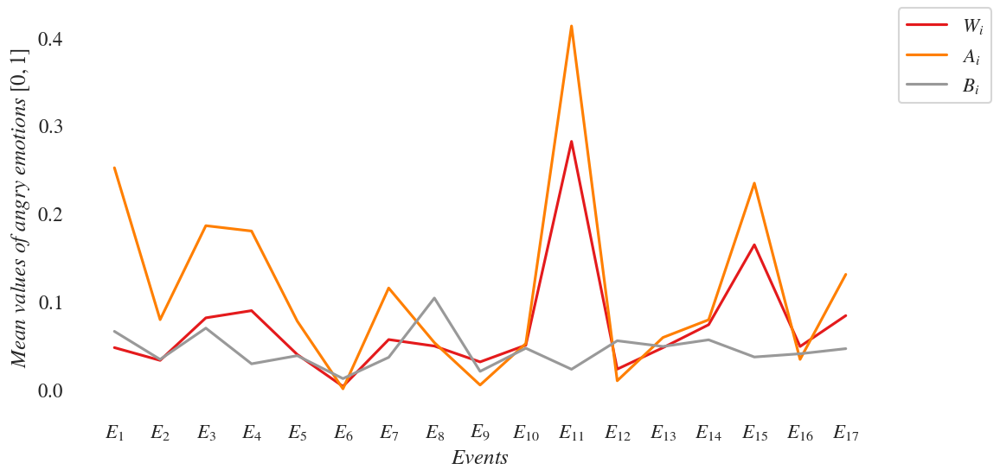

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX with 1 decimal place
def format_func(value, tick_number):
    return r'$%.1f$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,4))

# Plot the data
df_a.plot(kind='line',
        figsize=(12, 6),
        use_index=True,
        colormap='Set1',
        ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Events$')
plt.ylabel(r'$Mean\ values\ of\ angry\ emotions\ [0,1]$')

ax.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_xticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the y-axis
ax.yaxis.set_major_formatter(formatter)

# Apply the formatter to the legend labels
plt.legend([r'$W_{i}$', r'$A_{i}$', r'$B_{i}$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("Angry.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("angry.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

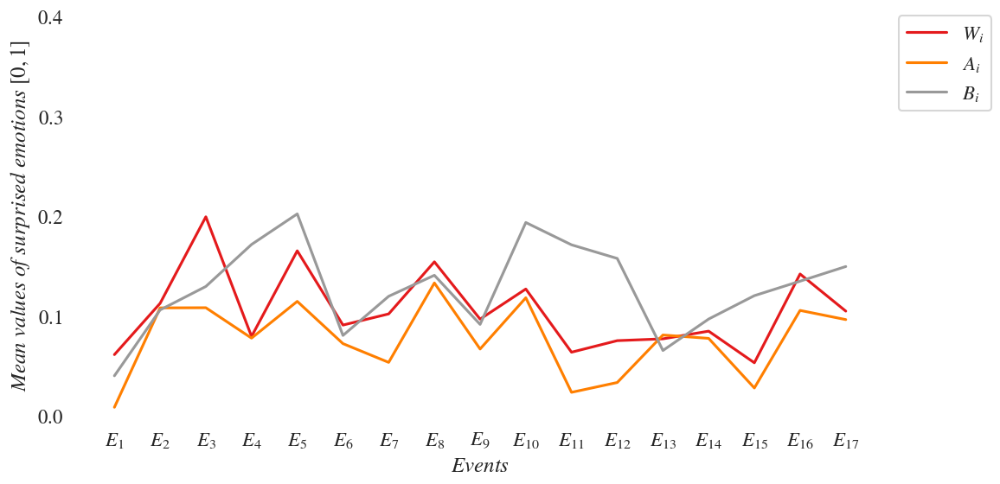

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX with 1 decimal place
def format_func(value, tick_number):
    return r'$%.1f$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,4))

# Plot the data
df_s.plot(kind='line',
        figsize=(12, 6),
        use_index=True,
        colormap='Set1',
        ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Events$')
plt.ylabel(r'$Mean\ values\ of\ surprised\ emotions\ [0,1]$')

ax.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_xticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the y-axis
ax.yaxis.set_major_formatter(formatter)

# Set the y-axis limits and ticks
ax.set_ylim(0, 0.4)
ax.set_yticks([i/10.0 for i in range(5)])

# Apply the formatter to the legend labels
plt.legend([r'$W_{i}$', r'$A_{i}$', r'$B_{i}$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("Surprised.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("surprised.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

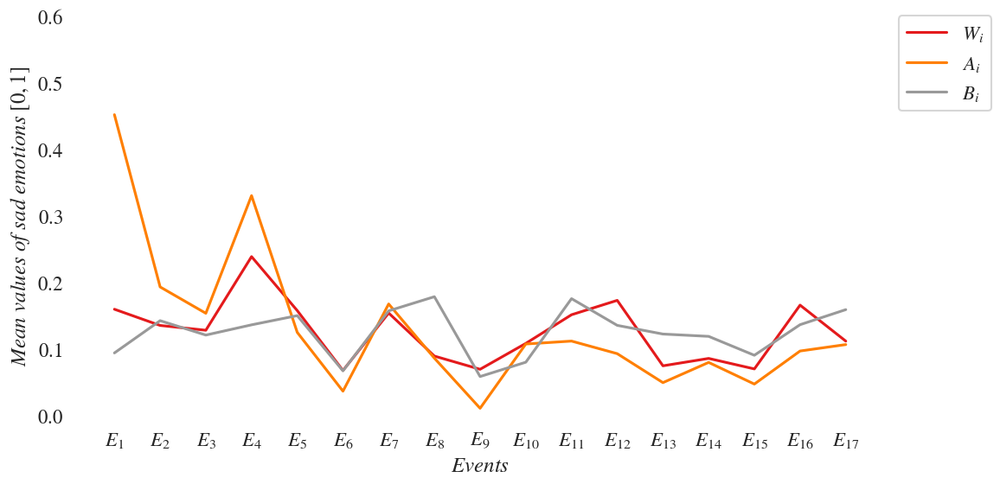

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX with 1 decimal place
def format_func(value, tick_number):
    return r'$%.1f$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,4))

# Plot the data
df_d.plot(kind='line',
        figsize=(12, 6),
        use_index=True,
        colormap='Set1',
        ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Events$')
plt.ylabel(r'$Mean\ values\ of\ sad\ emotions\ [0,1]$')

ax.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_xticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the y-axis
ax.yaxis.set_major_formatter(formatter)

# Set the y-axis limits and ticks
ax.set_ylim(0, 0.6)
ax.set_yticks([i/10.0 for i in range(7)])

# Apply the formatter to the legend labels
plt.legend([r'$W_{i}$', r'$A_{i}$', r'$B_{i}$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("Sad.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("sad.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

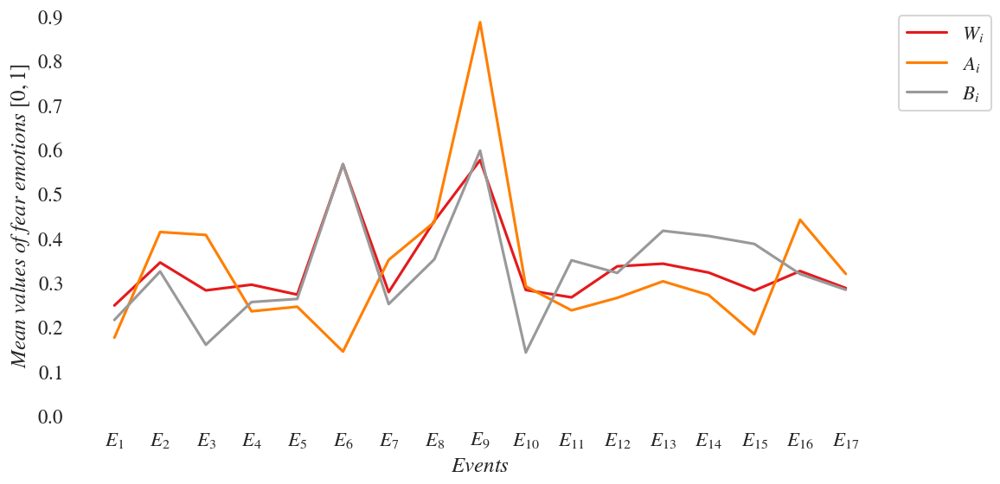

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

# Define a function to format the numbers using LaTeX with 1 decimal place
def format_func(value, tick_number):
    return r'$%.1f$' % value

# Create a formatter
formatter = FuncFormatter(format_func)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,4))

# Plot the data
df_f.plot(kind='line',
        figsize=(12, 6),
        use_index=True,
        colormap='Set1',
        ax=ax)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.xlabel(r'$Events$')
plt.ylabel(r'$Mean\ values\ of\ fear\ emotions\ [0,1]$')

ax.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16))
ax.set_xticklabels(('$E_1$', '$E_2$', '$E_3$', '$E_4$','$E_5$','$E_6$', '$E_7$', \
                    '$E_8$', '$E_9$', '$E_{10}$', '$E_{11}$', '$E_{12}$', \
                    '$E_{13}$', '$E_{14}$', '$E_{15}$', '$E_{16}$', '$E_{17}$'))

# Apply the formatter to the y-axis
ax.yaxis.set_major_formatter(formatter)

# Set the y-axis limits and ticks
ax.set_ylim(0, 0.9)
ax.set_yticks([i/10.0 for i in range(10)])

# Apply the formatter to the legend labels
plt.legend([r'$W_{i}$', r'$A_{i}$', r'$B_{i}$'], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("Fear.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("fear.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

### Peak days

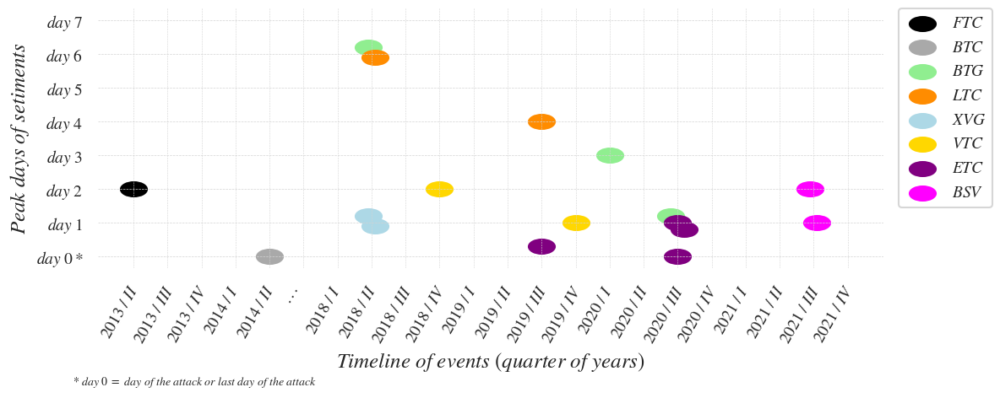

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter
from matplotlib.path import Path
from matplotlib.transforms import Affine2D

# Use LaTeX-style font
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

sns.set_theme(style="white", context="talk")

#Create an ellipse path by scaling a unit circle
ellipse = Path.unit_circle()
ellipse = ellipse.transformed(Affine2D().scale(2.2, 1.2))

#Define the y-axis tick labels
y_labels = ["$day\ 0*$", "$day\ 1$", "$day\ 2$", "$day\ 3$", "$day\ 4$", "$day\ 5$", "$day\ 6$", "$day\ 7$"]


#Define the x-axis tick labels
x_labels = ["$2013\ /\ II\ $", "$2013\ /\ III$", "$2013\ /\ IV\ $", "$2014\ /\ I\t\t$", "$2014\ /\ II\ $", \
            "$...\ $", "$2018\ /\ I\t\t$", "$2018\ /\ II\ $", "$2018\ /\ III$", "$2018\ /\ IV\ $", \
            "$2019\ /\ I\ \ $", "$2019\ /\ II\ $", "$2019\ /\ III$", "$2019\ /\ IV\ $", "$2020\ /\ I\ \ $", \
            "$2020\ /\ II\ $", "$2020\ /\ III$", "$2020\ /\ IV\ $", "$2021\ /\ I\ \ $", "$2021\ /\ II\ $", \
            "$2021\ /\ III$", "$2021\ /\ IV\ $"]

# Define the color codes and labels for the spots
colors = ["black", "darkgrey", "lightgreen", "darkorange", "lightblue", "gold", "purple", "fuchsia"]
labels = ["$FTC$", "$BTC$", "$BTG$", "$LTC$", "$XVG$", "$VTC$", "$ETC$", "$BSV$" ]

# Define the positions of the spots
positions = [(2, 0), (0, 4), [(6.2, 3, 1.2), (6.9, 14, 15.8)], [(5.9, 4), (7.1, 12)], \
             [(1.2,0.9),(6.9,7.1)], [(2,1),(9,13)], [(0.3,0,1,0.8),(12,16,16,16.2)], \
             [(2,1),(19.9,20.1)]]

#Create a figure and an axes object
fig, ax = plt.subplots(figsize=(12,4))

# Add the guided lines
for y in range(len(y_labels)):
    ax.axhline(y, xmin=0, xmax=len(x_labels), color='lightgrey', linestyle='--', linewidth=0.5)
for x in range(len(x_labels)):
  ax.axvline(x, ymin=0, ymax=len(y_labels), color='lightgrey', linestyle='--', linewidth=0.4)


#Plot the spots with color, label and position
for i in range(len(colors)):
  ax.scatter(positions[i][1], positions[i][0], color=colors[i], label=labels[i],  marker=ellipse, s=500)

# Add a textbox
#props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#ax.text(0.05, 0.05, "* this means this.", fontsize=8, transform=ax.transAxes, bbox=props)
# Add a textbox outside the figure, under the x-axis label
fig.text(0.1, -0.25, "$*\ day\ 0\ =\ day\ of\ the\ attack\ or\ last\ day\ of\ the\ attack$", fontsize=10, ha='left', va='bottom', transform=fig.transFigure)

#Set the y-axis ticks and labels
ax.set_yticks(range(len(y_labels)))
ax.set_yticklabels(y_labels, fontsize=14)

#Set the x-axis ticks and labels
#ax.set_xticks(range(len(x_labels)))
ax.set_xticks((-0.4,0.6,1.6,2.6,3.6,4.6,5.6,6.6,7.6,8.6,9.6,10.6,11.6,12.6,13.6,14.6,15.6,16.6,17.6,18.6,19.6,20.6))
ax.set_xticklabels(x_labels, fontsize=14, rotation=60)

plt.ylabel(r'$Peak\ days\ of\ setiments$')
plt.xlabel(r'$Timeline\ of\ events\ (quarter\ of\ years)$')

#Add a legend
ax.legend(fontsize=14, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("PeakDays.png",
            bbox_inches="tight",
            dpi=200)

# Save the figure
plt.savefig("PeakDays.eps",
            format='eps',
            bbox_inches="tight",
            dpi=200)


#Show the plot
plt.show()

### Compound scores with/without the word attack

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
MyData = pd.read_csv('Dataset_sub_bitcoingold_15_05_2018.csv')
MyData.head()

,Unnamed: 0,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,...,sentiment_score,sentiment_cat,sentiment_emotions,Happy,Angry,Surprise,Sad,Fear,date_time,only_date
0,0,https://twitter.com/kevinmonserrat/status/1000...,2018-05-25 23:47:15+00:00,A Hacker Has Attacked a #Bitcoin Gold Crypto E...,A Hacker Has Attacked a #Bitcoin Gold Crypto E...,1000161402932416513,"{'username': 'kevinmonserrat', 'displayname': ...",['https://coinidol.com/hacker-attacked-bitcoin...,['https://t.co/zOh1wUFAIP'],0,...,-0.7351,negative,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ...",0.0,0.0,1.0,0.0,0.0,2018-05-25 23:47:15,2018-05-25
1,1,https://twitter.com/RealCrusader84/status/1000...,2018-05-25 23:41:55+00:00,"""Bitcoin Gold loses over $18 million after hac...","""Bitcoin Gold loses over $18 million after hac...",1000160062189457410,"{'username': 'RealCrusader84', 'displayname': ...",['https://www.hackread.com/bitcoin-gold-loses-...,['https://t.co/kkOwB5LUD8'],0,...,-0.6597,negative,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...",0.0,0.0,0.0,1.0,0.0,2018-05-25 23:41:55,2018-05-25
2,2,https://twitter.com/mabling/status/10001583360...,2018-05-25 23:35:04+00:00,Bitcoin #Gold Responds to Recent Double Spend ...,Bitcoin #Gold Responds to Recent Double Spend ...,1000158336095006720,"{'username': 'mabling', 'displayname': 'NFT, B...",['http://www.dierotepille.com/index.php?id=14&...,['https://t.co/dvyZea7i9G'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:35:04,2018-05-25
3,3,https://twitter.com/karnadiutomo/status/100015...,2018-05-25 23:11:01+00:00,Bitcoin Gold Responds to Recent Double Spend A...,Bitcoin Gold Responds to Recent Double Spend A...,1000152286578999298,"{'username': 'karnadiutomo', 'displayname': 'W...",['https://okas.info/bitcoin-gold-responds-to-r...,['https://t.co/0ImQs3JDIR'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:11:01,2018-05-25
4,4,https://twitter.com/kpsliger1/status/100015080...,2018-05-25 23:05:09+00:00,05-25-2018 (repost from CCN): Bitcoin Gold Res...,05-25-2018 (repost from CCN): Bitcoin Gold Res...,1000150808330194945,"{'username': 'kpsliger1', 'displayname': 'Ken ...",['https://crypto712405964.wordpress.com/2018/0...,['https://t.co/XwfVak5goJ'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:05:09,2018-05-25


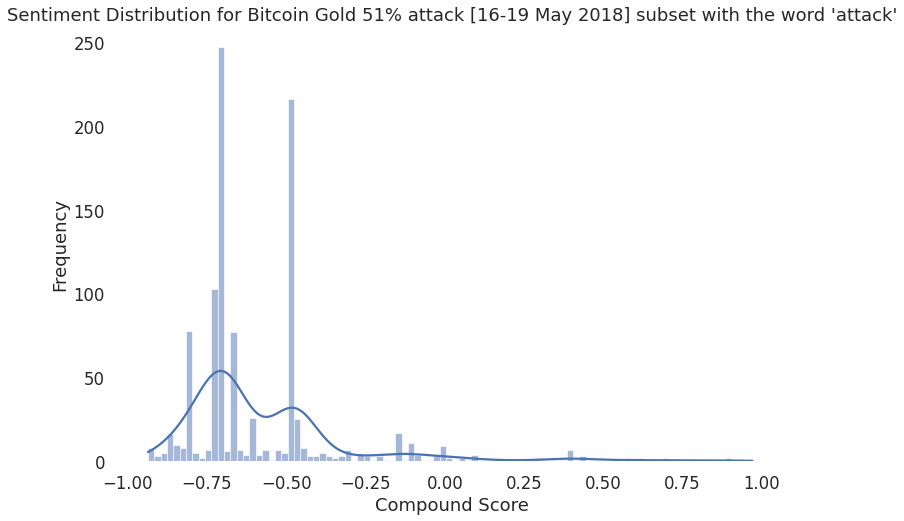

In [ ]:
# Visualise the result

# Import packages
import matplotlib.pyplot as plt
import seaborn as sns

# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,8))

# Use histplot
sns.histplot(x="sentiment_score",
             data=MyData,
             # kernal density estimation
             kde=True,
             # control the bin width
             binwidth=0.02
             )

# Add label to horiztontal axis
ax.set_xlabel("Compound Score")

# Remove ylabel
ax.set_ylabel("Frequency")

# Add a title
ax.set_title("Sentiment Distribution for Bitcoin Gold 51% attack [16-19 May 2018] subset with the word 'attack'", fontsize = 18)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("sentDist1.png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()

In [ ]:
import re
MyData2 = MyData
#Remove the word 'attack'
MyData2['clean_content'] = MyData2['clean_content'].str.replace(r"attack", "")


MyData2.head()

,Unnamed: 0,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,...,sentiment_score,sentiment_cat,sentiment_emotions,Happy,Angry,Surprise,Sad,Fear,date_time,only_date
0,0,https://twitter.com/kevinmonserrat/status/1000...,2018-05-25 23:47:15+00:00,A Hacker Has Attacked a #Bitcoin Gold Crypto E...,A Hacker Has Attacked a #Bitcoin Gold Crypto E...,1000161402932416513,"{'username': 'kevinmonserrat', 'displayname': ...",['https://coinidol.com/hacker-attacked-bitcoin...,['https://t.co/zOh1wUFAIP'],0,...,-0.7351,negative,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ...",0.0,0.0,1.0,0.0,0.0,2018-05-25 23:47:15,2018-05-25
1,1,https://twitter.com/RealCrusader84/status/1000...,2018-05-25 23:41:55+00:00,"""Bitcoin Gold loses over $18 million after hac...","""Bitcoin Gold loses over $18 million after hac...",1000160062189457410,"{'username': 'RealCrusader84', 'displayname': ...",['https://www.hackread.com/bitcoin-gold-loses-...,['https://t.co/kkOwB5LUD8'],0,...,-0.6597,negative,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...",0.0,0.0,0.0,1.0,0.0,2018-05-25 23:41:55,2018-05-25
2,2,https://twitter.com/mabling/status/10001583360...,2018-05-25 23:35:04+00:00,Bitcoin #Gold Responds to Recent Double Spend ...,Bitcoin #Gold Responds to Recent Double Spend ...,1000158336095006720,"{'username': 'mabling', 'displayname': 'NFT, B...",['http://www.dierotepille.com/index.php?id=14&...,['https://t.co/dvyZea7i9G'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:35:04,2018-05-25
3,3,https://twitter.com/karnadiutomo/status/100015...,2018-05-25 23:11:01+00:00,Bitcoin Gold Responds to Recent Double Spend A...,Bitcoin Gold Responds to Recent Double Spend A...,1000152286578999298,"{'username': 'karnadiutomo', 'displayname': 'W...",['https://okas.info/bitcoin-gold-responds-to-r...,['https://t.co/0ImQs3JDIR'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:11:01,2018-05-25
4,4,https://twitter.com/kpsliger1/status/100015080...,2018-05-25 23:05:09+00:00,05-25-2018 (repost from CCN): Bitcoin Gold Res...,05-25-2018 (repost from CCN): Bitcoin Gold Res...,1000150808330194945,"{'username': 'kpsliger1', 'displayname': 'Ken ...",['https://crypto712405964.wordpress.com/2018/0...,['https://t.co/XwfVak5goJ'],0,...,-0.4767,negative,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.0,0.0,0.0,0.0,0.0,2018-05-25 23:05:09,2018-05-25


In [ ]:
# Import the library for sentiment analysis

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
# Define some functions for convenience

def getSentScore(text):
  myScore = sia.polarity_scores(text)['compound']
  return(myScore)

In [ ]:
# Generate a new column to store the compound scores

MyData2['sentiment_score2'] = MyData2.apply(lambda x: getSentScore(x['clean_content']), axis=1)

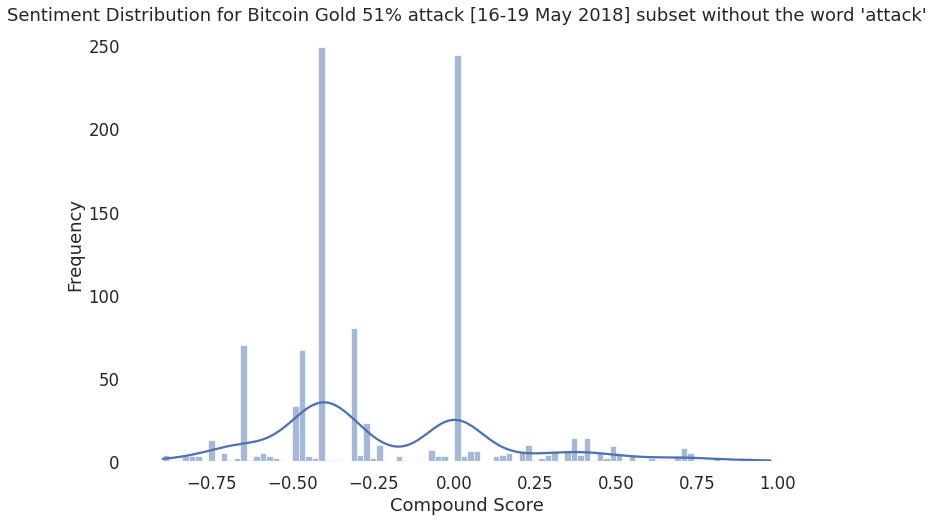

In [ ]:
# Visualise the result

# Import packages
import matplotlib.pyplot as plt
import seaborn as sns

# Set a more specific style
sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,8))

# Use histplot
sns.histplot(x="sentiment_score2",
             data=MyData2,
             # kernal density estimation
             kde=True,
             # control the bin width
             binwidth=0.02
             )

# Add label to horiztontal axis
ax.set_xlabel("Compound Score")

# Remove ylabel
ax.set_ylabel("Frequency")

# Add a title
ax.set_title("Sentiment Distribution for Bitcoin Gold 51% attack [16-19 May 2018] subset without the word 'attack'", fontsize = 18)

# Remove the border line
sns.despine(left=True, bottom=True)

# Save the figure
plt.savefig("sentDist2.png",
            bbox_inches="tight",
            dpi=200)

# Show nicely in the notebook
plt.show()